In [83]:
from sys import path as syspath
from os import path as ospath
syspath.append(ospath.join(ospath.expanduser("~"), '/data/hashemi/Freetime/Freetime-DQN/Deep-Freetime/SB3_f'))

In [84]:
import torch as torch
torch._C._cuda_getDeviceCount() > 0

True

In [85]:
import os
import gym 
import matplotlib.pyplot as plt
import numpy as np 
from SB3_f.sb3f import DQN
from SB3_f.sb3f.common.vec_env import DummyVecEnv
from SB3_f.sb3f.common.evaluation import evaluate_policy
from SB3_f.sb3f.common.callbacks import EvalCallback, StopTrainingOnRewardThreshold


In [86]:
rewards = [[1,1,6],[1,3,4]]
from GridEnv import WindyGridworld
env = WindyGridworld(
        height=20,
        width=11,
        rewards=rewards,
        wind=True,
        allowed_actions=['L', 'R', 'C'],
        reward_terminates_episode=False
    )

In [87]:
episodes = 5
for episode in range(1, episodes+1):
    state = env.reset()
    done = False
    score = 0 
    
    while not done:
        env.render()
        action = env.action_space.sample()
        n_state, reward, done, info = env.step(action)
        score+=reward
    print('Episode:{} Score:{}'.format(episode, score))
env.close()

QObject::moveToThread: Current thread (0x55e0d6cd7b70) is not the object's thread (0x55e0d719f160).
Cannot move to target thread (0x55e0d6cd7b70)

QObject::moveToThread: Current thread (0x55e0d6cd7b70) is not the object's thread (0x55e0d719f160).
Cannot move to target thread (0x55e0d6cd7b70)

QObject::moveToThread: Current thread (0x55e0d6cd7b70) is not the object's thread (0x55e0d719f160).
Cannot move to target thread (0x55e0d6cd7b70)

QObject::moveToThread: Current thread (0x55e0d6cd7b70) is not the object's thread (0x55e0d719f160).
Cannot move to target thread (0x55e0d6cd7b70)

QObject::moveToThread: Current thread (0x55e0d6cd7b70) is not the object's thread (0x55e0d719f160).
Cannot move to target thread (0x55e0d6cd7b70)

QObject::moveToThread: Current thread (0x55e0d6cd7b70) is not the object's thread (0x55e0d719f160).
Cannot move to target thread (0x55e0d6cd7b70)

QObject::moveToThread: Current thread (0x55e0d6cd7b70) is not the object's thread (0x55e0d719f160).
Cannot move to tar

Episode:1 Score:0
Episode:2 Score:0
Episode:3 Score:0
Episode:4 Score:0
Episode:5 Score:0


In [88]:
save_path = os.path.join('Training', 'Saved Models')
log_path = os.path.join('Training', 'Logs Bias Only', 'Env 2')

In [89]:
from SB3_f.sb3f.common.callbacks import EvalCallback, StopTrainingOnRewardThreshold

stop_callback = StopTrainingOnRewardThreshold(reward_threshold=3, verbose=1)
eval_callback = EvalCallback(env, 
                             callback_on_new_best=stop_callback, 
                             eval_freq=10000, 
                             best_model_save_path=save_path, 
                             verbose=1)

In [90]:
# try 0.2 exploration period
model = DQN('CnnPolicy', env, exploration_fraction=0.2,
  exploration_final_eps=0.1,learning_starts=100000, verbose = 1, buffer_size = 50000,target_update_interval=1000, tensorboard_log=log_path)

Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env in a VecTransposeImage.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


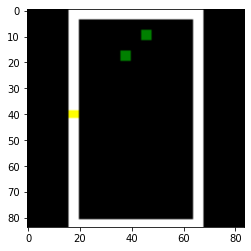

In [91]:
from SB3_f.sb3f.common.utils import obs_as_tensor
device = torch.device('cuda:0')

obs = env.canvas
plt.imshow(obs)


# Check the Network Q Value
observation = np.transpose(obs, (2, 0, 1))
observation = observation[np.newaxis, ...]
observation = obs_as_tensor(observation, device)
with torch.no_grad():
        q_values = model.q_net(observation)

In [92]:
q_values

tensor([[1.9935, 1.9880, 2.0034]], device='cuda:0')

In [93]:
model.learn(total_timesteps=1000000,callback=eval_callback, tb_log_name='Env2_0.2exp_1M')

Logging to Training/Logs Bias Only/Env 2/Env2_0.2exp_1M_16
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0        |
|    exploration_rate | 1        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 3072     |
|    time_elapsed     | 0        |
|    total_timesteps  | 52       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.125    |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 3301     |
|    time_elapsed     | 0        |
|    total_timesteps  | 121      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.0833   |
|    exploration_rate | 0.999  

/data/hashemi/Freetime/Freetime-DQN/Deep-Freetime/SB3_f/sb3f/common/callbacks.py:388: UserWarning: Training and eval env are not of the same type<sb3f.common.vec_env.vec_transpose.VecTransposeImage object at 0x7f2a25454910> != <sb3f.common.vec_env.dummy_vec_env.DummyVecEnv object at 0x7f2a254547c0>
  warnings.warn("Training and eval env are not of the same type" f"{self.training_env} != {self.eval_env}")


----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.0833   |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 36       |
|    fps              | 3358     |
|    time_elapsed     | 0        |
|    total_timesteps  | 554      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.075    |
|    exploration_rate | 0.997    |
| time/               |          |
|    episodes         | 40       |
|    fps              | 3368     |
|    time_elapsed     | 0        |
|    total_timesteps  | 621      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.0682   |
|    exploration_rate | 0.997    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes         | 124      |
|    fps              | 3380     |
|    time_elapsed     | 0        |
|    total_timesteps  | 1717     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes         | 128      |
|    fps              | 3385     |
|    time_elapsed     | 0        |
|    total_timesteps  | 1784     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.986    |
| time/               |          |
|    episodes         | 212      |
|    fps              | 3408     |
|    time_elapsed     | 0        |
|    total_timesteps  | 3047     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.986    |
| time/               |          |
|    episodes         | 216      |
|    fps              | 3408     |
|    time_elapsed     | 0        |
|    total_timesteps  | 3108     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.986    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.981    |
| time/               |          |
|    episodes         | 300      |
|    fps              | 3417     |
|    time_elapsed     | 1        |
|    total_timesteps  | 4329     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.98     |
| time/               |          |
|    episodes         | 304      |
|    fps              | 3418     |
|    time_elapsed     | 1        |
|    total_timesteps  | 4394     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.98     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.974    |
| time/               |          |
|    episodes         | 388      |
|    fps              | 3435     |
|    time_elapsed     | 1        |
|    total_timesteps  | 5729     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.974    |
| time/               |          |
|    episodes         | 392      |
|    fps              | 3436     |
|    time_elapsed     | 1        |
|    total_timesteps  | 5806     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.974    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.968    |
| time/               |          |
|    episodes         | 476      |
|    fps              | 3440     |
|    time_elapsed     | 2        |
|    total_timesteps  | 7062     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.968    |
| time/               |          |
|    episodes         | 480      |
|    fps              | 3441     |
|    time_elapsed     | 2        |
|    total_timesteps  | 7124     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.968    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.962    |
| time/               |          |
|    episodes         | 564      |
|    fps              | 3446     |
|    time_elapsed     | 2        |
|    total_timesteps  | 8422     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.962    |
| time/               |          |
|    episodes         | 568      |
|    fps              | 3446     |
|    time_elapsed     | 2        |
|    total_timesteps  | 8479     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.962    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.956    |
| time/               |          |
|    episodes         | 652      |
|    fps              | 3451     |
|    time_elapsed     | 2        |
|    total_timesteps  | 9818     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.955    |
| time/               |          |
|    episodes         | 656      |
|    fps              | 3451     |
|    time_elapsed     | 2        |
|    total_timesteps  | 9893     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.955    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.951    |
| time/               |          |
|    episodes         | 736      |
|    fps              | 3350     |
|    time_elapsed     | 3        |
|    total_timesteps  | 10964    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.95     |
| time/               |          |
|    episodes         | 740      |
|    fps              | 3349     |
|    time_elapsed     | 3        |
|    total_timesteps  | 11014    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.95     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.945    |
| time/               |          |
|    episodes         | 824      |
|    fps              | 3359     |
|    time_elapsed     | 3        |
|    total_timesteps  | 12226    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.945    |
| time/               |          |
|    episodes         | 828      |
|    fps              | 3360     |
|    time_elapsed     | 3        |
|    total_timesteps  | 12290    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.944    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.94     |
| time/               |          |
|    episodes         | 912      |
|    fps              | 3364     |
|    time_elapsed     | 3        |
|    total_timesteps  | 13411    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.939    |
| time/               |          |
|    episodes         | 916      |
|    fps              | 3363     |
|    time_elapsed     | 3        |
|    total_timesteps  | 13454    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.939    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.934    |
| time/               |          |
|    episodes         | 1000     |
|    fps              | 3367     |
|    time_elapsed     | 4        |
|    total_timesteps  | 14663    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.934    |
| time/               |          |
|    episodes         | 1004     |
|    fps              | 3367     |
|    time_elapsed     | 4        |
|    total_timesteps  | 14717    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.934    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.928    |
| time/               |          |
|    episodes         | 1088     |
|    fps              | 3369     |
|    time_elapsed     | 4        |
|    total_timesteps  | 15940    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.928    |
| time/               |          |
|    episodes         | 1092     |
|    fps              | 3368     |
|    time_elapsed     | 4        |
|    total_timesteps  | 16007    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.928    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.922    |
| time/               |          |
|    episodes         | 1176     |
|    fps              | 3374     |
|    time_elapsed     | 5        |
|    total_timesteps  | 17296    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.922    |
| time/               |          |
|    episodes         | 1180     |
|    fps              | 3374     |
|    time_elapsed     | 5        |
|    total_timesteps  | 17345    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.922    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.916    |
| time/               |          |
|    episodes         | 1264     |
|    fps              | 3378     |
|    time_elapsed     | 5        |
|    total_timesteps  | 18598    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.916    |
| time/               |          |
|    episodes         | 1268     |
|    fps              | 3378     |
|    time_elapsed     | 5        |
|    total_timesteps  | 18650    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.916    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.911    |
| time/               |          |
|    episodes         | 1352     |
|    fps              | 3380     |
|    time_elapsed     | 5        |
|    total_timesteps  | 19778    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.911    |
| time/               |          |
|    episodes         | 1356     |
|    fps              | 3380     |
|    time_elapsed     | 5        |
|    total_timesteps  | 19858    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.91     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 1436     |
|    fps              | 3344     |
|    time_elapsed     | 6        |
|    total_timesteps  | 21066    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 1440     |
|    fps              | 3344     |
|    time_elapsed     | 6        |
|    total_timesteps  | 21142    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.899    |
| time/               |          |
|    episodes         | 1524     |
|    fps              | 3349     |
|    time_elapsed     | 6        |
|    total_timesteps  | 22366    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.899    |
| time/               |          |
|    episodes         | 1528     |
|    fps              | 3350     |
|    time_elapsed     | 6        |
|    total_timesteps  | 22423    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.899    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.893    |
| time/               |          |
|    episodes         | 1612     |
|    fps              | 3355     |
|    time_elapsed     | 7        |
|    total_timesteps  | 23697    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.893    |
| time/               |          |
|    episodes         | 1616     |
|    fps              | 3355     |
|    time_elapsed     | 7        |
|    total_timesteps  | 23767    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.893    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.888    |
| time/               |          |
|    episodes         | 1700     |
|    fps              | 3356     |
|    time_elapsed     | 7        |
|    total_timesteps  | 24929    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.888    |
| time/               |          |
|    episodes         | 1704     |
|    fps              | 3356     |
|    time_elapsed     | 7        |
|    total_timesteps  | 24999    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.887    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.882    |
| time/               |          |
|    episodes         | 1788     |
|    fps              | 3361     |
|    time_elapsed     | 7        |
|    total_timesteps  | 26292    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.881    |
| time/               |          |
|    episodes         | 1792     |
|    fps              | 3361     |
|    time_elapsed     | 7        |
|    total_timesteps  | 26348    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.881    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.876    |
| time/               |          |
|    episodes         | 1876     |
|    fps              | 3364     |
|    time_elapsed     | 8        |
|    total_timesteps  | 27630    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.875    |
| time/               |          |
|    episodes         | 1880     |
|    fps              | 3364     |
|    time_elapsed     | 8        |
|    total_timesteps  | 27710    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.875    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.869    |
| time/               |          |
|    episodes         | 1964     |
|    fps              | 3367     |
|    time_elapsed     | 8        |
|    total_timesteps  | 29029    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.869    |
| time/               |          |
|    episodes         | 1968     |
|    fps              | 3367     |
|    time_elapsed     | 8        |
|    total_timesteps  | 29092    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.869    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.864    |
| time/               |          |
|    episodes         | 2048     |
|    fps              | 3342     |
|    time_elapsed     | 9        |
|    total_timesteps  | 30284    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.863    |
| time/               |          |
|    episodes         | 2052     |
|    fps              | 3342     |
|    time_elapsed     | 9        |
|    total_timesteps  | 30342    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.863    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.858    |
| time/               |          |
|    episodes         | 2136     |
|    fps              | 3346     |
|    time_elapsed     | 9        |
|    total_timesteps  | 31644    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.857    |
| time/               |          |
|    episodes         | 2140     |
|    fps              | 3346     |
|    time_elapsed     | 9        |
|    total_timesteps  | 31707    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.857    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.852    |
| time/               |          |
|    episodes         | 2224     |
|    fps              | 3350     |
|    time_elapsed     | 9        |
|    total_timesteps  | 32964    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.851    |
| time/               |          |
|    episodes         | 2228     |
|    fps              | 3349     |
|    time_elapsed     | 9        |
|    total_timesteps  | 33028    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.851    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.846    |
| time/               |          |
|    episodes         | 2312     |
|    fps              | 3352     |
|    time_elapsed     | 10       |
|    total_timesteps  | 34256    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.846    |
| time/               |          |
|    episodes         | 2316     |
|    fps              | 3352     |
|    time_elapsed     | 10       |
|    total_timesteps  | 34300    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.845    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.841    |
| time/               |          |
|    episodes         | 2400     |
|    fps              | 3354     |
|    time_elapsed     | 10       |
|    total_timesteps  | 35437    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.84     |
| time/               |          |
|    episodes         | 2404     |
|    fps              | 3354     |
|    time_elapsed     | 10       |
|    total_timesteps  | 35498    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.84     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.834    |
| time/               |          |
|    episodes         | 2488     |
|    fps              | 3355     |
|    time_elapsed     | 10       |
|    total_timesteps  | 36787    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.834    |
| time/               |          |
|    episodes         | 2492     |
|    fps              | 3355     |
|    time_elapsed     | 10       |
|    total_timesteps  | 36846    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.834    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.829    |
| time/               |          |
|    episodes         | 2576     |
|    fps              | 3357     |
|    time_elapsed     | 11       |
|    total_timesteps  | 38110    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.828    |
| time/               |          |
|    episodes         | 2580     |
|    fps              | 3357     |
|    time_elapsed     | 11       |
|    total_timesteps  | 38164    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.828    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.823    |
| time/               |          |
|    episodes         | 2664     |
|    fps              | 3360     |
|    time_elapsed     | 11       |
|    total_timesteps  | 39380    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.823    |
| time/               |          |
|    episodes         | 2668     |
|    fps              | 3360     |
|    time_elapsed     | 11       |
|    total_timesteps  | 39429    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.822    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.817    |
| time/               |          |
|    episodes         | 2748     |
|    fps              | 3342     |
|    time_elapsed     | 12       |
|    total_timesteps  | 40665    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.817    |
| time/               |          |
|    episodes         | 2752     |
|    fps              | 3343     |
|    time_elapsed     | 12       |
|    total_timesteps  | 40736    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.816    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.811    |
| time/               |          |
|    episodes         | 2836     |
|    fps              | 3345     |
|    time_elapsed     | 12       |
|    total_timesteps  | 42050    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.811    |
| time/               |          |
|    episodes         | 2840     |
|    fps              | 3345     |
|    time_elapsed     | 12       |
|    total_timesteps  | 42106    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.81     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.805    |
| time/               |          |
|    episodes         | 2924     |
|    fps              | 3342     |
|    time_elapsed     | 12       |
|    total_timesteps  | 43357    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.805    |
| time/               |          |
|    episodes         | 2928     |
|    fps              | 3342     |
|    time_elapsed     | 12       |
|    total_timesteps  | 43422    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.804    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.799    |
| time/               |          |
|    episodes         | 3012     |
|    fps              | 3341     |
|    time_elapsed     | 13       |
|    total_timesteps  | 44702    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.799    |
| time/               |          |
|    episodes         | 3016     |
|    fps              | 3341     |
|    time_elapsed     | 13       |
|    total_timesteps  | 44771    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.798    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.793    |
| time/               |          |
|    episodes         | 3100     |
|    fps              | 3340     |
|    time_elapsed     | 13       |
|    total_timesteps  | 46047    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.793    |
| time/               |          |
|    episodes         | 3104     |
|    fps              | 3339     |
|    time_elapsed     | 13       |
|    total_timesteps  | 46092    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.792    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.787    |
| time/               |          |
|    episodes         | 3188     |
|    fps              | 3333     |
|    time_elapsed     | 14       |
|    total_timesteps  | 47295    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.787    |
| time/               |          |
|    episodes         | 3192     |
|    fps              | 3333     |
|    time_elapsed     | 14       |
|    total_timesteps  | 47373    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.787    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.781    |
| time/               |          |
|    episodes         | 3276     |
|    fps              | 3334     |
|    time_elapsed     | 14       |
|    total_timesteps  | 48610    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.781    |
| time/               |          |
|    episodes         | 3280     |
|    fps              | 3333     |
|    time_elapsed     | 14       |
|    total_timesteps  | 48659    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.781    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.775    |
| time/               |          |
|    episodes         | 3364     |
|    fps              | 3334     |
|    time_elapsed     | 14       |
|    total_timesteps  | 49910    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.775    |
| time/               |          |
|    episodes         | 3368     |
|    fps              | 3334     |
|    time_elapsed     | 14       |
|    total_timesteps  | 49973    |
----------------------------------
Eval num_timesteps=50000, episode_reward=0.00 +/- 0.00
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 0        |
| ro

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.77     |
| time/               |          |
|    episodes         | 3448     |
|    fps              | 3323     |
|    time_elapsed     | 15       |
|    total_timesteps  | 51171    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.769    |
| time/               |          |
|    episodes         | 3452     |
|    fps              | 3324     |
|    time_elapsed     | 15       |
|    total_timesteps  | 51241    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.769    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.764    |
| time/               |          |
|    episodes         | 3536     |
|    fps              | 3329     |
|    time_elapsed     | 15       |
|    total_timesteps  | 52424    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.764    |
| time/               |          |
|    episodes         | 3540     |
|    fps              | 3330     |
|    time_elapsed     | 15       |
|    total_timesteps  | 52476    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.764    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.759    |
| time/               |          |
|    episodes         | 3624     |
|    fps              | 3334     |
|    time_elapsed     | 16       |
|    total_timesteps  | 53629    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.758    |
| time/               |          |
|    episodes         | 3628     |
|    fps              | 3335     |
|    time_elapsed     | 16       |
|    total_timesteps  | 53706    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.758    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.752    |
| time/               |          |
|    episodes         | 3712     |
|    fps              | 3341     |
|    time_elapsed     | 16       |
|    total_timesteps  | 55098    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.752    |
| time/               |          |
|    episodes         | 3716     |
|    fps              | 3341     |
|    time_elapsed     | 16       |
|    total_timesteps  | 55143    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.752    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.746    |
| time/               |          |
|    episodes         | 3800     |
|    fps              | 3347     |
|    time_elapsed     | 16       |
|    total_timesteps  | 56401    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.746    |
| time/               |          |
|    episodes         | 3804     |
|    fps              | 3347     |
|    time_elapsed     | 16       |
|    total_timesteps  | 56445    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.746    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.74     |
| time/               |          |
|    episodes         | 3888     |
|    fps              | 3352     |
|    time_elapsed     | 17       |
|    total_timesteps  | 57715    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.74     |
| time/               |          |
|    episodes         | 3892     |
|    fps              | 3352     |
|    time_elapsed     | 17       |
|    total_timesteps  | 57780    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.74     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.735    |
| time/               |          |
|    episodes         | 3976     |
|    fps              | 3356     |
|    time_elapsed     | 17       |
|    total_timesteps  | 58930    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.735    |
| time/               |          |
|    episodes         | 3980     |
|    fps              | 3356     |
|    time_elapsed     | 17       |
|    total_timesteps  | 58978    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.734    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.729    |
| time/               |          |
|    episodes         | 4060     |
|    fps              | 3347     |
|    time_elapsed     | 17       |
|    total_timesteps  | 60214    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.729    |
| time/               |          |
|    episodes         | 4064     |
|    fps              | 3347     |
|    time_elapsed     | 18       |
|    total_timesteps  | 60278    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.728    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.723    |
| time/               |          |
|    episodes         | 4148     |
|    fps              | 3351     |
|    time_elapsed     | 18       |
|    total_timesteps  | 61497    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.723    |
| time/               |          |
|    episodes         | 4152     |
|    fps              | 3351     |
|    time_elapsed     | 18       |
|    total_timesteps  | 61539    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.723    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.718    |
| time/               |          |
|    episodes         | 4236     |
|    fps              | 3355     |
|    time_elapsed     | 18       |
|    total_timesteps  | 62715    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.717    |
| time/               |          |
|    episodes         | 4240     |
|    fps              | 3355     |
|    time_elapsed     | 18       |
|    total_timesteps  | 62778    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.717    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.712    |
| time/               |          |
|    episodes         | 4324     |
|    fps              | 3358     |
|    time_elapsed     | 19       |
|    total_timesteps  | 63946    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.712    |
| time/               |          |
|    episodes         | 4328     |
|    fps              | 3359     |
|    time_elapsed     | 19       |
|    total_timesteps  | 64018    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.712    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.706    |
| time/               |          |
|    episodes         | 4412     |
|    fps              | 3362     |
|    time_elapsed     | 19       |
|    total_timesteps  | 65292    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.706    |
| time/               |          |
|    episodes         | 4416     |
|    fps              | 3362     |
|    time_elapsed     | 19       |
|    total_timesteps  | 65326    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.706    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.701    |
| time/               |          |
|    episodes         | 4500     |
|    fps              | 3365     |
|    time_elapsed     | 19       |
|    total_timesteps  | 66419    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.701    |
| time/               |          |
|    episodes         | 4504     |
|    fps              | 3365     |
|    time_elapsed     | 19       |
|    total_timesteps  | 66463    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.701    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.695    |
| time/               |          |
|    episodes         | 4588     |
|    fps              | 3369     |
|    time_elapsed     | 20       |
|    total_timesteps  | 67759    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.695    |
| time/               |          |
|    episodes         | 4592     |
|    fps              | 3369     |
|    time_elapsed     | 20       |
|    total_timesteps  | 67779    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.695    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.69     |
| time/               |          |
|    episodes         | 4676     |
|    fps              | 3372     |
|    time_elapsed     | 20       |
|    total_timesteps  | 68884    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.69     |
| time/               |          |
|    episodes         | 4680     |
|    fps              | 3372     |
|    time_elapsed     | 20       |
|    total_timesteps  | 68948    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.689    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.684    |
| time/               |          |
|    episodes         | 4760     |
|    fps              | 3364     |
|    time_elapsed     | 20       |
|    total_timesteps  | 70212    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.684    |
| time/               |          |
|    episodes         | 4764     |
|    fps              | 3364     |
|    time_elapsed     | 20       |
|    total_timesteps  | 70256    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.684    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.679    |
| time/               |          |
|    episodes         | 4848     |
|    fps              | 3368     |
|    time_elapsed     | 21       |
|    total_timesteps  | 71442    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.678    |
| time/               |          |
|    episodes         | 4852     |
|    fps              | 3368     |
|    time_elapsed     | 21       |
|    total_timesteps  | 71514    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.678    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.673    |
| time/               |          |
|    episodes         | 4936     |
|    fps              | 3372     |
|    time_elapsed     | 21       |
|    total_timesteps  | 72686    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.673    |
| time/               |          |
|    episodes         | 4940     |
|    fps              | 3372     |
|    time_elapsed     | 21       |
|    total_timesteps  | 72766    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.672    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.667    |
| time/               |          |
|    episodes         | 5024     |
|    fps              | 3376     |
|    time_elapsed     | 21       |
|    total_timesteps  | 74090    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.666    |
| time/               |          |
|    episodes         | 5028     |
|    fps              | 3376     |
|    time_elapsed     | 21       |
|    total_timesteps  | 74128    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.666    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.661    |
| time/               |          |
|    episodes         | 5112     |
|    fps              | 3380     |
|    time_elapsed     | 22       |
|    total_timesteps  | 75399    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.66     |
| time/               |          |
|    episodes         | 5116     |
|    fps              | 3380     |
|    time_elapsed     | 22       |
|    total_timesteps  | 75466    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.66     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.655    |
| time/               |          |
|    episodes         | 5200     |
|    fps              | 3383     |
|    time_elapsed     | 22       |
|    total_timesteps  | 76666    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.655    |
| time/               |          |
|    episodes         | 5204     |
|    fps              | 3383     |
|    time_elapsed     | 22       |
|    total_timesteps  | 76704    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.655    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.649    |
| time/               |          |
|    episodes         | 5288     |
|    fps              | 3386     |
|    time_elapsed     | 23       |
|    total_timesteps  | 77966    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.649    |
| time/               |          |
|    episodes         | 5292     |
|    fps              | 3387     |
|    time_elapsed     | 23       |
|    total_timesteps  | 78046    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.649    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.643    |
| time/               |          |
|    episodes         | 5376     |
|    fps              | 3390     |
|    time_elapsed     | 23       |
|    total_timesteps  | 79347    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.643    |
| time/               |          |
|    episodes         | 5380     |
|    fps              | 3390     |
|    time_elapsed     | 23       |
|    total_timesteps  | 79411    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.642    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.637    |
| time/               |          |
|    episodes         | 5460     |
|    fps              | 3383     |
|    time_elapsed     | 23       |
|    total_timesteps  | 80608    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.637    |
| time/               |          |
|    episodes         | 5464     |
|    fps              | 3383     |
|    time_elapsed     | 23       |
|    total_timesteps  | 80676    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.637    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.632    |
| time/               |          |
|    episodes         | 5548     |
|    fps              | 3386     |
|    time_elapsed     | 24       |
|    total_timesteps  | 81868    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.631    |
| time/               |          |
|    episodes         | 5552     |
|    fps              | 3386     |
|    time_elapsed     | 24       |
|    total_timesteps  | 81930    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.631    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.626    |
| time/               |          |
|    episodes         | 5636     |
|    fps              | 3388     |
|    time_elapsed     | 24       |
|    total_timesteps  | 83060    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.626    |
| time/               |          |
|    episodes         | 5640     |
|    fps              | 3388     |
|    time_elapsed     | 24       |
|    total_timesteps  | 83130    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.626    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.62     |
| time/               |          |
|    episodes         | 5724     |
|    fps              | 3391     |
|    time_elapsed     | 24       |
|    total_timesteps  | 84367    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.62     |
| time/               |          |
|    episodes         | 5728     |
|    fps              | 3391     |
|    time_elapsed     | 24       |
|    total_timesteps  | 84413    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.62     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.615    |
| time/               |          |
|    episodes         | 5812     |
|    fps              | 3394     |
|    time_elapsed     | 25       |
|    total_timesteps  | 85596    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.614    |
| time/               |          |
|    episodes         | 5816     |
|    fps              | 3394     |
|    time_elapsed     | 25       |
|    total_timesteps  | 85676    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.614    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.609    |
| time/               |          |
|    episodes         | 5900     |
|    fps              | 3397     |
|    time_elapsed     | 25       |
|    total_timesteps  | 86945    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.608    |
| time/               |          |
|    episodes         | 5904     |
|    fps              | 3398     |
|    time_elapsed     | 25       |
|    total_timesteps  | 87025    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.608    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.603    |
| time/               |          |
|    episodes         | 5988     |
|    fps              | 3400     |
|    time_elapsed     | 25       |
|    total_timesteps  | 88266    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.603    |
| time/               |          |
|    episodes         | 5992     |
|    fps              | 3400     |
|    time_elapsed     | 25       |
|    total_timesteps  | 88333    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.602    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.597    |
| time/               |          |
|    episodes         | 6076     |
|    fps              | 3403     |
|    time_elapsed     | 26       |
|    total_timesteps  | 89588    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.597    |
| time/               |          |
|    episodes         | 6080     |
|    fps              | 3403     |
|    time_elapsed     | 26       |
|    total_timesteps  | 89633    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.596    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.591    |
| time/               |          |
|    episodes         | 6160     |
|    fps              | 3396     |
|    time_elapsed     | 26       |
|    total_timesteps  | 90786    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.591    |
| time/               |          |
|    episodes         | 6164     |
|    fps              | 3396     |
|    time_elapsed     | 26       |
|    total_timesteps  | 90824    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.591    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.586    |
| time/               |          |
|    episodes         | 6248     |
|    fps              | 3398     |
|    time_elapsed     | 27       |
|    total_timesteps  | 92006    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.586    |
| time/               |          |
|    episodes         | 6252     |
|    fps              | 3399     |
|    time_elapsed     | 27       |
|    total_timesteps  | 92065    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.585    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.58     |
| time/               |          |
|    episodes         | 6336     |
|    fps              | 3401     |
|    time_elapsed     | 27       |
|    total_timesteps  | 93251    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.58     |
| time/               |          |
|    episodes         | 6340     |
|    fps              | 3401     |
|    time_elapsed     | 27       |
|    total_timesteps  | 93282    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.58     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.575    |
| time/               |          |
|    episodes         | 6424     |
|    fps              | 3403     |
|    time_elapsed     | 27       |
|    total_timesteps  | 94533    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.574    |
| time/               |          |
|    episodes         | 6428     |
|    fps              | 3403     |
|    time_elapsed     | 27       |
|    total_timesteps  | 94599    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.574    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.569    |
| time/               |          |
|    episodes         | 6512     |
|    fps              | 3405     |
|    time_elapsed     | 28       |
|    total_timesteps  | 95715    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.569    |
| time/               |          |
|    episodes         | 6516     |
|    fps              | 3405     |
|    time_elapsed     | 28       |
|    total_timesteps  | 95795    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.569    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.564    |
| time/               |          |
|    episodes         | 6600     |
|    fps              | 3407     |
|    time_elapsed     | 28       |
|    total_timesteps  | 96919    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.564    |
| time/               |          |
|    episodes         | 6604     |
|    fps              | 3408     |
|    time_elapsed     | 28       |
|    total_timesteps  | 96997    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.563    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.558    |
| time/               |          |
|    episodes         | 6688     |
|    fps              | 3410     |
|    time_elapsed     | 28       |
|    total_timesteps  | 98244    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.558    |
| time/               |          |
|    episodes         | 6692     |
|    fps              | 3410     |
|    time_elapsed     | 28       |
|    total_timesteps  | 98311    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.557    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.552    |
| time/               |          |
|    episodes         | 6776     |
|    fps              | 3412     |
|    time_elapsed     | 29       |
|    total_timesteps  | 99553    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.552    |
| time/               |          |
|    episodes         | 6780     |
|    fps              | 3412     |
|    time_elapsed     | 29       |
|    total_timesteps  | 99610    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.551    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.547    |
| time/               |          |
|    episodes         | 6848     |
|    fps              | 3332     |
|    time_elapsed     | 30       |
|    total_timesteps  | 100612   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0462   |
|    n_updates        | 152      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.547    |
| time/               |          |
|    episodes         | 6852     |
|    fps              | 3328     |
|    time_elapsed     | 30       |
|    total_timesteps  | 100646   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.18     |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.542    |
| time/               |          |
|    episodes         | 6912     |
|    fps              | 3209     |
|    time_elapsed     | 31       |
|    total_timesteps  | 101678   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.215    |
|    n_updates        | 419      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.542    |
| time/               |          |
|    episodes         | 6916     |
|    fps              | 3204     |
|    time_elapsed     | 31       |
|    total_timesteps  | 101728   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.128    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.538    |
| time/               |          |
|    episodes         | 6976     |
|    fps              | 3102     |
|    time_elapsed     | 33       |
|    total_timesteps  | 102705   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.166    |
|    n_updates        | 676      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.537    |
| time/               |          |
|    episodes         | 6980     |
|    fps              | 3094     |
|    time_elapsed     | 33       |
|    total_timesteps  | 102785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0829   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.533    |
| time/               |          |
|    episodes         | 7040     |
|    fps              | 3009     |
|    time_elapsed     | 34       |
|    total_timesteps  | 103692   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.041    |
|    n_updates        | 922      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.533    |
| time/               |          |
|    episodes         | 7044     |
|    fps              | 3004     |
|    time_elapsed     | 34       |
|    total_timesteps  | 103748   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.119    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.528    |
| time/               |          |
|    episodes         | 7104     |
|    fps              | 2918     |
|    time_elapsed     | 35       |
|    total_timesteps  | 104787   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0847   |
|    n_updates        | 1196     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.528    |
| time/               |          |
|    episodes         | 7108     |
|    fps              | 2913     |
|    time_elapsed     | 35       |
|    total_timesteps  | 104850   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.152    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.523    |
| time/               |          |
|    episodes         | 7168     |
|    fps              | 2831     |
|    time_elapsed     | 37       |
|    total_timesteps  | 105900   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.182    |
|    n_updates        | 1474     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.523    |
| time/               |          |
|    episodes         | 7172     |
|    fps              | 2825     |
|    time_elapsed     | 37       |
|    total_timesteps  | 105980   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.143    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.519    |
| time/               |          |
|    episodes         | 7232     |
|    fps              | 2758     |
|    time_elapsed     | 38       |
|    total_timesteps  | 106923   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.102    |
|    n_updates        | 1730     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.519    |
| time/               |          |
|    episodes         | 7236     |
|    fps              | 2753     |
|    time_elapsed     | 38       |
|    total_timesteps  | 107000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00243  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.514    |
| time/               |          |
|    episodes         | 7296     |
|    fps              | 2682     |
|    time_elapsed     | 40       |
|    total_timesteps  | 108037   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0985   |
|    n_updates        | 2009     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.513    |
| time/               |          |
|    episodes         | 7300     |
|    fps              | 2677     |
|    time_elapsed     | 40       |
|    total_timesteps  | 108117   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.183    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.509    |
| time/               |          |
|    episodes         | 7360     |
|    fps              | 2615     |
|    time_elapsed     | 41       |
|    total_timesteps  | 109077   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0637   |
|    n_updates        | 2269     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.509    |
| time/               |          |
|    episodes         | 7364     |
|    fps              | 2610     |
|    time_elapsed     | 41       |
|    total_timesteps  | 109153   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0638   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.504    |
| time/               |          |
|    episodes         | 7420     |
|    fps              | 2548     |
|    time_elapsed     | 43       |
|    total_timesteps  | 110140   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0826   |
|    n_updates        | 2534     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.504    |
| time/               |          |
|    episodes         | 7424     |
|    fps              | 2543     |
|    time_elapsed     | 43       |
|    total_timesteps  | 110220   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00238  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.5      |
| time/               |          |
|    episodes         | 7484     |
|    fps              | 2490     |
|    time_elapsed     | 44       |
|    total_timesteps  | 111177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00575  |
|    n_updates        | 2794     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.499    |
| time/               |          |
|    episodes         | 7488     |
|    fps              | 2487     |
|    time_elapsed     | 44       |
|    total_timesteps  | 111233   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0594   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.495    |
| time/               |          |
|    episodes         | 7548     |
|    fps              | 2440     |
|    time_elapsed     | 45       |
|    total_timesteps  | 112168   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0715   |
|    n_updates        | 3041     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.495    |
| time/               |          |
|    episodes         | 7552     |
|    fps              | 2436     |
|    time_elapsed     | 46       |
|    total_timesteps  | 112233   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0815   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.49     |
| time/               |          |
|    episodes         | 7612     |
|    fps              | 2387     |
|    time_elapsed     | 47       |
|    total_timesteps  | 113234   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0263   |
|    n_updates        | 3308     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.49     |
| time/               |          |
|    episodes         | 7616     |
|    fps              | 2384     |
|    time_elapsed     | 47       |
|    total_timesteps  | 113314   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0264   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.486    |
| time/               |          |
|    episodes         | 7676     |
|    fps              | 2339     |
|    time_elapsed     | 48       |
|    total_timesteps  | 114268   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0496   |
|    n_updates        | 3566     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.485    |
| time/               |          |
|    episodes         | 7680     |
|    fps              | 2335     |
|    time_elapsed     | 48       |
|    total_timesteps  | 114343   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0909   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.481    |
| time/               |          |
|    episodes         | 7740     |
|    fps              | 2290     |
|    time_elapsed     | 50       |
|    total_timesteps  | 115372   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0248   |
|    n_updates        | 3842     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.481    |
| time/               |          |
|    episodes         | 7744     |
|    fps              | 2287     |
|    time_elapsed     | 50       |
|    total_timesteps  | 115431   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0718   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.476    |
| time/               |          |
|    episodes         | 7804     |
|    fps              | 2248     |
|    time_elapsed     | 51       |
|    total_timesteps  | 116337   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.111    |
|    n_updates        | 4084     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.476    |
| time/               |          |
|    episodes         | 7808     |
|    fps              | 2246     |
|    time_elapsed     | 51       |
|    total_timesteps  | 116399   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0261   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.472    |
| time/               |          |
|    episodes         | 7868     |
|    fps              | 2212     |
|    time_elapsed     | 53       |
|    total_timesteps  | 117256   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0211   |
|    n_updates        | 4313     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.472    |
| time/               |          |
|    episodes         | 7872     |
|    fps              | 2209     |
|    time_elapsed     | 53       |
|    total_timesteps  | 117325   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0245   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.468    |
| time/               |          |
|    episodes         | 7932     |
|    fps              | 2175     |
|    time_elapsed     | 54       |
|    total_timesteps  | 118220   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0216   |
|    n_updates        | 4554     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.468    |
| time/               |          |
|    episodes         | 7936     |
|    fps              | 2173     |
|    time_elapsed     | 54       |
|    total_timesteps  | 118265   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0213   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.463    |
| time/               |          |
|    episodes         | 7996     |
|    fps              | 2135     |
|    time_elapsed     | 55       |
|    total_timesteps  | 119266   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0389   |
|    n_updates        | 4816     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.463    |
| time/               |          |
|    episodes         | 8000     |
|    fps              | 2132     |
|    time_elapsed     | 55       |
|    total_timesteps  | 119324   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.053    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.459    |
| time/               |          |
|    episodes         | 8056     |
|    fps              | 2097     |
|    time_elapsed     | 57       |
|    total_timesteps  | 120267   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.102    |
|    n_updates        | 5066     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.459    |
| time/               |          |
|    episodes         | 8060     |
|    fps              | 2095     |
|    time_elapsed     | 57       |
|    total_timesteps  | 120328   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0532   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.454    |
| time/               |          |
|    episodes         | 8120     |
|    fps              | 2064     |
|    time_elapsed     | 58       |
|    total_timesteps  | 121282   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0644   |
|    n_updates        | 5320     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.454    |
| time/               |          |
|    episodes         | 8124     |
|    fps              | 2063     |
|    time_elapsed     | 58       |
|    total_timesteps  | 121310   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0315   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.45     |
| time/               |          |
|    episodes         | 8184     |
|    fps              | 2034     |
|    time_elapsed     | 60       |
|    total_timesteps  | 122188   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0151   |
|    n_updates        | 5546     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.45     |
| time/               |          |
|    episodes         | 8188     |
|    fps              | 2032     |
|    time_elapsed     | 60       |
|    total_timesteps  | 122249   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00155  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.445    |
| time/               |          |
|    episodes         | 8248     |
|    fps              | 2001     |
|    time_elapsed     | 61       |
|    total_timesteps  | 123255   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0319   |
|    n_updates        | 5813     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.445    |
| time/               |          |
|    episodes         | 8252     |
|    fps              | 1999     |
|    time_elapsed     | 61       |
|    total_timesteps  | 123327   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0791   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.441    |
| time/               |          |
|    episodes         | 8312     |
|    fps              | 1973     |
|    time_elapsed     | 62       |
|    total_timesteps  | 124286   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0381   |
|    n_updates        | 6071     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.44     |
| time/               |          |
|    episodes         | 8316     |
|    fps              | 1971     |
|    time_elapsed     | 63       |
|    total_timesteps  | 124350   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0504   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.436    |
| time/               |          |
|    episodes         | 8376     |
|    fps              | 1941     |
|    time_elapsed     | 64       |
|    total_timesteps  | 125425   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0273   |
|    n_updates        | 6356     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.435    |
| time/               |          |
|    episodes         | 8380     |
|    fps              | 1940     |
|    time_elapsed     | 64       |
|    total_timesteps  | 125470   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0796   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.431    |
| time/               |          |
|    episodes         | 8440     |
|    fps              | 1913     |
|    time_elapsed     | 66       |
|    total_timesteps  | 126452   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0262   |
|    n_updates        | 6612     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.431    |
| time/               |          |
|    episodes         | 8444     |
|    fps              | 1911     |
|    time_elapsed     | 66       |
|    total_timesteps  | 126532   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0439   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.426    |
| time/               |          |
|    episodes         | 8504     |
|    fps              | 1885     |
|    time_elapsed     | 67       |
|    total_timesteps  | 127553   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0118   |
|    n_updates        | 6888     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.426    |
| time/               |          |
|    episodes         | 8508     |
|    fps              | 1884     |
|    time_elapsed     | 67       |
|    total_timesteps  | 127574   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0222   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.422    |
| time/               |          |
|    episodes         | 8568     |
|    fps              | 1864     |
|    time_elapsed     | 68       |
|    total_timesteps  | 128429   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0107   |
|    n_updates        | 7107     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.422    |
| time/               |          |
|    episodes         | 8572     |
|    fps              | 1862     |
|    time_elapsed     | 68       |
|    total_timesteps  | 128509   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0206   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.417    |
| time/               |          |
|    episodes         | 8632     |
|    fps              | 1841     |
|    time_elapsed     | 70       |
|    total_timesteps  | 129459   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00989  |
|    n_updates        | 7364     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.417    |
| time/               |          |
|    episodes         | 8636     |
|    fps              | 1840     |
|    time_elapsed     | 70       |
|    total_timesteps  | 129505   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0355   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.413    |
| time/               |          |
|    episodes         | 8692     |
|    fps              | 1817     |
|    time_elapsed     | 71       |
|    total_timesteps  | 130451   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0546   |
|    n_updates        | 7612     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.413    |
| time/               |          |
|    episodes         | 8696     |
|    fps              | 1816     |
|    time_elapsed     | 71       |
|    total_timesteps  | 130500   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0186   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.408    |
| time/               |          |
|    episodes         | 8756     |
|    fps              | 1796     |
|    time_elapsed     | 73       |
|    total_timesteps  | 131460   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0361   |
|    n_updates        | 7864     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.408    |
| time/               |          |
|    episodes         | 8760     |
|    fps              | 1795     |
|    time_elapsed     | 73       |
|    total_timesteps  | 131515   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000441 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.404    |
| time/               |          |
|    episodes         | 8820     |
|    fps              | 1774     |
|    time_elapsed     | 74       |
|    total_timesteps  | 132509   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000365 |
|    n_updates        | 8127     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.403    |
| time/               |          |
|    episodes         | 8824     |
|    fps              | 1773     |
|    time_elapsed     | 74       |
|    total_timesteps  | 132589   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0176   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.399    |
| time/               |          |
|    episodes         | 8884     |
|    fps              | 1753     |
|    time_elapsed     | 76       |
|    total_timesteps  | 133627   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00229  |
|    n_updates        | 8406     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.398    |
| time/               |          |
|    episodes         | 8888     |
|    fps              | 1751     |
|    time_elapsed     | 76       |
|    total_timesteps  | 133697   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0152   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.394    |
| time/               |          |
|    episodes         | 8948     |
|    fps              | 1730     |
|    time_elapsed     | 77       |
|    total_timesteps  | 134721   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00735  |
|    n_updates        | 8680     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.393    |
| time/               |          |
|    episodes         | 8952     |
|    fps              | 1729     |
|    time_elapsed     | 77       |
|    total_timesteps  | 134797   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0138   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.389    |
| time/               |          |
|    episodes         | 9012     |
|    fps              | 1711     |
|    time_elapsed     | 79       |
|    total_timesteps  | 135702   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0132   |
|    n_updates        | 8925     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.389    |
| time/               |          |
|    episodes         | 9016     |
|    fps              | 1710     |
|    time_elapsed     | 79       |
|    total_timesteps  | 135771   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0193   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.385    |
| time/               |          |
|    episodes         | 9076     |
|    fps              | 1693     |
|    time_elapsed     | 80       |
|    total_timesteps  | 136731   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0266   |
|    n_updates        | 9182     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.384    |
| time/               |          |
|    episodes         | 9080     |
|    fps              | 1691     |
|    time_elapsed     | 80       |
|    total_timesteps  | 136810   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0172   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.38     |
| time/               |          |
|    episodes         | 9140     |
|    fps              | 1675     |
|    time_elapsed     | 82       |
|    total_timesteps  | 137749   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.005    |
|    n_updates        | 9437     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.38     |
| time/               |          |
|    episodes         | 9144     |
|    fps              | 1674     |
|    time_elapsed     | 82       |
|    total_timesteps  | 137816   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00532  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.376    |
| time/               |          |
|    episodes         | 9204     |
|    fps              | 1658     |
|    time_elapsed     | 83       |
|    total_timesteps  | 138758   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0226   |
|    n_updates        | 9689     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.375    |
| time/               |          |
|    episodes         | 9208     |
|    fps              | 1657     |
|    time_elapsed     | 83       |
|    total_timesteps  | 138819   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0147   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.371    |
| time/               |          |
|    episodes         | 9268     |
|    fps              | 1642     |
|    time_elapsed     | 85       |
|    total_timesteps  | 139730   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0189   |
|    n_updates        | 9932     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.371    |
| time/               |          |
|    episodes         | 9272     |
|    fps              | 1641     |
|    time_elapsed     | 85       |
|    total_timesteps  | 139778   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00567  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.367    |
| time/               |          |
|    episodes         | 9328     |
|    fps              | 1627     |
|    time_elapsed     | 86       |
|    total_timesteps  | 140686   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00964  |
|    n_updates        | 10171    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.367    |
| time/               |          |
|    episodes         | 9332     |
|    fps              | 1626     |
|    time_elapsed     | 86       |
|    total_timesteps  | 140732   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0191   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.363    |
| time/               |          |
|    episodes         | 9392     |
|    fps              | 1612     |
|    time_elapsed     | 87       |
|    total_timesteps  | 141630   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00681  |
|    n_updates        | 10407    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.362    |
| time/               |          |
|    episodes         | 9396     |
|    fps              | 1611     |
|    time_elapsed     | 87       |
|    total_timesteps  | 141691   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0129   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.358    |
| time/               |          |
|    episodes         | 9456     |
|    fps              | 1596     |
|    time_elapsed     | 89       |
|    total_timesteps  | 142722   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00368  |
|    n_updates        | 10680    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.357    |
| time/               |          |
|    episodes         | 9460     |
|    fps              | 1595     |
|    time_elapsed     | 89       |
|    total_timesteps  | 142802   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00242  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.353    |
| time/               |          |
|    episodes         | 9520     |
|    fps              | 1582     |
|    time_elapsed     | 90       |
|    total_timesteps  | 143703   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00488  |
|    n_updates        | 10925    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.353    |
| time/               |          |
|    episodes         | 9524     |
|    fps              | 1581     |
|    time_elapsed     | 90       |
|    total_timesteps  | 143773   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00242  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.348    |
| time/               |          |
|    episodes         | 9584     |
|    fps              | 1565     |
|    time_elapsed     | 92       |
|    total_timesteps  | 144856   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00187  |
|    n_updates        | 11213    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.348    |
| time/               |          |
|    episodes         | 9588     |
|    fps              | 1564     |
|    time_elapsed     | 92       |
|    total_timesteps  | 144936   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0189   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.343    |
| time/               |          |
|    episodes         | 9648     |
|    fps              | 1551     |
|    time_elapsed     | 94       |
|    total_timesteps  | 145976   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00327  |
|    n_updates        | 11493    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.343    |
| time/               |          |
|    episodes         | 9652     |
|    fps              | 1550     |
|    time_elapsed     | 94       |
|    total_timesteps  | 146056   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00353  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.339    |
| time/               |          |
|    episodes         | 9712     |
|    fps              | 1538     |
|    time_elapsed     | 95       |
|    total_timesteps  | 146986   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00529  |
|    n_updates        | 11746    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.338    |
| time/               |          |
|    episodes         | 9716     |
|    fps              | 1537     |
|    time_elapsed     | 95       |
|    total_timesteps  | 147066   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0208   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.334    |
| time/               |          |
|    episodes         | 9776     |
|    fps              | 1526     |
|    time_elapsed     | 96       |
|    total_timesteps  | 147987   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00443  |
|    n_updates        | 11996    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.334    |
| time/               |          |
|    episodes         | 9780     |
|    fps              | 1525     |
|    time_elapsed     | 97       |
|    total_timesteps  | 148067   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00611  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.329    |
| time/               |          |
|    episodes         | 9840     |
|    fps              | 1513     |
|    time_elapsed     | 98       |
|    total_timesteps  | 149076   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00181  |
|    n_updates        | 12268    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.329    |
| time/               |          |
|    episodes         | 9844     |
|    fps              | 1512     |
|    time_elapsed     | 98       |
|    total_timesteps  | 149156   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0013   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.324    |
| time/               |          |
|    episodes         | 9900     |
|    fps              | 1497     |
|    time_elapsed     | 100      |
|    total_timesteps  | 150157   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00306  |
|    n_updates        | 12539    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.324    |
| time/               |          |
|    episodes         | 9904     |
|    fps              | 1497     |
|    time_elapsed     | 100      |
|    total_timesteps  | 150222   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00379  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.32     |
| time/               |          |
|    episodes         | 9964     |
|    fps              | 1486     |
|    time_elapsed     | 101      |
|    total_timesteps  | 151174   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00686  |
|    n_updates        | 12793    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.319    |
| time/               |          |
|    episodes         | 9968     |
|    fps              | 1485     |
|    time_elapsed     | 101      |
|    total_timesteps  | 151237   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00103  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.314    |
| time/               |          |
|    episodes         | 10028    |
|    fps              | 1473     |
|    time_elapsed     | 103      |
|    total_timesteps  | 152356   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00339  |
|    n_updates        | 13088    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.314    |
| time/               |          |
|    episodes         | 10032    |
|    fps              | 1472     |
|    time_elapsed     | 103      |
|    total_timesteps  | 152377   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00583  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.31     |
| time/               |          |
|    episodes         | 10092    |
|    fps              | 1461     |
|    time_elapsed     | 104      |
|    total_timesteps  | 153400   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000561 |
|    n_updates        | 13349    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.309    |
| time/               |          |
|    episodes         | 10096    |
|    fps              | 1460     |
|    time_elapsed     | 105      |
|    total_timesteps  | 153458   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00397  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.305    |
| time/               |          |
|    episodes         | 10156    |
|    fps              | 1449     |
|    time_elapsed     | 106      |
|    total_timesteps  | 154484   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.01     |
|    n_updates        | 13620    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.305    |
| time/               |          |
|    episodes         | 10160    |
|    fps              | 1449     |
|    time_elapsed     | 106      |
|    total_timesteps  | 154548   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00845  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.3      |
| time/               |          |
|    episodes         | 10220    |
|    fps              | 1438     |
|    time_elapsed     | 108      |
|    total_timesteps  | 155569   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0107   |
|    n_updates        | 13892    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.3      |
| time/               |          |
|    episodes         | 10224    |
|    fps              | 1437     |
|    time_elapsed     | 108      |
|    total_timesteps  | 155634   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00134  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.295    |
| time/               |          |
|    episodes         | 10284    |
|    fps              | 1426     |
|    time_elapsed     | 109      |
|    total_timesteps  | 156694   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0209   |
|    n_updates        | 14173    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.295    |
| time/               |          |
|    episodes         | 10288    |
|    fps              | 1426     |
|    time_elapsed     | 109      |
|    total_timesteps  | 156767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0021   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.29     |
| time/               |          |
|    episodes         | 10348    |
|    fps              | 1415     |
|    time_elapsed     | 111      |
|    total_timesteps  | 157797   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00465  |
|    n_updates        | 14449    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.29     |
| time/               |          |
|    episodes         | 10352    |
|    fps              | 1415     |
|    time_elapsed     | 111      |
|    total_timesteps  | 157859   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0034   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.285    |
| time/               |          |
|    episodes         | 10412    |
|    fps              | 1405     |
|    time_elapsed     | 113      |
|    total_timesteps  | 158905   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00051  |
|    n_updates        | 14726    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.285    |
| time/               |          |
|    episodes         | 10416    |
|    fps              | 1405     |
|    time_elapsed     | 113      |
|    total_timesteps  | 158954   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00494  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.28     |
| time/               |          |
|    episodes         | 10476    |
|    fps              | 1396     |
|    time_elapsed     | 114      |
|    total_timesteps  | 159903   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0025   |
|    n_updates        | 14975    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.28     |
| time/               |          |
|    episodes         | 10480    |
|    fps              | 1395     |
|    time_elapsed     | 114      |
|    total_timesteps  | 159980   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0027   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.276    |
| time/               |          |
|    episodes         | 10536    |
|    fps              | 1385     |
|    time_elapsed     | 116      |
|    total_timesteps  | 160949   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000827 |
|    n_updates        | 15237    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.275    |
| time/               |          |
|    episodes         | 10540    |
|    fps              | 1385     |
|    time_elapsed     | 116      |
|    total_timesteps  | 161007   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0144   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.271    |
| time/               |          |
|    episodes         | 10600    |
|    fps              | 1375     |
|    time_elapsed     | 117      |
|    total_timesteps  | 162095   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00146  |
|    n_updates        | 15523    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.27     |
| time/               |          |
|    episodes         | 10604    |
|    fps              | 1374     |
|    time_elapsed     | 117      |
|    total_timesteps  | 162167   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00191  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.265    |
| time/               |          |
|    episodes         | 10664    |
|    fps              | 1365     |
|    time_elapsed     | 119      |
|    total_timesteps  | 163238   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00538  |
|    n_updates        | 15809    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.265    |
| time/               |          |
|    episodes         | 10668    |
|    fps              | 1364     |
|    time_elapsed     | 119      |
|    total_timesteps  | 163318   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000546 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.26     |
| time/               |          |
|    episodes         | 10728    |
|    fps              | 1355     |
|    time_elapsed     | 121      |
|    total_timesteps  | 164436   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00818  |
|    n_updates        | 16108    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.26     |
| time/               |          |
|    episodes         | 10732    |
|    fps              | 1354     |
|    time_elapsed     | 121      |
|    total_timesteps  | 164497   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00303  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.255    |
| time/               |          |
|    episodes         | 10792    |
|    fps              | 1345     |
|    time_elapsed     | 123      |
|    total_timesteps  | 165629   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00283  |
|    n_updates        | 16407    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.254    |
| time/               |          |
|    episodes         | 10796    |
|    fps              | 1344     |
|    time_elapsed     | 123      |
|    total_timesteps  | 165709   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00244  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.249    |
| time/               |          |
|    episodes         | 10856    |
|    fps              | 1336     |
|    time_elapsed     | 124      |
|    total_timesteps  | 166812   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00876  |
|    n_updates        | 16702    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.249    |
| time/               |          |
|    episodes         | 10860    |
|    fps              | 1335     |
|    time_elapsed     | 124      |
|    total_timesteps  | 166892   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00921  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.244    |
| time/               |          |
|    episodes         | 10920    |
|    fps              | 1327     |
|    time_elapsed     | 126      |
|    total_timesteps  | 168002   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00121  |
|    n_updates        | 17000    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.244    |
| time/               |          |
|    episodes         | 10924    |
|    fps              | 1326     |
|    time_elapsed     | 126      |
|    total_timesteps  | 168082   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00263  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.239    |
| time/               |          |
|    episodes         | 10984    |
|    fps              | 1318     |
|    time_elapsed     | 128      |
|    total_timesteps  | 169174   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00671  |
|    n_updates        | 17293    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.239    |
| time/               |          |
|    episodes         | 10988    |
|    fps              | 1318     |
|    time_elapsed     | 128      |
|    total_timesteps  | 169210   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00302  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.234    |
| time/               |          |
|    episodes         | 11044    |
|    fps              | 1310     |
|    time_elapsed     | 129      |
|    total_timesteps  | 170219   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00698  |
|    n_updates        | 17554    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.234    |
| time/               |          |
|    episodes         | 11048    |
|    fps              | 1309     |
|    time_elapsed     | 130      |
|    total_timesteps  | 170287   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00241  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.229    |
| time/               |          |
|    episodes         | 11108    |
|    fps              | 1301     |
|    time_elapsed     | 131      |
|    total_timesteps  | 171419   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00395  |
|    n_updates        | 17854    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.228    |
| time/               |          |
|    episodes         | 11112    |
|    fps              | 1301     |
|    time_elapsed     | 131      |
|    total_timesteps  | 171499   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00257  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.223    |
| time/               |          |
|    episodes         | 11172    |
|    fps              | 1293     |
|    time_elapsed     | 133      |
|    total_timesteps  | 172618   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00503  |
|    n_updates        | 18154    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.223    |
| time/               |          |
|    episodes         | 11176    |
|    fps              | 1292     |
|    time_elapsed     | 133      |
|    total_timesteps  | 172685   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0205   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.218    |
| time/               |          |
|    episodes         | 11236    |
|    fps              | 1285     |
|    time_elapsed     | 135      |
|    total_timesteps  | 173741   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00172  |
|    n_updates        | 18435    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.218    |
| time/               |          |
|    episodes         | 11240    |
|    fps              | 1284     |
|    time_elapsed     | 135      |
|    total_timesteps  | 173821   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00336  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.213    |
| time/               |          |
|    episodes         | 11300    |
|    fps              | 1277     |
|    time_elapsed     | 136      |
|    total_timesteps  | 174929   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00136  |
|    n_updates        | 18732    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.212    |
| time/               |          |
|    episodes         | 11304    |
|    fps              | 1277     |
|    time_elapsed     | 137      |
|    total_timesteps  | 175007   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00504  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.9      |
|    exploration_rate | 0.208    |
| time/               |          |
|    episodes         | 11364    |
|    fps              | 1270     |
|    time_elapsed     | 138      |
|    total_timesteps  | 176021   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0011   |
|    n_updates        | 19005    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.94     |
|    exploration_rate | 0.208    |
| time/               |          |
|    episodes         | 11368    |
|    fps              | 1270     |
|    time_elapsed     | 138      |
|    total_timesteps  | 176097   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000588 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.05     |
|    exploration_rate | 0.203    |
| time/               |          |
|    episodes         | 11428    |
|    fps              | 1263     |
|    time_elapsed     | 140      |
|    total_timesteps  | 177096   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0224   |
|    n_updates        | 19273    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.07     |
|    exploration_rate | 0.203    |
| time/               |          |
|    episodes         | 11432    |
|    fps              | 1263     |
|    time_elapsed     | 140      |
|    total_timesteps  | 177172   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00771  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.21     |
|    exploration_rate | 0.198    |
| time/               |          |
|    episodes         | 11492    |
|    fps              | 1256     |
|    time_elapsed     | 141      |
|    total_timesteps  | 178241   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00307  |
|    n_updates        | 19560    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.198    |
| time/               |          |
|    episodes         | 11496    |
|    fps              | 1256     |
|    time_elapsed     | 141      |
|    total_timesteps  | 178315   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00247  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.22     |
|    exploration_rate | 0.193    |
| time/               |          |
|    episodes         | 11556    |
|    fps              | 1249     |
|    time_elapsed     | 143      |
|    total_timesteps  | 179371   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00259  |
|    n_updates        | 19842    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.22     |
|    exploration_rate | 0.192    |
| time/               |          |
|    episodes         | 11560    |
|    fps              | 1248     |
|    time_elapsed     | 143      |
|    total_timesteps  | 179447   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0113   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.18     |
|    exploration_rate | 0.188    |
| time/               |          |
|    episodes         | 11616    |
|    fps              | 1241     |
|    time_elapsed     | 145      |
|    total_timesteps  | 180457   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00293  |
|    n_updates        | 20114    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.22     |
|    exploration_rate | 0.188    |
| time/               |          |
|    episodes         | 11620    |
|    fps              | 1241     |
|    time_elapsed     | 145      |
|    total_timesteps  | 180535   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00659  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.183    |
| time/               |          |
|    episodes         | 11680    |
|    fps              | 1234     |
|    time_elapsed     | 147      |
|    total_timesteps  | 181620   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00286  |
|    n_updates        | 20404    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.182    |
| time/               |          |
|    episodes         | 11684    |
|    fps              | 1233     |
|    time_elapsed     | 147      |
|    total_timesteps  | 181698   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00293  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.177    |
| time/               |          |
|    episodes         | 11744    |
|    fps              | 1227     |
|    time_elapsed     | 148      |
|    total_timesteps  | 182781   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0105   |
|    n_updates        | 20695    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.177    |
| time/               |          |
|    episodes         | 11748    |
|    fps              | 1227     |
|    time_elapsed     | 149      |
|    total_timesteps  | 182853   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00673  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.172    |
| time/               |          |
|    episodes         | 11808    |
|    fps              | 1221     |
|    time_elapsed     | 150      |
|    total_timesteps  | 183947   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00601  |
|    n_updates        | 20986    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.172    |
| time/               |          |
|    episodes         | 11812    |
|    fps              | 1220     |
|    time_elapsed     | 150      |
|    total_timesteps  | 184025   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00288  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.167    |
| time/               |          |
|    episodes         | 11872    |
|    fps              | 1214     |
|    time_elapsed     | 152      |
|    total_timesteps  | 185087   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0097   |
|    n_updates        | 21271    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.167    |
| time/               |          |
|    episodes         | 11876    |
|    fps              | 1214     |
|    time_elapsed     | 152      |
|    total_timesteps  | 185163   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00767  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.162    |
| time/               |          |
|    episodes         | 11936    |
|    fps              | 1208     |
|    time_elapsed     | 154      |
|    total_timesteps  | 186234   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00826  |
|    n_updates        | 21558    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.162    |
| time/               |          |
|    episodes         | 11940    |
|    fps              | 1208     |
|    time_elapsed     | 154      |
|    total_timesteps  | 186308   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0144   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.157    |
| time/               |          |
|    episodes         | 12000    |
|    fps              | 1202     |
|    time_elapsed     | 155      |
|    total_timesteps  | 187353   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00288  |
|    n_updates        | 21838    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.157    |
| time/               |          |
|    episodes         | 12004    |
|    fps              | 1201     |
|    time_elapsed     | 155      |
|    total_timesteps  | 187429   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0116   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.152    |
| time/               |          |
|    episodes         | 12064    |
|    fps              | 1195     |
|    time_elapsed     | 157      |
|    total_timesteps  | 188465   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00323  |
|    n_updates        | 22116    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.152    |
| time/               |          |
|    episodes         | 12068    |
|    fps              | 1195     |
|    time_elapsed     | 157      |
|    total_timesteps  | 188539   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00756  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.147    |
| time/               |          |
|    episodes         | 12128    |
|    fps              | 1189     |
|    time_elapsed     | 159      |
|    total_timesteps  | 189587   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00144  |
|    n_updates        | 22396    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.147    |
| time/               |          |
|    episodes         | 12132    |
|    fps              | 1189     |
|    time_elapsed     | 159      |
|    total_timesteps  | 189663   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00547  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.142    |
| time/               |          |
|    episodes         | 12188    |
|    fps              | 1183     |
|    time_elapsed     | 161      |
|    total_timesteps  | 190647   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0162   |
|    n_updates        | 22661    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.142    |
| time/               |          |
|    episodes         | 12192    |
|    fps              | 1183     |
|    time_elapsed     | 161      |
|    total_timesteps  | 190708   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00746  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.137    |
| time/               |          |
|    episodes         | 12252    |
|    fps              | 1177     |
|    time_elapsed     | 162      |
|    total_timesteps  | 191776   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0021   |
|    n_updates        | 22943    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.137    |
| time/               |          |
|    episodes         | 12256    |
|    fps              | 1177     |
|    time_elapsed     | 162      |
|    total_timesteps  | 191852   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00541  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.132    |
| time/               |          |
|    episodes         | 12316    |
|    fps              | 1171     |
|    time_elapsed     | 164      |
|    total_timesteps  | 192953   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00222  |
|    n_updates        | 23238    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.131    |
| time/               |          |
|    episodes         | 12320    |
|    fps              | 1171     |
|    time_elapsed     | 164      |
|    total_timesteps  | 193031   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0026   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.68     |
|    exploration_rate | 0.126    |
| time/               |          |
|    episodes         | 12380    |
|    fps              | 1165     |
|    time_elapsed     | 166      |
|    total_timesteps  | 194131   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00993  |
|    n_updates        | 23532    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.71     |
|    exploration_rate | 0.126    |
| time/               |          |
|    episodes         | 12384    |
|    fps              | 1165     |
|    time_elapsed     | 166      |
|    total_timesteps  | 194203   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0021   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.69     |
|    exploration_rate | 0.121    |
| time/               |          |
|    episodes         | 12444    |
|    fps              | 1160     |
|    time_elapsed     | 168      |
|    total_timesteps  | 195282   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0154   |
|    n_updates        | 23820    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.68     |
|    exploration_rate | 0.121    |
| time/               |          |
|    episodes         | 12448    |
|    fps              | 1160     |
|    time_elapsed     | 168      |
|    total_timesteps  | 195340   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00935  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.116    |
| time/               |          |
|    episodes         | 12508    |
|    fps              | 1155     |
|    time_elapsed     | 169      |
|    total_timesteps  | 196346   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0029   |
|    n_updates        | 24086    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.116    |
| time/               |          |
|    episodes         | 12512    |
|    fps              | 1154     |
|    time_elapsed     | 170      |
|    total_timesteps  | 196401   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00534  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.75     |
|    exploration_rate | 0.111    |
| time/               |          |
|    episodes         | 12572    |
|    fps              | 1149     |
|    time_elapsed     | 171      |
|    total_timesteps  | 197509   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00156  |
|    n_updates        | 24377    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.75     |
|    exploration_rate | 0.111    |
| time/               |          |
|    episodes         | 12576    |
|    fps              | 1149     |
|    time_elapsed     | 171      |
|    total_timesteps  | 197581   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00228  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.79     |
|    exploration_rate | 0.106    |
| time/               |          |
|    episodes         | 12636    |
|    fps              | 1144     |
|    time_elapsed     | 173      |
|    total_timesteps  | 198646   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00208  |
|    n_updates        | 24661    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.78     |
|    exploration_rate | 0.106    |
| time/               |          |
|    episodes         | 12640    |
|    fps              | 1144     |
|    time_elapsed     | 173      |
|    total_timesteps  | 198720   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.016    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.74     |
|    exploration_rate | 0.101    |
| time/               |          |
|    episodes         | 12700    |
|    fps              | 1139     |
|    time_elapsed     | 175      |
|    total_timesteps  | 199790   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00872  |
|    n_updates        | 24947    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.74     |
|    exploration_rate | 0.101    |
| time/               |          |
|    episodes         | 12704    |
|    fps              | 1139     |
|    time_elapsed     | 175      |
|    total_timesteps  | 199864   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0102   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 12760    |
|    fps              | 1134     |
|    time_elapsed     | 177      |
|    total_timesteps  | 200866   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00244  |
|    n_updates        | 25216    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 12764    |
|    fps              | 1133     |
|    time_elapsed     | 177      |
|    total_timesteps  | 200931   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00541  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 12824    |
|    fps              | 1129     |
|    time_elapsed     | 178      |
|    total_timesteps  | 202008   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00668  |
|    n_updates        | 25501    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 12828    |
|    fps              | 1128     |
|    time_elapsed     | 179      |
|    total_timesteps  | 202084   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00376  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 12888    |
|    fps              | 1124     |
|    time_elapsed     | 180      |
|    total_timesteps  | 203169   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00555  |
|    n_updates        | 25792    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 12892    |
|    fps              | 1123     |
|    time_elapsed     | 180      |
|    total_timesteps  | 203232   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00472  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 12952    |
|    fps              | 1119     |
|    time_elapsed     | 182      |
|    total_timesteps  | 204328   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0055   |
|    n_updates        | 26081    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 12956    |
|    fps              | 1119     |
|    time_elapsed     | 182      |
|    total_timesteps  | 204400   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00142  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13016    |
|    fps              | 1115     |
|    time_elapsed     | 184      |
|    total_timesteps  | 205485   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00167  |
|    n_updates        | 26371    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13020    |
|    fps              | 1115     |
|    time_elapsed     | 184      |
|    total_timesteps  | 205559   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00159  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13080    |
|    fps              | 1111     |
|    time_elapsed     | 185      |
|    total_timesteps  | 206647   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0019   |
|    n_updates        | 26661    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13084    |
|    fps              | 1110     |
|    time_elapsed     | 186      |
|    total_timesteps  | 206703   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0189   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13144    |
|    fps              | 1106     |
|    time_elapsed     | 187      |
|    total_timesteps  | 207795   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00203  |
|    n_updates        | 26948    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13148    |
|    fps              | 1106     |
|    time_elapsed     | 187      |
|    total_timesteps  | 207869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0129   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13208    |
|    fps              | 1102     |
|    time_elapsed     | 189      |
|    total_timesteps  | 208942   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00606  |
|    n_updates        | 27235    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13212    |
|    fps              | 1102     |
|    time_elapsed     | 189      |
|    total_timesteps  | 209018   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0122   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13268    |
|    fps              | 1097     |
|    time_elapsed     | 191      |
|    total_timesteps  | 210056   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00207  |
|    n_updates        | 27513    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13272    |
|    fps              | 1097     |
|    time_elapsed     | 191      |
|    total_timesteps  | 210112   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00653  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13332    |
|    fps              | 1093     |
|    time_elapsed     | 193      |
|    total_timesteps  | 211203   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00621  |
|    n_updates        | 27800    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13336    |
|    fps              | 1093     |
|    time_elapsed     | 193      |
|    total_timesteps  | 211275   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00378  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13396    |
|    fps              | 1089     |
|    time_elapsed     | 195      |
|    total_timesteps  | 212377   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00374  |
|    n_updates        | 28094    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13400    |
|    fps              | 1088     |
|    time_elapsed     | 195      |
|    total_timesteps  | 212449   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00131  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13460    |
|    fps              | 1084     |
|    time_elapsed     | 196      |
|    total_timesteps  | 213521   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00352  |
|    n_updates        | 28380    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13464    |
|    fps              | 1084     |
|    time_elapsed     | 196      |
|    total_timesteps  | 213579   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00486  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13524    |
|    fps              | 1080     |
|    time_elapsed     | 198      |
|    total_timesteps  | 214644   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000553 |
|    n_updates        | 28660    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13528    |
|    fps              | 1079     |
|    time_elapsed     | 198      |
|    total_timesteps  | 214716   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00135  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13588    |
|    fps              | 1076     |
|    time_elapsed     | 200      |
|    total_timesteps  | 215814   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000983 |
|    n_updates        | 28953    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13592    |
|    fps              | 1075     |
|    time_elapsed     | 200      |
|    total_timesteps  | 215886   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00113  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13652    |
|    fps              | 1072     |
|    time_elapsed     | 202      |
|    total_timesteps  | 216939   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000485 |
|    n_updates        | 29234    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13656    |
|    fps              | 1071     |
|    time_elapsed     | 202      |
|    total_timesteps  | 217011   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000713 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13716    |
|    fps              | 1068     |
|    time_elapsed     | 204      |
|    total_timesteps  | 218108   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00215  |
|    n_updates        | 29526    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13720    |
|    fps              | 1068     |
|    time_elapsed     | 204      |
|    total_timesteps  | 218180   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00155  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13780    |
|    fps              | 1064     |
|    time_elapsed     | 206      |
|    total_timesteps  | 219285   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00174  |
|    n_updates        | 29821    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13784    |
|    fps              | 1064     |
|    time_elapsed     | 206      |
|    total_timesteps  | 219361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00187  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13840    |
|    fps              | 1060     |
|    time_elapsed     | 207      |
|    total_timesteps  | 220375   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00201  |
|    n_updates        | 30093    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13844    |
|    fps              | 1060     |
|    time_elapsed     | 207      |
|    total_timesteps  | 220449   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000632 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13904    |
|    fps              | 1056     |
|    time_elapsed     | 209      |
|    total_timesteps  | 221519   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0022   |
|    n_updates        | 30379    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13908    |
|    fps              | 1056     |
|    time_elapsed     | 209      |
|    total_timesteps  | 221591   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00176  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13968    |
|    fps              | 1052     |
|    time_elapsed     | 211      |
|    total_timesteps  | 222682   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000298 |
|    n_updates        | 30670    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 13972    |
|    fps              | 1052     |
|    time_elapsed     | 211      |
|    total_timesteps  | 222754   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0117   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14032    |
|    fps              | 1049     |
|    time_elapsed     | 213      |
|    total_timesteps  | 223797   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00217  |
|    n_updates        | 30949    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14036    |
|    fps              | 1049     |
|    time_elapsed     | 213      |
|    total_timesteps  | 223869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00817  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14096    |
|    fps              | 1046     |
|    time_elapsed     | 215      |
|    total_timesteps  | 224936   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0095   |
|    n_updates        | 31233    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14100    |
|    fps              | 1045     |
|    time_elapsed     | 215      |
|    total_timesteps  | 225012   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000534 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14160    |
|    fps              | 1042     |
|    time_elapsed     | 216      |
|    total_timesteps  | 226119   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000289 |
|    n_updates        | 31529    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14164    |
|    fps              | 1042     |
|    time_elapsed     | 216      |
|    total_timesteps  | 226193   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000522 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14224    |
|    fps              | 1038     |
|    time_elapsed     | 218      |
|    total_timesteps  | 227278   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000588 |
|    n_updates        | 31819    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14228    |
|    fps              | 1038     |
|    time_elapsed     | 218      |
|    total_timesteps  | 227350   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00281  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14288    |
|    fps              | 1034     |
|    time_elapsed     | 220      |
|    total_timesteps  | 228433   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00365  |
|    n_updates        | 32108    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14292    |
|    fps              | 1034     |
|    time_elapsed     | 220      |
|    total_timesteps  | 228507   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000431 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14352    |
|    fps              | 1031     |
|    time_elapsed     | 222      |
|    total_timesteps  | 229588   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00286  |
|    n_updates        | 32396    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14356    |
|    fps              | 1030     |
|    time_elapsed     | 222      |
|    total_timesteps  | 229662   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000539 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14412    |
|    fps              | 1027     |
|    time_elapsed     | 224      |
|    total_timesteps  | 230684   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000777 |
|    n_updates        | 32670    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14416    |
|    fps              | 1027     |
|    time_elapsed     | 224      |
|    total_timesteps  | 230756   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00145  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14476    |
|    fps              | 1024     |
|    time_elapsed     | 226      |
|    total_timesteps  | 231792   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000383 |
|    n_updates        | 32947    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14480    |
|    fps              | 1024     |
|    time_elapsed     | 226      |
|    total_timesteps  | 231866   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000589 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14540    |
|    fps              | 1021     |
|    time_elapsed     | 227      |
|    total_timesteps  | 232924   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000262 |
|    n_updates        | 33230    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14544    |
|    fps              | 1021     |
|    time_elapsed     | 228      |
|    total_timesteps  | 232998   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00274  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14604    |
|    fps              | 1018     |
|    time_elapsed     | 229      |
|    total_timesteps  | 234076   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000451 |
|    n_updates        | 33518    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14608    |
|    fps              | 1018     |
|    time_elapsed     | 229      |
|    total_timesteps  | 234150   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00188  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14668    |
|    fps              | 1015     |
|    time_elapsed     | 231      |
|    total_timesteps  | 235236   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000587 |
|    n_updates        | 33808    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14672    |
|    fps              | 1015     |
|    time_elapsed     | 231      |
|    total_timesteps  | 235310   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000498 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14732    |
|    fps              | 1012     |
|    time_elapsed     | 233      |
|    total_timesteps  | 236428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000482 |
|    n_updates        | 34106    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14736    |
|    fps              | 1012     |
|    time_elapsed     | 233      |
|    total_timesteps  | 236502   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00194  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14796    |
|    fps              | 1010     |
|    time_elapsed     | 235      |
|    total_timesteps  | 237572   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00725  |
|    n_updates        | 34392    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14800    |
|    fps              | 1009     |
|    time_elapsed     | 235      |
|    total_timesteps  | 237646   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000506 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14860    |
|    fps              | 1007     |
|    time_elapsed     | 236      |
|    total_timesteps  | 238732   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000172 |
|    n_updates        | 34682    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14864    |
|    fps              | 1007     |
|    time_elapsed     | 237      |
|    total_timesteps  | 238804   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00114  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14924    |
|    fps              | 1005     |
|    time_elapsed     | 238      |
|    total_timesteps  | 239905   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00153  |
|    n_updates        | 34976    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14928    |
|    fps              | 1004     |
|    time_elapsed     | 238      |
|    total_timesteps  | 239981   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00065  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14984    |
|    fps              | 1002     |
|    time_elapsed     | 240      |
|    total_timesteps  | 241027   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00087  |
|    n_updates        | 35256    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 14988    |
|    fps              | 1002     |
|    time_elapsed     | 240      |
|    total_timesteps  | 241105   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00143  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15048    |
|    fps              | 999      |
|    time_elapsed     | 242      |
|    total_timesteps  | 242188   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000331 |
|    n_updates        | 35546    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15052    |
|    fps              | 999      |
|    time_elapsed     | 242      |
|    total_timesteps  | 242245   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000225 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15112    |
|    fps              | 997      |
|    time_elapsed     | 243      |
|    total_timesteps  | 243347   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000161 |
|    n_updates        | 35836    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15116    |
|    fps              | 997      |
|    time_elapsed     | 244      |
|    total_timesteps  | 243404   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000672 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15176    |
|    fps              | 995      |
|    time_elapsed     | 245      |
|    total_timesteps  | 244418   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000371 |
|    n_updates        | 36104    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15180    |
|    fps              | 994      |
|    time_elapsed     | 245      |
|    total_timesteps  | 244492   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000312 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15240    |
|    fps              | 992      |
|    time_elapsed     | 247      |
|    total_timesteps  | 245585   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000441 |
|    n_updates        | 36396    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15244    |
|    fps              | 992      |
|    time_elapsed     | 247      |
|    total_timesteps  | 245659   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000186 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15304    |
|    fps              | 990      |
|    time_elapsed     | 249      |
|    total_timesteps  | 246731   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000232 |
|    n_updates        | 36682    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.78     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15308    |
|    fps              | 990      |
|    time_elapsed     | 249      |
|    total_timesteps  | 246803   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000549 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15368    |
|    fps              | 988      |
|    time_elapsed     | 250      |
|    total_timesteps  | 247867   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000763 |
|    n_updates        | 36966    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15372    |
|    fps              | 987      |
|    time_elapsed     | 250      |
|    total_timesteps  | 247941   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000224 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15432    |
|    fps              | 985      |
|    time_elapsed     | 252      |
|    total_timesteps  | 248970   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.48e-05 |
|    n_updates        | 37242    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15436    |
|    fps              | 985      |
|    time_elapsed     | 252      |
|    total_timesteps  | 249028   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00191  |
|    n_updates      

Eval num_timesteps=250000, episode_reward=2.00 +/- 0.00
Episode length: 18.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 18       |
|    mean_reward      | 2        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 250000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000556 |
|    n_updates        | 37499    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15496    |
|    fps              | 983      |
|    time_elapsed     | 254      |
|    total_timesteps  | 250078   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00444  |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15556    |
|    fps              | 981      |
|    time_elapsed     | 255      |
|    total_timesteps  | 251139   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000125 |
|    n_updates        | 37784    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15560    |
|    fps              | 981      |
|    time_elapsed     | 256      |
|    total_timesteps  | 251215   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000516 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15620    |
|    fps              | 979      |
|    time_elapsed     | 257      |
|    total_timesteps  | 252272   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000847 |
|    n_updates        | 38067    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15624    |
|    fps              | 979      |
|    time_elapsed     | 257      |
|    total_timesteps  | 252337   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000108 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15684    |
|    fps              | 976      |
|    time_elapsed     | 259      |
|    total_timesteps  | 253414   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.93e-05 |
|    n_updates        | 38353    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15688    |
|    fps              | 976      |
|    time_elapsed     | 259      |
|    total_timesteps  | 253486   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00012  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15748    |
|    fps              | 974      |
|    time_elapsed     | 261      |
|    total_timesteps  | 254549   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000412 |
|    n_updates        | 38637    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15752    |
|    fps              | 974      |
|    time_elapsed     | 261      |
|    total_timesteps  | 254624   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000414 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15812    |
|    fps              | 972      |
|    time_elapsed     | 263      |
|    total_timesteps  | 255676   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000356 |
|    n_updates        | 38918    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15816    |
|    fps              | 971      |
|    time_elapsed     | 263      |
|    total_timesteps  | 255731   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000347 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15876    |
|    fps              | 969      |
|    time_elapsed     | 264      |
|    total_timesteps  | 256773   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00981  |
|    n_updates        | 39193    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15880    |
|    fps              | 969      |
|    time_elapsed     | 264      |
|    total_timesteps  | 256847   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000385 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15940    |
|    fps              | 967      |
|    time_elapsed     | 266      |
|    total_timesteps  | 257947   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000214 |
|    n_updates        | 39486    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 15944    |
|    fps              | 967      |
|    time_elapsed     | 266      |
|    total_timesteps  | 258020   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000995 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16004    |
|    fps              | 965      |
|    time_elapsed     | 268      |
|    total_timesteps  | 259078   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000331 |
|    n_updates        | 39769    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16008    |
|    fps              | 965      |
|    time_elapsed     | 268      |
|    total_timesteps  | 259152   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00015  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16064    |
|    fps              | 963      |
|    time_elapsed     | 270      |
|    total_timesteps  | 260163   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000468 |
|    n_updates        | 40040    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16068    |
|    fps              | 963      |
|    time_elapsed     | 270      |
|    total_timesteps  | 260243   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00015  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16128    |
|    fps              | 961      |
|    time_elapsed     | 271      |
|    total_timesteps  | 261328   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000163 |
|    n_updates        | 40331    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16132    |
|    fps              | 961      |
|    time_elapsed     | 271      |
|    total_timesteps  | 261387   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00282  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16192    |
|    fps              | 959      |
|    time_elapsed     | 273      |
|    total_timesteps  | 262430   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000103 |
|    n_updates        | 40607    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16196    |
|    fps              | 959      |
|    time_elapsed     | 273      |
|    total_timesteps  | 262493   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00126  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16256    |
|    fps              | 957      |
|    time_elapsed     | 275      |
|    total_timesteps  | 263558   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000155 |
|    n_updates        | 40889    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16260    |
|    fps              | 957      |
|    time_elapsed     | 275      |
|    total_timesteps  | 263630   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000106 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16320    |
|    fps              | 955      |
|    time_elapsed     | 277      |
|    total_timesteps  | 264687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00052  |
|    n_updates        | 41171    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16324    |
|    fps              | 955      |
|    time_elapsed     | 277      |
|    total_timesteps  | 264761   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000314 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16384    |
|    fps              | 953      |
|    time_elapsed     | 278      |
|    total_timesteps  | 265806   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.92e-05 |
|    n_updates        | 41451    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16388    |
|    fps              | 953      |
|    time_elapsed     | 278      |
|    total_timesteps  | 265882   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00074  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16448    |
|    fps              | 951      |
|    time_elapsed     | 280      |
|    total_timesteps  | 266940   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.17e-05 |
|    n_updates        | 41734    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16452    |
|    fps              | 951      |
|    time_elapsed     | 280      |
|    total_timesteps  | 267000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00304  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16512    |
|    fps              | 949      |
|    time_elapsed     | 282      |
|    total_timesteps  | 268054   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000133 |
|    n_updates        | 42013    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16516    |
|    fps              | 949      |
|    time_elapsed     | 282      |
|    total_timesteps  | 268128   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000121 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16576    |
|    fps              | 948      |
|    time_elapsed     | 283      |
|    total_timesteps  | 269190   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.26e-05 |
|    n_updates        | 42297    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16580    |
|    fps              | 947      |
|    time_elapsed     | 284      |
|    total_timesteps  | 269264   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.3e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16636    |
|    fps              | 946      |
|    time_elapsed     | 285      |
|    total_timesteps  | 270283   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00147  |
|    n_updates        | 42570    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16640    |
|    fps              | 945      |
|    time_elapsed     | 285      |
|    total_timesteps  | 270355   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000311 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16700    |
|    fps              | 944      |
|    time_elapsed     | 287      |
|    total_timesteps  | 271437   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000246 |
|    n_updates        | 42859    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16704    |
|    fps              | 944      |
|    time_elapsed     | 287      |
|    total_timesteps  | 271511   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000244 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16764    |
|    fps              | 942      |
|    time_elapsed     | 289      |
|    total_timesteps  | 272597   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.32e-05 |
|    n_updates        | 43149    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16768    |
|    fps              | 942      |
|    time_elapsed     | 289      |
|    total_timesteps  | 272660   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000257 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16828    |
|    fps              | 940      |
|    time_elapsed     | 291      |
|    total_timesteps  | 273694   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000137 |
|    n_updates        | 43423    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16832    |
|    fps              | 940      |
|    time_elapsed     | 291      |
|    total_timesteps  | 273769   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16892    |
|    fps              | 938      |
|    time_elapsed     | 292      |
|    total_timesteps  | 274779   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000708 |
|    n_updates        | 43694    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16896    |
|    fps              | 938      |
|    time_elapsed     | 292      |
|    total_timesteps  | 274851   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000684 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16956    |
|    fps              | 936      |
|    time_elapsed     | 294      |
|    total_timesteps  | 275918   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000167 |
|    n_updates        | 43979    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 16960    |
|    fps              | 936      |
|    time_elapsed     | 294      |
|    total_timesteps  | 275992   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.26e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17020    |
|    fps              | 935      |
|    time_elapsed     | 296      |
|    total_timesteps  | 277029   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00051  |
|    n_updates        | 44257    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17024    |
|    fps              | 934      |
|    time_elapsed     | 296      |
|    total_timesteps  | 277096   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000371 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17084    |
|    fps              | 933      |
|    time_elapsed     | 298      |
|    total_timesteps  | 278137   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000382 |
|    n_updates        | 44534    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17088    |
|    fps              | 933      |
|    time_elapsed     | 298      |
|    total_timesteps  | 278209   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000745 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17148    |
|    fps              | 931      |
|    time_elapsed     | 299      |
|    total_timesteps  | 279201   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00019  |
|    n_updates        | 44800    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17152    |
|    fps              | 931      |
|    time_elapsed     | 299      |
|    total_timesteps  | 279275   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000724 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17208    |
|    fps              | 930      |
|    time_elapsed     | 301      |
|    total_timesteps  | 280228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000114 |
|    n_updates        | 45056    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17212    |
|    fps              | 930      |
|    time_elapsed     | 301      |
|    total_timesteps  | 280287   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000366 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17272    |
|    fps              | 928      |
|    time_elapsed     | 303      |
|    total_timesteps  | 281343   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000124 |
|    n_updates        | 45335    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17276    |
|    fps              | 928      |
|    time_elapsed     | 303      |
|    total_timesteps  | 281400   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17336    |
|    fps              | 926      |
|    time_elapsed     | 304      |
|    total_timesteps  | 282456   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000276 |
|    n_updates        | 45613    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17340    |
|    fps              | 926      |
|    time_elapsed     | 304      |
|    total_timesteps  | 282517   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000485 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17400    |
|    fps              | 925      |
|    time_elapsed     | 306      |
|    total_timesteps  | 283587   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000244 |
|    n_updates        | 45896    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17404    |
|    fps              | 925      |
|    time_elapsed     | 306      |
|    total_timesteps  | 283650   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000175 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17464    |
|    fps              | 923      |
|    time_elapsed     | 308      |
|    total_timesteps  | 284721   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00536  |
|    n_updates        | 46180    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17468    |
|    fps              | 923      |
|    time_elapsed     | 308      |
|    total_timesteps  | 284795   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000152 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17528    |
|    fps              | 922      |
|    time_elapsed     | 309      |
|    total_timesteps  | 285864   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.26e-05 |
|    n_updates        | 46465    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17532    |
|    fps              | 922      |
|    time_elapsed     | 310      |
|    total_timesteps  | 285940   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000137 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17592    |
|    fps              | 920      |
|    time_elapsed     | 311      |
|    total_timesteps  | 286997   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00143  |
|    n_updates        | 46749    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17596    |
|    fps              | 920      |
|    time_elapsed     | 311      |
|    total_timesteps  | 287058   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000419 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17656    |
|    fps              | 919      |
|    time_elapsed     | 313      |
|    total_timesteps  | 288110   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.45e-05 |
|    n_updates        | 47027    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17660    |
|    fps              | 919      |
|    time_elapsed     | 313      |
|    total_timesteps  | 288182   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000154 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17720    |
|    fps              | 917      |
|    time_elapsed     | 315      |
|    total_timesteps  | 289228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.78e-05 |
|    n_updates        | 47306    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17724    |
|    fps              | 917      |
|    time_elapsed     | 315      |
|    total_timesteps  | 289300   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17780    |
|    fps              | 915      |
|    time_elapsed     | 316      |
|    total_timesteps  | 290220   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00097  |
|    n_updates        | 47554    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17784    |
|    fps              | 915      |
|    time_elapsed     | 316      |
|    total_timesteps  | 290293   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.57e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17844    |
|    fps              | 914      |
|    time_elapsed     | 318      |
|    total_timesteps  | 291320   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.75e-05 |
|    n_updates        | 47829    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17848    |
|    fps              | 914      |
|    time_elapsed     | 318      |
|    total_timesteps  | 291395   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17908    |
|    fps              | 912      |
|    time_elapsed     | 320      |
|    total_timesteps  | 292439   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000359 |
|    n_updates        | 48109    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17912    |
|    fps              | 912      |
|    time_elapsed     | 320      |
|    total_timesteps  | 292513   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00028  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17972    |
|    fps              | 911      |
|    time_elapsed     | 322      |
|    total_timesteps  | 293574   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000223 |
|    n_updates        | 48393    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 17976    |
|    fps              | 911      |
|    time_elapsed     | 322      |
|    total_timesteps  | 293648   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000366 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18036    |
|    fps              | 909      |
|    time_elapsed     | 323      |
|    total_timesteps  | 294678   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000197 |
|    n_updates        | 48669    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18040    |
|    fps              | 909      |
|    time_elapsed     | 324      |
|    total_timesteps  | 294754   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00146  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18100    |
|    fps              | 908      |
|    time_elapsed     | 325      |
|    total_timesteps  | 295718   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000112 |
|    n_updates        | 48929    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18104    |
|    fps              | 908      |
|    time_elapsed     | 325      |
|    total_timesteps  | 295792   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18164    |
|    fps              | 907      |
|    time_elapsed     | 327      |
|    total_timesteps  | 296869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.51e-05 |
|    n_updates        | 49217    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18168    |
|    fps              | 907      |
|    time_elapsed     | 327      |
|    total_timesteps  | 296927   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00442  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18228    |
|    fps              | 905      |
|    time_elapsed     | 328      |
|    total_timesteps  | 297920   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.25e-05 |
|    n_updates        | 49479    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18232    |
|    fps              | 905      |
|    time_elapsed     | 328      |
|    total_timesteps  | 297996   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000138 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18292    |
|    fps              | 904      |
|    time_elapsed     | 330      |
|    total_timesteps  | 299080   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000546 |
|    n_updates        | 49769    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18296    |
|    fps              | 904      |
|    time_elapsed     | 330      |
|    total_timesteps  | 299145   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000171 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18352    |
|    fps              | 903      |
|    time_elapsed     | 332      |
|    total_timesteps  | 300092   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000711 |
|    n_updates        | 50022    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18356    |
|    fps              | 903      |
|    time_elapsed     | 332      |
|    total_timesteps  | 300155   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.6e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18416    |
|    fps              | 901      |
|    time_elapsed     | 333      |
|    total_timesteps  | 301180   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000516 |
|    n_updates        | 50294    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18420    |
|    fps              | 901      |
|    time_elapsed     | 334      |
|    total_timesteps  | 301256   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00027  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18480    |
|    fps              | 900      |
|    time_elapsed     | 335      |
|    total_timesteps  | 302259   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0001   |
|    n_updates        | 50564    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18484    |
|    fps              | 900      |
|    time_elapsed     | 335      |
|    total_timesteps  | 302332   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000249 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18544    |
|    fps              | 899      |
|    time_elapsed     | 337      |
|    total_timesteps  | 303364   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.67e-05 |
|    n_updates        | 50840    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18548    |
|    fps              | 899      |
|    time_elapsed     | 337      |
|    total_timesteps  | 303437   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00011  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18608    |
|    fps              | 898      |
|    time_elapsed     | 339      |
|    total_timesteps  | 304474   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000333 |
|    n_updates        | 51118    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18612    |
|    fps              | 897      |
|    time_elapsed     | 339      |
|    total_timesteps  | 304542   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000298 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18672    |
|    fps              | 896      |
|    time_elapsed     | 340      |
|    total_timesteps  | 305580   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.7e-05  |
|    n_updates        | 51394    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18676    |
|    fps              | 896      |
|    time_elapsed     | 340      |
|    total_timesteps  | 305655   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00029  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18736    |
|    fps              | 895      |
|    time_elapsed     | 342      |
|    total_timesteps  | 306688   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000406 |
|    n_updates        | 51671    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18740    |
|    fps              | 895      |
|    time_elapsed     | 342      |
|    total_timesteps  | 306751   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000132 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18800    |
|    fps              | 894      |
|    time_elapsed     | 344      |
|    total_timesteps  | 307727   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000223 |
|    n_updates        | 51931    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18804    |
|    fps              | 894      |
|    time_elapsed     | 344      |
|    total_timesteps  | 307794   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000146 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18864    |
|    fps              | 892      |
|    time_elapsed     | 345      |
|    total_timesteps  | 308851   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000129 |
|    n_updates        | 52212    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18868    |
|    fps              | 892      |
|    time_elapsed     | 345      |
|    total_timesteps  | 308925   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000119 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18928    |
|    fps              | 891      |
|    time_elapsed     | 347      |
|    total_timesteps  | 309987   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000804 |
|    n_updates        | 52496    |
----------------------------------
Eval num_timesteps=310000, episode_reward=2.00 +/- 0.00
Episode length: 18.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 18       |
|    mean_reward      | 2        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 310000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000273 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18988    |
|    fps              | 890      |
|    time_elapsed     | 349      |
|    total_timesteps  | 311063   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000117 |
|    n_updates        | 52765    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 18992    |
|    fps              | 890      |
|    time_elapsed     | 349      |
|    total_timesteps  | 311139   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000212 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19052    |
|    fps              | 888      |
|    time_elapsed     | 351      |
|    total_timesteps  | 312220   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000142 |
|    n_updates        | 53054    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19056    |
|    fps              | 888      |
|    time_elapsed     | 351      |
|    total_timesteps  | 312296   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00015  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19116    |
|    fps              | 887      |
|    time_elapsed     | 352      |
|    total_timesteps  | 313327   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.21e-05 |
|    n_updates        | 53331    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19120    |
|    fps              | 887      |
|    time_elapsed     | 353      |
|    total_timesteps  | 313392   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000125 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19180    |
|    fps              | 886      |
|    time_elapsed     | 354      |
|    total_timesteps  | 314467   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.31e-05 |
|    n_updates        | 53616    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19184    |
|    fps              | 886      |
|    time_elapsed     | 354      |
|    total_timesteps  | 314541   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.28e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19244    |
|    fps              | 885      |
|    time_elapsed     | 356      |
|    total_timesteps  | 315537   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000152 |
|    n_updates        | 53884    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19248    |
|    fps              | 885      |
|    time_elapsed     | 356      |
|    total_timesteps  | 315596   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19308    |
|    fps              | 884      |
|    time_elapsed     | 358      |
|    total_timesteps  | 316660   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000221 |
|    n_updates        | 54164    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19312    |
|    fps              | 884      |
|    time_elapsed     | 358      |
|    total_timesteps  | 316734   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.79e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19372    |
|    fps              | 883      |
|    time_elapsed     | 359      |
|    total_timesteps  | 317753   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000345 |
|    n_updates        | 54438    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19376    |
|    fps              | 883      |
|    time_elapsed     | 359      |
|    total_timesteps  | 317805   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.75e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19436    |
|    fps              | 882      |
|    time_elapsed     | 361      |
|    total_timesteps  | 318896   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000201 |
|    n_updates        | 54723    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19440    |
|    fps              | 882      |
|    time_elapsed     | 361      |
|    total_timesteps  | 318970   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.97e-05 |
|    n_updates      

Eval num_timesteps=320000, episode_reward=2.00 +/- 0.00
Episode length: 18.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 18       |
|    mean_reward      | 2        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 320000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.75e-05 |
|    n_updates        | 54999    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19500    |
|    fps              | 880      |
|    time_elapsed     | 363      |
|    total_timesteps  | 320018   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000169 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19560    |
|    fps              | 879      |
|    time_elapsed     | 364      |
|    total_timesteps  | 321067   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.54e-05 |
|    n_updates        | 55266    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19564    |
|    fps              | 879      |
|    time_elapsed     | 365      |
|    total_timesteps  | 321145   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00242  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19624    |
|    fps              | 878      |
|    time_elapsed     | 366      |
|    total_timesteps  | 322074   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.79e-05 |
|    n_updates        | 55518    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19628    |
|    fps              | 878      |
|    time_elapsed     | 366      |
|    total_timesteps  | 322146   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19688    |
|    fps              | 877      |
|    time_elapsed     | 368      |
|    total_timesteps  | 323177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000365 |
|    n_updates        | 55794    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19692    |
|    fps              | 877      |
|    time_elapsed     | 368      |
|    total_timesteps  | 323242   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.87e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19752    |
|    fps              | 876      |
|    time_elapsed     | 369      |
|    total_timesteps  | 324277   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.82e-05 |
|    n_updates        | 56069    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19756    |
|    fps              | 876      |
|    time_elapsed     | 369      |
|    total_timesteps  | 324349   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19816    |
|    fps              | 875      |
|    time_elapsed     | 371      |
|    total_timesteps  | 325422   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.58e-05 |
|    n_updates        | 56355    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19820    |
|    fps              | 875      |
|    time_elapsed     | 371      |
|    total_timesteps  | 325494   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000541 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19880    |
|    fps              | 874      |
|    time_elapsed     | 373      |
|    total_timesteps  | 326527   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.38e-05 |
|    n_updates        | 56631    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19884    |
|    fps              | 874      |
|    time_elapsed     | 373      |
|    total_timesteps  | 326599   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000192 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19944    |
|    fps              | 873      |
|    time_elapsed     | 375      |
|    total_timesteps  | 327650   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00015  |
|    n_updates        | 56912    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 19948    |
|    fps              | 873      |
|    time_elapsed     | 375      |
|    total_timesteps  | 327712   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20008    |
|    fps              | 872      |
|    time_elapsed     | 376      |
|    total_timesteps  | 328792   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000186 |
|    n_updates        | 57197    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.73     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20012    |
|    fps              | 872      |
|    time_elapsed     | 376      |
|    total_timesteps  | 328864   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20072    |
|    fps              | 871      |
|    time_elapsed     | 378      |
|    total_timesteps  | 329908   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000335 |
|    n_updates        | 57476    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20076    |
|    fps              | 871      |
|    time_elapsed     | 378      |
|    total_timesteps  | 329982   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00036  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20132    |
|    fps              | 870      |
|    time_elapsed     | 380      |
|    total_timesteps  | 330940   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.95e-05 |
|    n_updates        | 57734    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20136    |
|    fps              | 870      |
|    time_elapsed     | 380      |
|    total_timesteps  | 331016   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000429 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20196    |
|    fps              | 869      |
|    time_elapsed     | 381      |
|    total_timesteps  | 332061   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00026  |
|    n_updates        | 58015    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20200    |
|    fps              | 869      |
|    time_elapsed     | 382      |
|    total_timesteps  | 332126   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000165 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20260    |
|    fps              | 868      |
|    time_elapsed     | 383      |
|    total_timesteps  | 333089   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.97e-05 |
|    n_updates        | 58272    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20264    |
|    fps              | 868      |
|    time_elapsed     | 383      |
|    total_timesteps  | 333152   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000139 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20324    |
|    fps              | 867      |
|    time_elapsed     | 385      |
|    total_timesteps  | 334208   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000108 |
|    n_updates        | 58551    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20328    |
|    fps              | 867      |
|    time_elapsed     | 385      |
|    total_timesteps  | 334280   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.23e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20388    |
|    fps              | 866      |
|    time_elapsed     | 386      |
|    total_timesteps  | 335299   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000211 |
|    n_updates        | 58824    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20392    |
|    fps              | 866      |
|    time_elapsed     | 387      |
|    total_timesteps  | 335361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000148 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20452    |
|    fps              | 865      |
|    time_elapsed     | 388      |
|    total_timesteps  | 336412   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00071  |
|    n_updates        | 59102    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20456    |
|    fps              | 865      |
|    time_elapsed     | 388      |
|    total_timesteps  | 336484   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000307 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20516    |
|    fps              | 864      |
|    time_elapsed     | 390      |
|    total_timesteps  | 337526   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.35e-05 |
|    n_updates        | 59381    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20520    |
|    fps              | 864      |
|    time_elapsed     | 390      |
|    total_timesteps  | 337600   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.51e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20580    |
|    fps              | 863      |
|    time_elapsed     | 392      |
|    total_timesteps  | 338674   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.52e-05 |
|    n_updates        | 59668    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20584    |
|    fps              | 863      |
|    time_elapsed     | 392      |
|    total_timesteps  | 338748   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00028  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20644    |
|    fps              | 862      |
|    time_elapsed     | 393      |
|    total_timesteps  | 339819   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00946  |
|    n_updates        | 59954    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20648    |
|    fps              | 862      |
|    time_elapsed     | 394      |
|    total_timesteps  | 339891   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000103 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20704    |
|    fps              | 861      |
|    time_elapsed     | 395      |
|    total_timesteps  | 340835   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000185 |
|    n_updates        | 60208    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20708    |
|    fps              | 861      |
|    time_elapsed     | 395      |
|    total_timesteps  | 340909   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.64e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20768    |
|    fps              | 860      |
|    time_elapsed     | 397      |
|    total_timesteps  | 341908   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-05 |
|    n_updates        | 60476    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20772    |
|    fps              | 860      |
|    time_elapsed     | 397      |
|    total_timesteps  | 341967   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20832    |
|    fps              | 859      |
|    time_elapsed     | 399      |
|    total_timesteps  | 343030   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00018  |
|    n_updates        | 60757    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20836    |
|    fps              | 859      |
|    time_elapsed     | 399      |
|    total_timesteps  | 343106   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000263 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20896    |
|    fps              | 858      |
|    time_elapsed     | 400      |
|    total_timesteps  | 344131   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000138 |
|    n_updates        | 61032    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20900    |
|    fps              | 858      |
|    time_elapsed     | 400      |
|    total_timesteps  | 344205   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20960    |
|    fps              | 857      |
|    time_elapsed     | 402      |
|    total_timesteps  | 345251   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.48e-05 |
|    n_updates        | 61312    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 20964    |
|    fps              | 857      |
|    time_elapsed     | 402      |
|    total_timesteps  | 345316   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.85e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21024    |
|    fps              | 857      |
|    time_elapsed     | 404      |
|    total_timesteps  | 346323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000146 |
|    n_updates        | 61580    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21028    |
|    fps              | 856      |
|    time_elapsed     | 404      |
|    total_timesteps  | 346395   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000196 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21088    |
|    fps              | 856      |
|    time_elapsed     | 405      |
|    total_timesteps  | 347415   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000188 |
|    n_updates        | 61853    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21092    |
|    fps              | 856      |
|    time_elapsed     | 405      |
|    total_timesteps  | 347489   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21152    |
|    fps              | 855      |
|    time_elapsed     | 407      |
|    total_timesteps  | 348512   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000113 |
|    n_updates        | 62127    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21156    |
|    fps              | 855      |
|    time_elapsed     | 407      |
|    total_timesteps  | 348588   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21216    |
|    fps              | 854      |
|    time_elapsed     | 409      |
|    total_timesteps  | 349573   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00014  |
|    n_updates        | 62393    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21220    |
|    fps              | 854      |
|    time_elapsed     | 409      |
|    total_timesteps  | 349637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21276    |
|    fps              | 853      |
|    time_elapsed     | 410      |
|    total_timesteps  | 350614   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.36e-05 |
|    n_updates        | 62653    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21280    |
|    fps              | 853      |
|    time_elapsed     | 410      |
|    total_timesteps  | 350664   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.29e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21340    |
|    fps              | 852      |
|    time_elapsed     | 412      |
|    total_timesteps  | 351686   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-05 |
|    n_updates        | 62921    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21344    |
|    fps              | 852      |
|    time_elapsed     | 412      |
|    total_timesteps  | 351751   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.47e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21404    |
|    fps              | 851      |
|    time_elapsed     | 414      |
|    total_timesteps  | 352723   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.32e-05 |
|    n_updates        | 63180    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21408    |
|    fps              | 851      |
|    time_elapsed     | 414      |
|    total_timesteps  | 352791   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000175 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21468    |
|    fps              | 850      |
|    time_elapsed     | 415      |
|    total_timesteps  | 353809   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.12e-05 |
|    n_updates        | 63452    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21472    |
|    fps              | 850      |
|    time_elapsed     | 415      |
|    total_timesteps  | 353885   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21532    |
|    fps              | 849      |
|    time_elapsed     | 417      |
|    total_timesteps  | 354890   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.98e-05 |
|    n_updates        | 63722    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21536    |
|    fps              | 849      |
|    time_elapsed     | 417      |
|    total_timesteps  | 354964   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21596    |
|    fps              | 849      |
|    time_elapsed     | 419      |
|    total_timesteps  | 356010   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00015  |
|    n_updates        | 64002    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21600    |
|    fps              | 849      |
|    time_elapsed     | 419      |
|    total_timesteps  | 356067   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000153 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21660    |
|    fps              | 848      |
|    time_elapsed     | 420      |
|    total_timesteps  | 357063   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.54e-05 |
|    n_updates        | 64265    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21664    |
|    fps              | 848      |
|    time_elapsed     | 421      |
|    total_timesteps  | 357141   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0001   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21724    |
|    fps              | 847      |
|    time_elapsed     | 422      |
|    total_timesteps  | 358204   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.95e-05 |
|    n_updates        | 64550    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21728    |
|    fps              | 847      |
|    time_elapsed     | 422      |
|    total_timesteps  | 358276   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.17e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21788    |
|    fps              | 846      |
|    time_elapsed     | 424      |
|    total_timesteps  | 359303   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000149 |
|    n_updates        | 64825    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21792    |
|    fps              | 846      |
|    time_elapsed     | 424      |
|    total_timesteps  | 359367   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000253 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21848    |
|    fps              | 845      |
|    time_elapsed     | 425      |
|    total_timesteps  | 360303   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.11e-05 |
|    n_updates        | 65075    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21852    |
|    fps              | 845      |
|    time_elapsed     | 426      |
|    total_timesteps  | 360379   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21912    |
|    fps              | 845      |
|    time_elapsed     | 427      |
|    total_timesteps  | 361411   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000115 |
|    n_updates        | 65352    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21916    |
|    fps              | 845      |
|    time_elapsed     | 427      |
|    total_timesteps  | 361485   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000931 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21976    |
|    fps              | 844      |
|    time_elapsed     | 429      |
|    total_timesteps  | 362500   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000783 |
|    n_updates        | 65624    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 21980    |
|    fps              | 844      |
|    time_elapsed     | 429      |
|    total_timesteps  | 362534   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000145 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22040    |
|    fps              | 843      |
|    time_elapsed     | 430      |
|    total_timesteps  | 363577   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.94e-05 |
|    n_updates        | 65894    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22044    |
|    fps              | 843      |
|    time_elapsed     | 431      |
|    total_timesteps  | 363642   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.74     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22104    |
|    fps              | 842      |
|    time_elapsed     | 432      |
|    total_timesteps  | 364727   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.28e-05 |
|    n_updates        | 66181    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22108    |
|    fps              | 842      |
|    time_elapsed     | 432      |
|    total_timesteps  | 364801   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00015  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22168    |
|    fps              | 842      |
|    time_elapsed     | 434      |
|    total_timesteps  | 365862   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.09e-05 |
|    n_updates        | 66465    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22172    |
|    fps              | 842      |
|    time_elapsed     | 434      |
|    total_timesteps  | 365940   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000115 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22232    |
|    fps              | 841      |
|    time_elapsed     | 436      |
|    total_timesteps  | 366996   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00016  |
|    n_updates        | 66748    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22236    |
|    fps              | 841      |
|    time_elapsed     | 436      |
|    total_timesteps  | 367055   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22296    |
|    fps              | 840      |
|    time_elapsed     | 437      |
|    total_timesteps  | 368067   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000159 |
|    n_updates        | 67016    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22300    |
|    fps              | 840      |
|    time_elapsed     | 437      |
|    total_timesteps  | 368125   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22360    |
|    fps              | 840      |
|    time_elapsed     | 439      |
|    total_timesteps  | 369099   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000137 |
|    n_updates        | 67274    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22364    |
|    fps              | 840      |
|    time_elapsed     | 439      |
|    total_timesteps  | 369167   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22420    |
|    fps              | 839      |
|    time_elapsed     | 441      |
|    total_timesteps  | 370144   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000397 |
|    n_updates        | 67535    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22424    |
|    fps              | 839      |
|    time_elapsed     | 441      |
|    total_timesteps  | 370201   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000131 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22484    |
|    fps              | 838      |
|    time_elapsed     | 442      |
|    total_timesteps  | 371203   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.89e-05 |
|    n_updates        | 67800    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22488    |
|    fps              | 838      |
|    time_elapsed     | 442      |
|    total_timesteps  | 371264   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000122 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22548    |
|    fps              | 837      |
|    time_elapsed     | 444      |
|    total_timesteps  | 372336   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000137 |
|    n_updates        | 68083    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22552    |
|    fps              | 837      |
|    time_elapsed     | 444      |
|    total_timesteps  | 372412   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000636 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22612    |
|    fps              | 836      |
|    time_elapsed     | 446      |
|    total_timesteps  | 373474   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000268 |
|    n_updates        | 68368    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22616    |
|    fps              | 836      |
|    time_elapsed     | 446      |
|    total_timesteps  | 373537   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000303 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22676    |
|    fps              | 836      |
|    time_elapsed     | 447      |
|    total_timesteps  | 374544   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.4e-05  |
|    n_updates        | 68635    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22680    |
|    fps              | 836      |
|    time_elapsed     | 448      |
|    total_timesteps  | 374620   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22740    |
|    fps              | 835      |
|    time_elapsed     | 449      |
|    total_timesteps  | 375656   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.65e-05 |
|    n_updates        | 68913    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22744    |
|    fps              | 835      |
|    time_elapsed     | 449      |
|    total_timesteps  | 375722   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00017  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22804    |
|    fps              | 834      |
|    time_elapsed     | 451      |
|    total_timesteps  | 376718   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000331 |
|    n_updates        | 69179    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22808    |
|    fps              | 834      |
|    time_elapsed     | 451      |
|    total_timesteps  | 376790   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.62e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22868    |
|    fps              | 833      |
|    time_elapsed     | 453      |
|    total_timesteps  | 377887   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.02e-05 |
|    n_updates        | 69471    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22872    |
|    fps              | 833      |
|    time_elapsed     | 453      |
|    total_timesteps  | 377959   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22932    |
|    fps              | 833      |
|    time_elapsed     | 455      |
|    total_timesteps  | 379039   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000234 |
|    n_updates        | 69759    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22936    |
|    fps              | 832      |
|    time_elapsed     | 455      |
|    total_timesteps  | 379111   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000304 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22992    |
|    fps              | 832      |
|    time_elapsed     | 456      |
|    total_timesteps  | 380102   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000123 |
|    n_updates        | 70025    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 22996    |
|    fps              | 832      |
|    time_elapsed     | 456      |
|    total_timesteps  | 380147   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.73e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23056    |
|    fps              | 831      |
|    time_elapsed     | 458      |
|    total_timesteps  | 381176   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000137 |
|    n_updates        | 70293    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23060    |
|    fps              | 831      |
|    time_elapsed     | 458      |
|    total_timesteps  | 381249   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000102 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23120    |
|    fps              | 830      |
|    time_elapsed     | 460      |
|    total_timesteps  | 382290   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.46e-05 |
|    n_updates        | 70572    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23124    |
|    fps              | 830      |
|    time_elapsed     | 460      |
|    total_timesteps  | 382354   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.96e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23184    |
|    fps              | 829      |
|    time_elapsed     | 461      |
|    total_timesteps  | 383425   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.55e-05 |
|    n_updates        | 70856    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23188    |
|    fps              | 829      |
|    time_elapsed     | 462      |
|    total_timesteps  | 383499   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23248    |
|    fps              | 829      |
|    time_elapsed     | 463      |
|    total_timesteps  | 384530   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.35e-05 |
|    n_updates        | 71132    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23252    |
|    fps              | 829      |
|    time_elapsed     | 463      |
|    total_timesteps  | 384604   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23312    |
|    fps              | 828      |
|    time_elapsed     | 465      |
|    total_timesteps  | 385699   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.48e-05 |
|    n_updates        | 71424    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23316    |
|    fps              | 828      |
|    time_elapsed     | 465      |
|    total_timesteps  | 385775   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23376    |
|    fps              | 827      |
|    time_elapsed     | 467      |
|    total_timesteps  | 386771   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.4e-06  |
|    n_updates        | 71692    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23380    |
|    fps              | 827      |
|    time_elapsed     | 467      |
|    total_timesteps  | 386830   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.24     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23440    |
|    fps              | 827      |
|    time_elapsed     | 468      |
|    total_timesteps  | 387849   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000123 |
|    n_updates        | 71962    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23444    |
|    fps              | 827      |
|    time_elapsed     | 469      |
|    total_timesteps  | 387921   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.95e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23504    |
|    fps              | 826      |
|    time_elapsed     | 470      |
|    total_timesteps  | 389012   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000172 |
|    n_updates        | 72252    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23508    |
|    fps              | 826      |
|    time_elapsed     | 470      |
|    total_timesteps  | 389079   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.64e-05 |
|    n_updates      

Eval num_timesteps=390000, episode_reward=2.00 +/- 0.00
Episode length: 18.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 18       |
|    mean_reward      | 2        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 390000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.01e-05 |
|    n_updates        | 72499    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23568    |
|    fps              | 825      |
|    time_elapsed     | 472      |
|    total_timesteps  | 390059   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000105 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23628    |
|    fps              | 825      |
|    time_elapsed     | 474      |
|    total_timesteps  | 391079   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000352 |
|    n_updates        | 72769    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23632    |
|    fps              | 825      |
|    time_elapsed     | 474      |
|    total_timesteps  | 391153   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23692    |
|    fps              | 824      |
|    time_elapsed     | 475      |
|    total_timesteps  | 392144   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.03e-05 |
|    n_updates        | 73035    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23696    |
|    fps              | 824      |
|    time_elapsed     | 475      |
|    total_timesteps  | 392220   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23756    |
|    fps              | 823      |
|    time_elapsed     | 477      |
|    total_timesteps  | 393220   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.64e-05 |
|    n_updates        | 73304    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23760    |
|    fps              | 823      |
|    time_elapsed     | 477      |
|    total_timesteps  | 393294   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23820    |
|    fps              | 823      |
|    time_elapsed     | 478      |
|    total_timesteps  | 394278   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000164 |
|    n_updates        | 73569    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23824    |
|    fps              | 823      |
|    time_elapsed     | 479      |
|    total_timesteps  | 394350   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.23e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23884    |
|    fps              | 822      |
|    time_elapsed     | 480      |
|    total_timesteps  | 395339   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000215 |
|    n_updates        | 73834    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23888    |
|    fps              | 822      |
|    time_elapsed     | 480      |
|    total_timesteps  | 395411   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.36e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23948    |
|    fps              | 822      |
|    time_elapsed     | 482      |
|    total_timesteps  | 396426   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.96e-05 |
|    n_updates        | 74106    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 23952    |
|    fps              | 822      |
|    time_elapsed     | 482      |
|    total_timesteps  | 396488   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.67e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24012    |
|    fps              | 821      |
|    time_elapsed     | 483      |
|    total_timesteps  | 397481   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-05 |
|    n_updates        | 74370    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24016    |
|    fps              | 821      |
|    time_elapsed     | 483      |
|    total_timesteps  | 397549   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24076    |
|    fps              | 820      |
|    time_elapsed     | 485      |
|    total_timesteps  | 398591   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.79e-05 |
|    n_updates        | 74647    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24080    |
|    fps              | 820      |
|    time_elapsed     | 485      |
|    total_timesteps  | 398639   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24140    |
|    fps              | 820      |
|    time_elapsed     | 487      |
|    total_timesteps  | 399653   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.69e-05 |
|    n_updates        | 74913    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24144    |
|    fps              | 820      |
|    time_elapsed     | 487      |
|    total_timesteps  | 399714   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000267 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24200    |
|    fps              | 819      |
|    time_elapsed     | 488      |
|    total_timesteps  | 400687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.25e-05 |
|    n_updates        | 75171    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24204    |
|    fps              | 819      |
|    time_elapsed     | 488      |
|    total_timesteps  | 400749   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24264    |
|    fps              | 819      |
|    time_elapsed     | 490      |
|    total_timesteps  | 401752   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.27e-05 |
|    n_updates        | 75437    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24268    |
|    fps              | 819      |
|    time_elapsed     | 490      |
|    total_timesteps  | 401826   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24328    |
|    fps              | 818      |
|    time_elapsed     | 492      |
|    total_timesteps  | 402880   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.33e-05 |
|    n_updates        | 75719    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24332    |
|    fps              | 818      |
|    time_elapsed     | 492      |
|    total_timesteps  | 402935   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24392    |
|    fps              | 817      |
|    time_elapsed     | 493      |
|    total_timesteps  | 403970   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-05 |
|    n_updates        | 75992    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24396    |
|    fps              | 817      |
|    time_elapsed     | 493      |
|    total_timesteps  | 404046   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.62e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24456    |
|    fps              | 817      |
|    time_elapsed     | 495      |
|    total_timesteps  | 405034   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00015  |
|    n_updates        | 76258    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24460    |
|    fps              | 817      |
|    time_elapsed     | 495      |
|    total_timesteps  | 405100   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24520    |
|    fps              | 817      |
|    time_elapsed     | 497      |
|    total_timesteps  | 406084   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00013  |
|    n_updates        | 76520    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24524    |
|    fps              | 817      |
|    time_elapsed     | 497      |
|    total_timesteps  | 406156   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000111 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24584    |
|    fps              | 816      |
|    time_elapsed     | 498      |
|    total_timesteps  | 407137   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.97e-05 |
|    n_updates        | 76784    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24588    |
|    fps              | 816      |
|    time_elapsed     | 498      |
|    total_timesteps  | 407201   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000107 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24648    |
|    fps              | 815      |
|    time_elapsed     | 500      |
|    total_timesteps  | 408187   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-05 |
|    n_updates        | 77046    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24652    |
|    fps              | 815      |
|    time_elapsed     | 500      |
|    total_timesteps  | 408263   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.95e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24712    |
|    fps              | 815      |
|    time_elapsed     | 502      |
|    total_timesteps  | 409324   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-05 |
|    n_updates        | 77330    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24716    |
|    fps              | 815      |
|    time_elapsed     | 502      |
|    total_timesteps  | 409398   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24772    |
|    fps              | 814      |
|    time_elapsed     | 503      |
|    total_timesteps  | 410268   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000271 |
|    n_updates        | 77566    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24776    |
|    fps              | 814      |
|    time_elapsed     | 503      |
|    total_timesteps  | 410340   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24836    |
|    fps              | 814      |
|    time_elapsed     | 505      |
|    total_timesteps  | 411374   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.86e-05 |
|    n_updates        | 77843    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24840    |
|    fps              | 813      |
|    time_elapsed     | 505      |
|    total_timesteps  | 411450   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24900    |
|    fps              | 813      |
|    time_elapsed     | 506      |
|    total_timesteps  | 412378   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.12e-05 |
|    n_updates        | 78094    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24904    |
|    fps              | 813      |
|    time_elapsed     | 507      |
|    total_timesteps  | 412441   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.77e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24964    |
|    fps              | 812      |
|    time_elapsed     | 508      |
|    total_timesteps  | 413452   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.36e-05 |
|    n_updates        | 78362    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 24968    |
|    fps              | 812      |
|    time_elapsed     | 508      |
|    total_timesteps  | 413504   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25028    |
|    fps              | 812      |
|    time_elapsed     | 510      |
|    total_timesteps  | 414542   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-05 |
|    n_updates        | 78635    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25032    |
|    fps              | 812      |
|    time_elapsed     | 510      |
|    total_timesteps  | 414600   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.29e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25092    |
|    fps              | 811      |
|    time_elapsed     | 511      |
|    total_timesteps  | 415590   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.81e-05 |
|    n_updates        | 78897    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25096    |
|    fps              | 811      |
|    time_elapsed     | 512      |
|    total_timesteps  | 415648   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25156    |
|    fps              | 811      |
|    time_elapsed     | 513      |
|    total_timesteps  | 416698   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.18e-05 |
|    n_updates        | 79174    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25160    |
|    fps              | 811      |
|    time_elapsed     | 513      |
|    total_timesteps  | 416770   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.29e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25220    |
|    fps              | 810      |
|    time_elapsed     | 515      |
|    total_timesteps  | 417868   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-05 |
|    n_updates        | 79466    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.69     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25224    |
|    fps              | 810      |
|    time_elapsed     | 515      |
|    total_timesteps  | 417942   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25284    |
|    fps              | 810      |
|    time_elapsed     | 517      |
|    total_timesteps  | 419010   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000124 |
|    n_updates        | 79752    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25288    |
|    fps              | 810      |
|    time_elapsed     | 517      |
|    total_timesteps  | 419084   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000202 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25344    |
|    fps              | 809      |
|    time_elapsed     | 519      |
|    total_timesteps  | 420112   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000126 |
|    n_updates        | 80027    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25348    |
|    fps              | 809      |
|    time_elapsed     | 519      |
|    total_timesteps  | 420184   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.17e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25408    |
|    fps              | 808      |
|    time_elapsed     | 520      |
|    total_timesteps  | 421154   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.53e-05 |
|    n_updates        | 80288    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25412    |
|    fps              | 808      |
|    time_elapsed     | 520      |
|    total_timesteps  | 421205   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25472    |
|    fps              | 808      |
|    time_elapsed     | 522      |
|    total_timesteps  | 422239   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.55e-05 |
|    n_updates        | 80559    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25476    |
|    fps              | 808      |
|    time_elapsed     | 522      |
|    total_timesteps  | 422313   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000133 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25536    |
|    fps              | 808      |
|    time_elapsed     | 523      |
|    total_timesteps  | 423338   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000107 |
|    n_updates        | 80834    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25540    |
|    fps              | 807      |
|    time_elapsed     | 524      |
|    total_timesteps  | 423410   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.34e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25600    |
|    fps              | 807      |
|    time_elapsed     | 525      |
|    total_timesteps  | 424424   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.05e-05 |
|    n_updates        | 81105    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25604    |
|    fps              | 807      |
|    time_elapsed     | 525      |
|    total_timesteps  | 424484   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.28e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25664    |
|    fps              | 806      |
|    time_elapsed     | 527      |
|    total_timesteps  | 425507   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.31e-05 |
|    n_updates        | 81376    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25668    |
|    fps              | 806      |
|    time_elapsed     | 527      |
|    total_timesteps  | 425562   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.6e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25728    |
|    fps              | 806      |
|    time_elapsed     | 528      |
|    total_timesteps  | 426544   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000144 |
|    n_updates        | 81635    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25732    |
|    fps              | 806      |
|    time_elapsed     | 529      |
|    total_timesteps  | 426604   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.11e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25792    |
|    fps              | 805      |
|    time_elapsed     | 530      |
|    total_timesteps  | 427668   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.57e-06 |
|    n_updates        | 81916    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25796    |
|    fps              | 805      |
|    time_elapsed     | 530      |
|    total_timesteps  | 427731   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25856    |
|    fps              | 805      |
|    time_elapsed     | 532      |
|    total_timesteps  | 428760   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.75e-05 |
|    n_updates        | 82189    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25860    |
|    fps              | 805      |
|    time_elapsed     | 532      |
|    total_timesteps  | 428831   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25920    |
|    fps              | 804      |
|    time_elapsed     | 534      |
|    total_timesteps  | 429833   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00125  |
|    n_updates        | 82458    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25924    |
|    fps              | 804      |
|    time_elapsed     | 534      |
|    total_timesteps  | 429897   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25980    |
|    fps              | 804      |
|    time_elapsed     | 535      |
|    total_timesteps  | 430872   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000132 |
|    n_updates        | 82717    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 25984    |
|    fps              | 804      |
|    time_elapsed     | 535      |
|    total_timesteps  | 430944   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26044    |
|    fps              | 803      |
|    time_elapsed     | 537      |
|    total_timesteps  | 431967   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-05 |
|    n_updates        | 82991    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26048    |
|    fps              | 803      |
|    time_elapsed     | 537      |
|    total_timesteps  | 432041   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.48e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26108    |
|    fps              | 803      |
|    time_elapsed     | 539      |
|    total_timesteps  | 433096   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-05 |
|    n_updates        | 83273    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26112    |
|    fps              | 803      |
|    time_elapsed     | 539      |
|    total_timesteps  | 433170   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.93e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26172    |
|    fps              | 802      |
|    time_elapsed     | 540      |
|    total_timesteps  | 434216   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.42e-05 |
|    n_updates        | 83553    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26176    |
|    fps              | 802      |
|    time_elapsed     | 540      |
|    total_timesteps  | 434288   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26236    |
|    fps              | 802      |
|    time_elapsed     | 542      |
|    total_timesteps  | 435338   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.28e-05 |
|    n_updates        | 83834    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26240    |
|    fps              | 802      |
|    time_elapsed     | 542      |
|    total_timesteps  | 435410   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26300    |
|    fps              | 801      |
|    time_elapsed     | 544      |
|    total_timesteps  | 436435   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates        | 84108    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26304    |
|    fps              | 801      |
|    time_elapsed     | 544      |
|    total_timesteps  | 436513   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26364    |
|    fps              | 801      |
|    time_elapsed     | 545      |
|    total_timesteps  | 437528   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000152 |
|    n_updates        | 84381    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26368    |
|    fps              | 801      |
|    time_elapsed     | 546      |
|    total_timesteps  | 437590   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.83e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26428    |
|    fps              | 800      |
|    time_elapsed     | 547      |
|    total_timesteps  | 438638   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates        | 84659    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26432    |
|    fps              | 800      |
|    time_elapsed     | 547      |
|    total_timesteps  | 438710   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.2e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26492    |
|    fps              | 800      |
|    time_elapsed     | 549      |
|    total_timesteps  | 439750   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00027  |
|    n_updates        | 84937    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26496    |
|    fps              | 800      |
|    time_elapsed     | 549      |
|    total_timesteps  | 439822   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.57e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26552    |
|    fps              | 800      |
|    time_elapsed     | 550      |
|    total_timesteps  | 440782   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.27e-05 |
|    n_updates        | 85195    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26556    |
|    fps              | 799      |
|    time_elapsed     | 551      |
|    total_timesteps  | 440854   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.66e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26616    |
|    fps              | 799      |
|    time_elapsed     | 552      |
|    total_timesteps  | 441938   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.83e-05 |
|    n_updates        | 85484    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26620    |
|    fps              | 799      |
|    time_elapsed     | 552      |
|    total_timesteps  | 441988   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.76e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26680    |
|    fps              | 799      |
|    time_elapsed     | 554      |
|    total_timesteps  | 443025   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000128 |
|    n_updates        | 85756    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26684    |
|    fps              | 799      |
|    time_elapsed     | 554      |
|    total_timesteps  | 443099   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.89e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26744    |
|    fps              | 798      |
|    time_elapsed     | 556      |
|    total_timesteps  | 444085   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.68e-05 |
|    n_updates        | 86021    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26748    |
|    fps              | 798      |
|    time_elapsed     | 556      |
|    total_timesteps  | 444159   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26808    |
|    fps              | 798      |
|    time_elapsed     | 557      |
|    total_timesteps  | 445186   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.79e-05 |
|    n_updates        | 86296    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26812    |
|    fps              | 798      |
|    time_elapsed     | 557      |
|    total_timesteps  | 445250   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26872    |
|    fps              | 797      |
|    time_elapsed     | 559      |
|    total_timesteps  | 446326   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-05 |
|    n_updates        | 86581    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26876    |
|    fps              | 797      |
|    time_elapsed     | 559      |
|    total_timesteps  | 446400   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.74e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26936    |
|    fps              | 797      |
|    time_elapsed     | 561      |
|    total_timesteps  | 447384   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates        | 86845    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 26940    |
|    fps              | 797      |
|    time_elapsed     | 561      |
|    total_timesteps  | 447457   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27000    |
|    fps              | 796      |
|    time_elapsed     | 563      |
|    total_timesteps  | 448512   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.68e-06 |
|    n_updates        | 87127    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27004    |
|    fps              | 796      |
|    time_elapsed     | 563      |
|    total_timesteps  | 448574   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27064    |
|    fps              | 796      |
|    time_elapsed     | 564      |
|    total_timesteps  | 449570   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.17e-05 |
|    n_updates        | 87392    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27068    |
|    fps              | 796      |
|    time_elapsed     | 564      |
|    total_timesteps  | 449642   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27124    |
|    fps              | 795      |
|    time_elapsed     | 566      |
|    total_timesteps  | 450595   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.59e-05 |
|    n_updates        | 87648    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27128    |
|    fps              | 795      |
|    time_elapsed     | 566      |
|    total_timesteps  | 450656   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27188    |
|    fps              | 795      |
|    time_elapsed     | 567      |
|    total_timesteps  | 451622   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-05 |
|    n_updates        | 87905    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27192    |
|    fps              | 795      |
|    time_elapsed     | 568      |
|    total_timesteps  | 451682   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.73e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27252    |
|    fps              | 794      |
|    time_elapsed     | 569      |
|    total_timesteps  | 452739   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.23e-05 |
|    n_updates        | 88184    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27256    |
|    fps              | 794      |
|    time_elapsed     | 569      |
|    total_timesteps  | 452813   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27316    |
|    fps              | 794      |
|    time_elapsed     | 571      |
|    total_timesteps  | 453864   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.73e-06 |
|    n_updates        | 88465    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27320    |
|    fps              | 794      |
|    time_elapsed     | 571      |
|    total_timesteps  | 453936   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.57e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27380    |
|    fps              | 793      |
|    time_elapsed     | 572      |
|    total_timesteps  | 454943   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.89e-05 |
|    n_updates        | 88735    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27384    |
|    fps              | 793      |
|    time_elapsed     | 573      |
|    total_timesteps  | 455015   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27444    |
|    fps              | 793      |
|    time_elapsed     | 574      |
|    total_timesteps  | 456065   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000114 |
|    n_updates        | 89016    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27448    |
|    fps              | 793      |
|    time_elapsed     | 574      |
|    total_timesteps  | 456139   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27508    |
|    fps              | 793      |
|    time_elapsed     | 576      |
|    total_timesteps  | 457196   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.56e-05 |
|    n_updates        | 89298    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27512    |
|    fps              | 793      |
|    time_elapsed     | 576      |
|    total_timesteps  | 457272   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27572    |
|    fps              | 792      |
|    time_elapsed     | 578      |
|    total_timesteps  | 458262   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.74e-05 |
|    n_updates        | 89565    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27576    |
|    fps              | 792      |
|    time_elapsed     | 578      |
|    total_timesteps  | 458336   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27636    |
|    fps              | 792      |
|    time_elapsed     | 579      |
|    total_timesteps  | 459347   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-05 |
|    n_updates        | 89836    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27640    |
|    fps              | 792      |
|    time_elapsed     | 579      |
|    total_timesteps  | 459421   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27696    |
|    fps              | 791      |
|    time_elapsed     | 581      |
|    total_timesteps  | 460337   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000136 |
|    n_updates        | 90084    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27700    |
|    fps              | 791      |
|    time_elapsed     | 581      |
|    total_timesteps  | 460415   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000111 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27760    |
|    fps              | 791      |
|    time_elapsed     | 583      |
|    total_timesteps  | 461477   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000135 |
|    n_updates        | 90369    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27764    |
|    fps              | 791      |
|    time_elapsed     | 583      |
|    total_timesteps  | 461535   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.54e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27824    |
|    fps              | 790      |
|    time_elapsed     | 584      |
|    total_timesteps  | 462615   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.59e-05 |
|    n_updates        | 90653    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27828    |
|    fps              | 790      |
|    time_elapsed     | 585      |
|    total_timesteps  | 462691   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000119 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27888    |
|    fps              | 790      |
|    time_elapsed     | 586      |
|    total_timesteps  | 463696   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7e-05    |
|    n_updates        | 90923    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27892    |
|    fps              | 790      |
|    time_elapsed     | 586      |
|    total_timesteps  | 463758   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27952    |
|    fps              | 790      |
|    time_elapsed     | 588      |
|    total_timesteps  | 464744   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.51e-06 |
|    n_updates        | 91185    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 27956    |
|    fps              | 790      |
|    time_elapsed     | 588      |
|    total_timesteps  | 464809   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28016    |
|    fps              | 789      |
|    time_elapsed     | 589      |
|    total_timesteps  | 465761   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-05 |
|    n_updates        | 91440    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28020    |
|    fps              | 789      |
|    time_elapsed     | 589      |
|    total_timesteps  | 465837   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28080    |
|    fps              | 789      |
|    time_elapsed     | 591      |
|    total_timesteps  | 466856   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-05 |
|    n_updates        | 91713    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28084    |
|    fps              | 789      |
|    time_elapsed     | 591      |
|    total_timesteps  | 466909   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00013  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28144    |
|    fps              | 788      |
|    time_elapsed     | 593      |
|    total_timesteps  | 467913   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-05 |
|    n_updates        | 91978    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28148    |
|    fps              | 788      |
|    time_elapsed     | 593      |
|    total_timesteps  | 467950   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.9e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28208    |
|    fps              | 788      |
|    time_elapsed     | 594      |
|    total_timesteps  | 468980   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.53e-05 |
|    n_updates        | 92244    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28212    |
|    fps              | 788      |
|    time_elapsed     | 594      |
|    total_timesteps  | 469038   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000171 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28268    |
|    fps              | 788      |
|    time_elapsed     | 596      |
|    total_timesteps  | 470058   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000181 |
|    n_updates        | 92514    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28272    |
|    fps              | 788      |
|    time_elapsed     | 596      |
|    total_timesteps  | 470121   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.51e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28332    |
|    fps              | 787      |
|    time_elapsed     | 598      |
|    total_timesteps  | 471159   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.95e-05 |
|    n_updates        | 92789    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28336    |
|    fps              | 787      |
|    time_elapsed     | 598      |
|    total_timesteps  | 471209   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28396    |
|    fps              | 787      |
|    time_elapsed     | 599      |
|    total_timesteps  | 472227   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates        | 93056    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28400    |
|    fps              | 787      |
|    time_elapsed     | 599      |
|    total_timesteps  | 472299   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.43e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28460    |
|    fps              | 786      |
|    time_elapsed     | 601      |
|    total_timesteps  | 473354   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.66e-05 |
|    n_updates        | 93338    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28464    |
|    fps              | 786      |
|    time_elapsed     | 601      |
|    total_timesteps  | 473426   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28524    |
|    fps              | 786      |
|    time_elapsed     | 603      |
|    total_timesteps  | 474464   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000164 |
|    n_updates        | 93615    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28528    |
|    fps              | 786      |
|    time_elapsed     | 603      |
|    total_timesteps  | 474540   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000128 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28588    |
|    fps              | 786      |
|    time_elapsed     | 605      |
|    total_timesteps  | 475599   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.07e-06 |
|    n_updates        | 93899    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28592    |
|    fps              | 786      |
|    time_elapsed     | 605      |
|    total_timesteps  | 475657   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28652    |
|    fps              | 785      |
|    time_elapsed     | 606      |
|    total_timesteps  | 476715   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.75e-05 |
|    n_updates        | 94178    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28656    |
|    fps              | 785      |
|    time_elapsed     | 606      |
|    total_timesteps  | 476776   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28716    |
|    fps              | 785      |
|    time_elapsed     | 608      |
|    total_timesteps  | 477803   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.31e-05 |
|    n_updates        | 94450    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28720    |
|    fps              | 785      |
|    time_elapsed     | 608      |
|    total_timesteps  | 477875   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28780    |
|    fps              | 784      |
|    time_elapsed     | 610      |
|    total_timesteps  | 478888   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-05 |
|    n_updates        | 94721    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28784    |
|    fps              | 784      |
|    time_elapsed     | 610      |
|    total_timesteps  | 478954   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.05e-05 |
|    n_updates      

Eval num_timesteps=480000, episode_reward=2.00 +/- 0.00
Episode length: 18.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 18       |
|    mean_reward      | 2        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 480000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-05 |
|    n_updates        | 94999    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28844    |
|    fps              | 784      |
|    time_elapsed     | 612      |
|    total_timesteps  | 480054   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.78e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28904    |
|    fps              | 784      |
|    time_elapsed     | 613      |
|    total_timesteps  | 481075   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000364 |
|    n_updates        | 95268    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28908    |
|    fps              | 783      |
|    time_elapsed     | 613      |
|    total_timesteps  | 481131   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000106 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28968    |
|    fps              | 783      |
|    time_elapsed     | 615      |
|    total_timesteps  | 482157   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.13e-05 |
|    n_updates        | 95539    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 28972    |
|    fps              | 783      |
|    time_elapsed     | 615      |
|    total_timesteps  | 482214   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.18e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29032    |
|    fps              | 783      |
|    time_elapsed     | 616      |
|    total_timesteps  | 483215   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-05 |
|    n_updates        | 95803    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29036    |
|    fps              | 783      |
|    time_elapsed     | 617      |
|    total_timesteps  | 483289   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29096    |
|    fps              | 782      |
|    time_elapsed     | 618      |
|    total_timesteps  | 484241   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.02e-05 |
|    n_updates        | 96060    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29100    |
|    fps              | 782      |
|    time_elapsed     | 618      |
|    total_timesteps  | 484313   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29160    |
|    fps              | 782      |
|    time_elapsed     | 620      |
|    total_timesteps  | 485283   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.77e-05 |
|    n_updates        | 96320    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29164    |
|    fps              | 782      |
|    time_elapsed     | 620      |
|    total_timesteps  | 485355   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29224    |
|    fps              | 782      |
|    time_elapsed     | 621      |
|    total_timesteps  | 486401   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.55e-05 |
|    n_updates        | 96600    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29228    |
|    fps              | 782      |
|    time_elapsed     | 622      |
|    total_timesteps  | 486475   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29288    |
|    fps              | 781      |
|    time_elapsed     | 623      |
|    total_timesteps  | 487490   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4e-05    |
|    n_updates        | 96872    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29292    |
|    fps              | 781      |
|    time_elapsed     | 623      |
|    total_timesteps  | 487562   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.02e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29352    |
|    fps              | 781      |
|    time_elapsed     | 625      |
|    total_timesteps  | 488587   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.9e-05  |
|    n_updates        | 97146    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29356    |
|    fps              | 781      |
|    time_elapsed     | 625      |
|    total_timesteps  | 488661   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29416    |
|    fps              | 780      |
|    time_elapsed     | 627      |
|    total_timesteps  | 489759   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-05 |
|    n_updates        | 97439    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29420    |
|    fps              | 780      |
|    time_elapsed     | 627      |
|    total_timesteps  | 489824   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00229  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29476    |
|    fps              | 780      |
|    time_elapsed     | 628      |
|    total_timesteps  | 490838   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.6e-05  |
|    n_updates        | 97709    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29480    |
|    fps              | 780      |
|    time_elapsed     | 629      |
|    total_timesteps  | 490903   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.95e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29540    |
|    fps              | 780      |
|    time_elapsed     | 630      |
|    total_timesteps  | 491905   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.93e-05 |
|    n_updates        | 97976    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29544    |
|    fps              | 780      |
|    time_elapsed     | 630      |
|    total_timesteps  | 491966   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29604    |
|    fps              | 779      |
|    time_elapsed     | 632      |
|    total_timesteps  | 492929   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.77e-05 |
|    n_updates        | 98232    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29608    |
|    fps              | 779      |
|    time_elapsed     | 632      |
|    total_timesteps  | 492993   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000101 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29668    |
|    fps              | 779      |
|    time_elapsed     | 633      |
|    total_timesteps  | 493975   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000609 |
|    n_updates        | 98493    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29672    |
|    fps              | 779      |
|    time_elapsed     | 633      |
|    total_timesteps  | 494055   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29732    |
|    fps              | 779      |
|    time_elapsed     | 635      |
|    total_timesteps  | 495060   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.17e-05 |
|    n_updates        | 98764    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29736    |
|    fps              | 779      |
|    time_elapsed     | 635      |
|    total_timesteps  | 495120   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29796    |
|    fps              | 778      |
|    time_elapsed     | 637      |
|    total_timesteps  | 496120   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.25e-05 |
|    n_updates        | 99029    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29800    |
|    fps              | 778      |
|    time_elapsed     | 637      |
|    total_timesteps  | 496193   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29860    |
|    fps              | 778      |
|    time_elapsed     | 638      |
|    total_timesteps  | 497275   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.51e-06 |
|    n_updates        | 99318    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29864    |
|    fps              | 778      |
|    time_elapsed     | 638      |
|    total_timesteps  | 497327   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29924    |
|    fps              | 778      |
|    time_elapsed     | 640      |
|    total_timesteps  | 498349   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-05 |
|    n_updates        | 99587    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29928    |
|    fps              | 778      |
|    time_elapsed     | 640      |
|    total_timesteps  | 498416   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29988    |
|    fps              | 777      |
|    time_elapsed     | 642      |
|    total_timesteps  | 499421   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.35e-05 |
|    n_updates        | 99855    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 29992    |
|    fps              | 777      |
|    time_elapsed     | 642      |
|    total_timesteps  | 499497   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30048    |
|    fps              | 777      |
|    time_elapsed     | 643      |
|    total_timesteps  | 500442   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000196 |
|    n_updates        | 100110   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30052    |
|    fps              | 777      |
|    time_elapsed     | 643      |
|    total_timesteps  | 500516   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30112    |
|    fps              | 777      |
|    time_elapsed     | 645      |
|    total_timesteps  | 501601   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates        | 100400   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30116    |
|    fps              | 777      |
|    time_elapsed     | 645      |
|    total_timesteps  | 501657   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30176    |
|    fps              | 776      |
|    time_elapsed     | 647      |
|    total_timesteps  | 502667   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.02e-05 |
|    n_updates        | 100666   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30180    |
|    fps              | 776      |
|    time_elapsed     | 647      |
|    total_timesteps  | 502715   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.76e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30240    |
|    fps              | 776      |
|    time_elapsed     | 648      |
|    total_timesteps  | 503689   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.2e-06  |
|    n_updates        | 100922   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30244    |
|    fps              | 776      |
|    time_elapsed     | 648      |
|    total_timesteps  | 503761   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30304    |
|    fps              | 775      |
|    time_elapsed     | 650      |
|    total_timesteps  | 504753   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-05 |
|    n_updates        | 101188   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30308    |
|    fps              | 775      |
|    time_elapsed     | 650      |
|    total_timesteps  | 504817   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30368    |
|    fps              | 775      |
|    time_elapsed     | 652      |
|    total_timesteps  | 505841   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates        | 101460   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30372    |
|    fps              | 775      |
|    time_elapsed     | 652      |
|    total_timesteps  | 505904   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30432    |
|    fps              | 775      |
|    time_elapsed     | 653      |
|    total_timesteps  | 506906   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.36e-05 |
|    n_updates        | 101726   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30436    |
|    fps              | 775      |
|    time_elapsed     | 653      |
|    total_timesteps  | 506982   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30496    |
|    fps              | 774      |
|    time_elapsed     | 655      |
|    total_timesteps  | 507992   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.19e-05 |
|    n_updates        | 101997   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30500    |
|    fps              | 774      |
|    time_elapsed     | 655      |
|    total_timesteps  | 508054   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.59e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30560    |
|    fps              | 774      |
|    time_elapsed     | 657      |
|    total_timesteps  | 509095   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.48e-05 |
|    n_updates        | 102273   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30564    |
|    fps              | 774      |
|    time_elapsed     | 657      |
|    total_timesteps  | 509142   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000114 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30620    |
|    fps              | 774      |
|    time_elapsed     | 658      |
|    total_timesteps  | 510126   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.25e-06 |
|    n_updates        | 102531   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30624    |
|    fps              | 774      |
|    time_elapsed     | 658      |
|    total_timesteps  | 510185   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30684    |
|    fps              | 773      |
|    time_elapsed     | 660      |
|    total_timesteps  | 511193   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.3e-05  |
|    n_updates        | 102798   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30688    |
|    fps              | 773      |
|    time_elapsed     | 660      |
|    total_timesteps  | 511267   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.81e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30748    |
|    fps              | 773      |
|    time_elapsed     | 662      |
|    total_timesteps  | 512238   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.72e-05 |
|    n_updates        | 103059   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30752    |
|    fps              | 773      |
|    time_elapsed     | 662      |
|    total_timesteps  | 512278   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.92e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30812    |
|    fps              | 773      |
|    time_elapsed     | 663      |
|    total_timesteps  | 513245   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates        | 103311   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30816    |
|    fps              | 773      |
|    time_elapsed     | 663      |
|    total_timesteps  | 513307   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.4e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30876    |
|    fps              | 773      |
|    time_elapsed     | 665      |
|    total_timesteps  | 514307   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-05 |
|    n_updates        | 103576   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30880    |
|    fps              | 773      |
|    time_elapsed     | 665      |
|    total_timesteps  | 514379   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30940    |
|    fps              | 772      |
|    time_elapsed     | 666      |
|    total_timesteps  | 515452   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.46e-05 |
|    n_updates        | 103862   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 30944    |
|    fps              | 772      |
|    time_elapsed     | 667      |
|    total_timesteps  | 515528   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31004    |
|    fps              | 772      |
|    time_elapsed     | 668      |
|    total_timesteps  | 516568   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000222 |
|    n_updates        | 104141   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31008    |
|    fps              | 772      |
|    time_elapsed     | 668      |
|    total_timesteps  | 516640   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31068    |
|    fps              | 772      |
|    time_elapsed     | 670      |
|    total_timesteps  | 517715   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.52e-06 |
|    n_updates        | 104428   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31072    |
|    fps              | 772      |
|    time_elapsed     | 670      |
|    total_timesteps  | 517789   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31132    |
|    fps              | 771      |
|    time_elapsed     | 672      |
|    total_timesteps  | 518835   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.17e-06 |
|    n_updates        | 104708   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31136    |
|    fps              | 771      |
|    time_elapsed     | 672      |
|    total_timesteps  | 518911   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31196    |
|    fps              | 771      |
|    time_elapsed     | 673      |
|    total_timesteps  | 519951   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.51e-05 |
|    n_updates        | 104987   |
----------------------------------
Eval num_timesteps=520000, episode_reward=2.00 +/- 0.00
Episode length: 18.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 18       |
|    mean_reward      | 2        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 520000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.24e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31256    |
|    fps              | 771      |
|    time_elapsed     | 675      |
|    total_timesteps  | 521000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.28e-05 |
|    n_updates        | 105249   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31260    |
|    fps              | 771      |
|    time_elapsed     | 675      |
|    total_timesteps  | 521046   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000178 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31320    |
|    fps              | 771      |
|    time_elapsed     | 677      |
|    total_timesteps  | 521988   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates        | 105496   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31324    |
|    fps              | 771      |
|    time_elapsed     | 677      |
|    total_timesteps  | 522052   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31384    |
|    fps              | 770      |
|    time_elapsed     | 678      |
|    total_timesteps  | 523017   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00013  |
|    n_updates        | 105754   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31388    |
|    fps              | 770      |
|    time_elapsed     | 678      |
|    total_timesteps  | 523093   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.82e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31448    |
|    fps              | 770      |
|    time_elapsed     | 680      |
|    total_timesteps  | 524110   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000109 |
|    n_updates        | 106027   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31452    |
|    fps              | 770      |
|    time_elapsed     | 680      |
|    total_timesteps  | 524172   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000108 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31512    |
|    fps              | 770      |
|    time_elapsed     | 681      |
|    total_timesteps  | 525156   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.42e-05 |
|    n_updates        | 106288   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31516    |
|    fps              | 770      |
|    time_elapsed     | 682      |
|    total_timesteps  | 525228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.73e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31576    |
|    fps              | 769      |
|    time_elapsed     | 683      |
|    total_timesteps  | 526216   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.49e-05 |
|    n_updates        | 106553   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31580    |
|    fps              | 769      |
|    time_elapsed     | 683      |
|    total_timesteps  | 526275   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31640    |
|    fps              | 769      |
|    time_elapsed     | 685      |
|    total_timesteps  | 527291   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.54e-05 |
|    n_updates        | 106822   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31644    |
|    fps              | 769      |
|    time_elapsed     | 685      |
|    total_timesteps  | 527365   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31704    |
|    fps              | 769      |
|    time_elapsed     | 686      |
|    total_timesteps  | 528390   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-05 |
|    n_updates        | 107097   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31708    |
|    fps              | 769      |
|    time_elapsed     | 686      |
|    total_timesteps  | 528462   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.93e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31768    |
|    fps              | 769      |
|    time_elapsed     | 688      |
|    total_timesteps  | 529459   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates        | 107364   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31772    |
|    fps              | 769      |
|    time_elapsed     | 688      |
|    total_timesteps  | 529533   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31828    |
|    fps              | 768      |
|    time_elapsed     | 689      |
|    total_timesteps  | 530425   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.31e-05 |
|    n_updates        | 107606   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31832    |
|    fps              | 768      |
|    time_elapsed     | 690      |
|    total_timesteps  | 530499   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.6e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31892    |
|    fps              | 768      |
|    time_elapsed     | 691      |
|    total_timesteps  | 531586   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.49e-06 |
|    n_updates        | 107896   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31896    |
|    fps              | 768      |
|    time_elapsed     | 691      |
|    total_timesteps  | 531658   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31956    |
|    fps              | 768      |
|    time_elapsed     | 693      |
|    total_timesteps  | 532716   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.39e-05 |
|    n_updates        | 108178   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 31960    |
|    fps              | 768      |
|    time_elapsed     | 693      |
|    total_timesteps  | 532788   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.51e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32020    |
|    fps              | 767      |
|    time_elapsed     | 695      |
|    total_timesteps  | 533775   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.02e-05 |
|    n_updates        | 108443   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32024    |
|    fps              | 767      |
|    time_elapsed     | 695      |
|    total_timesteps  | 533851   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32084    |
|    fps              | 767      |
|    time_elapsed     | 696      |
|    total_timesteps  | 534843   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.19e-06 |
|    n_updates        | 108710   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32088    |
|    fps              | 767      |
|    time_elapsed     | 696      |
|    total_timesteps  | 534915   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32148    |
|    fps              | 767      |
|    time_elapsed     | 698      |
|    total_timesteps  | 535948   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.15e-06 |
|    n_updates        | 108986   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32152    |
|    fps              | 767      |
|    time_elapsed     | 698      |
|    total_timesteps  | 536024   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32212    |
|    fps              | 767      |
|    time_elapsed     | 700      |
|    total_timesteps  | 537098   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.26e-05 |
|    n_updates        | 109274   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32216    |
|    fps              | 767      |
|    time_elapsed     | 700      |
|    total_timesteps  | 537172   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32276    |
|    fps              | 766      |
|    time_elapsed     | 701      |
|    total_timesteps  | 538207   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.64e-05 |
|    n_updates        | 109551   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32280    |
|    fps              | 766      |
|    time_elapsed     | 701      |
|    total_timesteps  | 538264   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32340    |
|    fps              | 766      |
|    time_elapsed     | 703      |
|    total_timesteps  | 539297   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.36e-06 |
|    n_updates        | 109824   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32344    |
|    fps              | 766      |
|    time_elapsed     | 703      |
|    total_timesteps  | 539373   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.34e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32400    |
|    fps              | 766      |
|    time_elapsed     | 704      |
|    total_timesteps  | 540319   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-05 |
|    n_updates        | 110079   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32404    |
|    fps              | 766      |
|    time_elapsed     | 705      |
|    total_timesteps  | 540377   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32464    |
|    fps              | 766      |
|    time_elapsed     | 706      |
|    total_timesteps  | 541377   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates        | 110344   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32468    |
|    fps              | 766      |
|    time_elapsed     | 706      |
|    total_timesteps  | 541439   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32528    |
|    fps              | 766      |
|    time_elapsed     | 708      |
|    total_timesteps  | 542479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates        | 110619   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32532    |
|    fps              | 766      |
|    time_elapsed     | 708      |
|    total_timesteps  | 542553   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32592    |
|    fps              | 765      |
|    time_elapsed     | 709      |
|    total_timesteps  | 543575   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-05 |
|    n_updates        | 110893   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32596    |
|    fps              | 765      |
|    time_elapsed     | 710      |
|    total_timesteps  | 543636   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32656    |
|    fps              | 765      |
|    time_elapsed     | 711      |
|    total_timesteps  | 544724   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates        | 111180   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32660    |
|    fps              | 765      |
|    time_elapsed     | 711      |
|    total_timesteps  | 544798   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32720    |
|    fps              | 765      |
|    time_elapsed     | 713      |
|    total_timesteps  | 545869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.62e-06 |
|    n_updates        | 111467   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32724    |
|    fps              | 765      |
|    time_elapsed     | 713      |
|    total_timesteps  | 545945   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32784    |
|    fps              | 764      |
|    time_elapsed     | 715      |
|    total_timesteps  | 547008   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000104 |
|    n_updates        | 111751   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32788    |
|    fps              | 764      |
|    time_elapsed     | 715      |
|    total_timesteps  | 547067   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.71e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32848    |
|    fps              | 764      |
|    time_elapsed     | 716      |
|    total_timesteps  | 548116   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.77e-05 |
|    n_updates        | 112028   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32852    |
|    fps              | 764      |
|    time_elapsed     | 716      |
|    total_timesteps  | 548190   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.99e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32912    |
|    fps              | 764      |
|    time_elapsed     | 718      |
|    total_timesteps  | 549167   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.39e-05 |
|    n_updates        | 112291   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32916    |
|    fps              | 764      |
|    time_elapsed     | 718      |
|    total_timesteps  | 549232   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32972    |
|    fps              | 764      |
|    time_elapsed     | 719      |
|    total_timesteps  | 550071   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.26e-05 |
|    n_updates        | 112517   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 32976    |
|    fps              | 764      |
|    time_elapsed     | 719      |
|    total_timesteps  | 550145   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.23e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33036    |
|    fps              | 763      |
|    time_elapsed     | 721      |
|    total_timesteps  | 551176   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-05 |
|    n_updates        | 112793   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33040    |
|    fps              | 763      |
|    time_elapsed     | 721      |
|    total_timesteps  | 551256   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33100    |
|    fps              | 763      |
|    time_elapsed     | 723      |
|    total_timesteps  | 552297   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.62e-05 |
|    n_updates        | 113074   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33104    |
|    fps              | 763      |
|    time_elapsed     | 723      |
|    total_timesteps  | 552354   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.69e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33164    |
|    fps              | 763      |
|    time_elapsed     | 724      |
|    total_timesteps  | 553384   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.19e-05 |
|    n_updates        | 113345   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33168    |
|    fps              | 763      |
|    time_elapsed     | 724      |
|    total_timesteps  | 553460   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33228    |
|    fps              | 763      |
|    time_elapsed     | 726      |
|    total_timesteps  | 554497   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-05 |
|    n_updates        | 113624   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33232    |
|    fps              | 763      |
|    time_elapsed     | 726      |
|    total_timesteps  | 554571   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33292    |
|    fps              | 763      |
|    time_elapsed     | 728      |
|    total_timesteps  | 555557   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.74e-05 |
|    n_updates        | 113889   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33296    |
|    fps              | 763      |
|    time_elapsed     | 728      |
|    total_timesteps  | 555618   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33356    |
|    fps              | 762      |
|    time_elapsed     | 729      |
|    total_timesteps  | 556558   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-05 |
|    n_updates        | 114139   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 1.24     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33360    |
|    fps              | 762      |
|    time_elapsed     | 729      |
|    total_timesteps  | 556626   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.16     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33420    |
|    fps              | 762      |
|    time_elapsed     | 731      |
|    total_timesteps  | 557609   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.07e-05 |
|    n_updates        | 114402   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.15     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33424    |
|    fps              | 762      |
|    time_elapsed     | 731      |
|    total_timesteps  | 557685   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33484    |
|    fps              | 762      |
|    time_elapsed     | 732      |
|    total_timesteps  | 558624   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-05 |
|    n_updates        | 114655   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33488    |
|    fps              | 762      |
|    time_elapsed     | 732      |
|    total_timesteps  | 558698   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.69e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33548    |
|    fps              | 762      |
|    time_elapsed     | 734      |
|    total_timesteps  | 559655   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-05 |
|    n_updates        | 114913   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33552    |
|    fps              | 762      |
|    time_elapsed     | 734      |
|    total_timesteps  | 559729   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.14e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33608    |
|    fps              | 761      |
|    time_elapsed     | 735      |
|    total_timesteps  | 560678   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.62e-05 |
|    n_updates        | 115169   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33612    |
|    fps              | 761      |
|    time_elapsed     | 736      |
|    total_timesteps  | 560750   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33672    |
|    fps              | 761      |
|    time_elapsed     | 737      |
|    total_timesteps  | 561776   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates        | 115443   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33676    |
|    fps              | 761      |
|    time_elapsed     | 737      |
|    total_timesteps  | 561852   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.02e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33736    |
|    fps              | 761      |
|    time_elapsed     | 739      |
|    total_timesteps  | 562896   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.93e-06 |
|    n_updates        | 115723   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33740    |
|    fps              | 761      |
|    time_elapsed     | 739      |
|    total_timesteps  | 562968   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33800    |
|    fps              | 760      |
|    time_elapsed     | 741      |
|    total_timesteps  | 564029   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.64e-05 |
|    n_updates        | 116007   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33804    |
|    fps              | 760      |
|    time_elapsed     | 741      |
|    total_timesteps  | 564105   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33864    |
|    fps              | 760      |
|    time_elapsed     | 742      |
|    total_timesteps  | 565139   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-05 |
|    n_updates        | 116284   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33868    |
|    fps              | 760      |
|    time_elapsed     | 743      |
|    total_timesteps  | 565213   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.59e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33928    |
|    fps              | 760      |
|    time_elapsed     | 744      |
|    total_timesteps  | 566206   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.97e-06 |
|    n_updates        | 116551   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33932    |
|    fps              | 760      |
|    time_elapsed     | 744      |
|    total_timesteps  | 566278   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.88e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33992    |
|    fps              | 760      |
|    time_elapsed     | 746      |
|    total_timesteps  | 567357   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.99e-06 |
|    n_updates        | 116839   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 33996    |
|    fps              | 760      |
|    time_elapsed     | 746      |
|    total_timesteps  | 567431   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34056    |
|    fps              | 760      |
|    time_elapsed     | 747      |
|    total_timesteps  | 568464   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.49e-05 |
|    n_updates        | 117115   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34060    |
|    fps              | 760      |
|    time_elapsed     | 748      |
|    total_timesteps  | 568540   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.59e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34120    |
|    fps              | 759      |
|    time_elapsed     | 749      |
|    total_timesteps  | 569526   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000111 |
|    n_updates        | 117381   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34124    |
|    fps              | 759      |
|    time_elapsed     | 749      |
|    total_timesteps  | 569582   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34180    |
|    fps              | 759      |
|    time_elapsed     | 751      |
|    total_timesteps  | 570572   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.03e-05 |
|    n_updates        | 117642   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34184    |
|    fps              | 759      |
|    time_elapsed     | 751      |
|    total_timesteps  | 570648   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34244    |
|    fps              | 759      |
|    time_elapsed     | 752      |
|    total_timesteps  | 571675   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-05 |
|    n_updates        | 117918   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34248    |
|    fps              | 759      |
|    time_elapsed     | 753      |
|    total_timesteps  | 571751   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.43e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34308    |
|    fps              | 759      |
|    time_elapsed     | 754      |
|    total_timesteps  | 572777   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.44e-06 |
|    n_updates        | 118194   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34312    |
|    fps              | 759      |
|    time_elapsed     | 754      |
|    total_timesteps  | 572851   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34372    |
|    fps              | 758      |
|    time_elapsed     | 756      |
|    total_timesteps  | 573888   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.88e-05 |
|    n_updates        | 118471   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34376    |
|    fps              | 758      |
|    time_elapsed     | 756      |
|    total_timesteps  | 573950   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.64e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34436    |
|    fps              | 758      |
|    time_elapsed     | 758      |
|    total_timesteps  | 575031   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.89e-05 |
|    n_updates        | 118757   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34440    |
|    fps              | 758      |
|    time_elapsed     | 758      |
|    total_timesteps  | 575111   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.69e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34500    |
|    fps              | 758      |
|    time_elapsed     | 759      |
|    total_timesteps  | 576173   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000171 |
|    n_updates        | 119043   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34504    |
|    fps              | 758      |
|    time_elapsed     | 759      |
|    total_timesteps  | 576245   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34564    |
|    fps              | 758      |
|    time_elapsed     | 761      |
|    total_timesteps  | 577247   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates        | 119311   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34568    |
|    fps              | 758      |
|    time_elapsed     | 761      |
|    total_timesteps  | 577290   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34628    |
|    fps              | 757      |
|    time_elapsed     | 763      |
|    total_timesteps  | 578303   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000114 |
|    n_updates        | 119575   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34632    |
|    fps              | 757      |
|    time_elapsed     | 763      |
|    total_timesteps  | 578372   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34692    |
|    fps              | 757      |
|    time_elapsed     | 764      |
|    total_timesteps  | 579350   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000109 |
|    n_updates        | 119837   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34696    |
|    fps              | 757      |
|    time_elapsed     | 764      |
|    total_timesteps  | 579413   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34752    |
|    fps              | 757      |
|    time_elapsed     | 766      |
|    total_timesteps  | 580380   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.19e-05 |
|    n_updates        | 120094   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34756    |
|    fps              | 757      |
|    time_elapsed     | 766      |
|    total_timesteps  | 580452   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34816    |
|    fps              | 757      |
|    time_elapsed     | 768      |
|    total_timesteps  | 581521   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-05 |
|    n_updates        | 120380   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34820    |
|    fps              | 757      |
|    time_elapsed     | 768      |
|    total_timesteps  | 581585   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.23e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34880    |
|    fps              | 756      |
|    time_elapsed     | 769      |
|    total_timesteps  | 582537   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.93e-06 |
|    n_updates        | 120634   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34884    |
|    fps              | 756      |
|    time_elapsed     | 769      |
|    total_timesteps  | 582611   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34944    |
|    fps              | 756      |
|    time_elapsed     | 771      |
|    total_timesteps  | 583533   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.96e-05 |
|    n_updates        | 120883   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 34948    |
|    fps              | 756      |
|    time_elapsed     | 771      |
|    total_timesteps  | 583590   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 1.22     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35008    |
|    fps              | 756      |
|    time_elapsed     | 772      |
|    total_timesteps  | 584589   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.06e-05 |
|    n_updates        | 121147   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.24     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35012    |
|    fps              | 756      |
|    time_elapsed     | 772      |
|    total_timesteps  | 584663   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.26e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35072    |
|    fps              | 756      |
|    time_elapsed     | 774      |
|    total_timesteps  | 585691   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-05 |
|    n_updates        | 121422   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35076    |
|    fps              | 756      |
|    time_elapsed     | 774      |
|    total_timesteps  | 585769   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35136    |
|    fps              | 755      |
|    time_elapsed     | 776      |
|    total_timesteps  | 586809   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.6e-06  |
|    n_updates        | 121702   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35140    |
|    fps              | 755      |
|    time_elapsed     | 776      |
|    total_timesteps  | 586878   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.97e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35200    |
|    fps              | 755      |
|    time_elapsed     | 778      |
|    total_timesteps  | 587967   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-05 |
|    n_updates        | 121991   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35204    |
|    fps              | 755      |
|    time_elapsed     | 778      |
|    total_timesteps  | 588022   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35264    |
|    fps              | 755      |
|    time_elapsed     | 779      |
|    total_timesteps  | 589083   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.06e-05 |
|    n_updates        | 122270   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35268    |
|    fps              | 755      |
|    time_elapsed     | 779      |
|    total_timesteps  | 589159   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35324    |
|    fps              | 755      |
|    time_elapsed     | 781      |
|    total_timesteps  | 590128   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.07e-06 |
|    n_updates        | 122531   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35328    |
|    fps              | 755      |
|    time_elapsed     | 781      |
|    total_timesteps  | 590202   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35388    |
|    fps              | 754      |
|    time_elapsed     | 783      |
|    total_timesteps  | 591240   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.87e-05 |
|    n_updates        | 122809   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35392    |
|    fps              | 754      |
|    time_elapsed     | 783      |
|    total_timesteps  | 591314   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35452    |
|    fps              | 754      |
|    time_elapsed     | 785      |
|    total_timesteps  | 592351   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.22e-05 |
|    n_updates        | 123087   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35456    |
|    fps              | 754      |
|    time_elapsed     | 785      |
|    total_timesteps  | 592409   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000117 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35516    |
|    fps              | 754      |
|    time_elapsed     | 786      |
|    total_timesteps  | 593452   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.9e-05  |
|    n_updates        | 123362   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35520    |
|    fps              | 754      |
|    time_elapsed     | 786      |
|    total_timesteps  | 593526   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.42e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35580    |
|    fps              | 754      |
|    time_elapsed     | 788      |
|    total_timesteps  | 594522   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.82e-05 |
|    n_updates        | 123630   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35584    |
|    fps              | 754      |
|    time_elapsed     | 788      |
|    total_timesteps  | 594573   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.29e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35644    |
|    fps              | 753      |
|    time_elapsed     | 790      |
|    total_timesteps  | 595602   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000106 |
|    n_updates        | 123900   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35648    |
|    fps              | 753      |
|    time_elapsed     | 790      |
|    total_timesteps  | 595669   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.98e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35708    |
|    fps              | 753      |
|    time_elapsed     | 791      |
|    total_timesteps  | 596690   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.44e-05 |
|    n_updates        | 124172   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35712    |
|    fps              | 753      |
|    time_elapsed     | 791      |
|    total_timesteps  | 596762   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.66e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35772    |
|    fps              | 753      |
|    time_elapsed     | 793      |
|    total_timesteps  | 597760   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.28e-05 |
|    n_updates        | 124439   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35776    |
|    fps              | 753      |
|    time_elapsed     | 793      |
|    total_timesteps  | 597818   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35836    |
|    fps              | 753      |
|    time_elapsed     | 794      |
|    total_timesteps  | 598820   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.86e-05 |
|    n_updates        | 124704   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.24     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35840    |
|    fps              | 753      |
|    time_elapsed     | 795      |
|    total_timesteps  | 598882   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000137 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35900    |
|    fps              | 753      |
|    time_elapsed     | 796      |
|    total_timesteps  | 599884   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.92e-05 |
|    n_updates        | 124970   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35904    |
|    fps              | 753      |
|    time_elapsed     | 796      |
|    total_timesteps  | 599930   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000124 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35960    |
|    fps              | 752      |
|    time_elapsed     | 798      |
|    total_timesteps  | 600816   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.77e-06 |
|    n_updates        | 125203   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 35964    |
|    fps              | 752      |
|    time_elapsed     | 798      |
|    total_timesteps  | 600869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.09e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 1.05     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36024    |
|    fps              | 752      |
|    time_elapsed     | 799      |
|    total_timesteps  | 601784   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.05e-06 |
|    n_updates        | 125445   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 1.02     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36028    |
|    fps              | 752      |
|    time_elapsed     | 799      |
|    total_timesteps  | 601823   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36088    |
|    fps              | 752      |
|    time_elapsed     | 801      |
|    total_timesteps  | 602861   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.96e-06 |
|    n_updates        | 125715   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36092    |
|    fps              | 752      |
|    time_elapsed     | 801      |
|    total_timesteps  | 602924   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36152    |
|    fps              | 752      |
|    time_elapsed     | 802      |
|    total_timesteps  | 603890   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6e-06    |
|    n_updates        | 125972   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36156    |
|    fps              | 752      |
|    time_elapsed     | 802      |
|    total_timesteps  | 603966   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36216    |
|    fps              | 752      |
|    time_elapsed     | 804      |
|    total_timesteps  | 604932   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.05e-05 |
|    n_updates        | 126232   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36220    |
|    fps              | 752      |
|    time_elapsed     | 804      |
|    total_timesteps  | 604981   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.83e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 1.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36280    |
|    fps              | 751      |
|    time_elapsed     | 805      |
|    total_timesteps  | 605950   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-05 |
|    n_updates        | 126487   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36284    |
|    fps              | 751      |
|    time_elapsed     | 806      |
|    total_timesteps  | 606024   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36344    |
|    fps              | 751      |
|    time_elapsed     | 807      |
|    total_timesteps  | 607054   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.94e-05 |
|    n_updates        | 126763   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36348    |
|    fps              | 751      |
|    time_elapsed     | 807      |
|    total_timesteps  | 607125   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.87e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36408    |
|    fps              | 751      |
|    time_elapsed     | 809      |
|    total_timesteps  | 608188   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.6e-05  |
|    n_updates        | 127046   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36412    |
|    fps              | 751      |
|    time_elapsed     | 809      |
|    total_timesteps  | 608255   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36472    |
|    fps              | 751      |
|    time_elapsed     | 811      |
|    total_timesteps  | 609265   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.25e-05 |
|    n_updates        | 127316   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36476    |
|    fps              | 751      |
|    time_elapsed     | 811      |
|    total_timesteps  | 609341   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.74e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36532    |
|    fps              | 750      |
|    time_elapsed     | 812      |
|    total_timesteps  | 610293   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.27e-06 |
|    n_updates        | 127573   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36536    |
|    fps              | 750      |
|    time_elapsed     | 812      |
|    total_timesteps  | 610365   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.28e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36596    |
|    fps              | 750      |
|    time_elapsed     | 814      |
|    total_timesteps  | 611378   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.03e-05 |
|    n_updates        | 127844   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36600    |
|    fps              | 750      |
|    time_elapsed     | 814      |
|    total_timesteps  | 611452   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.35e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36660    |
|    fps              | 750      |
|    time_elapsed     | 816      |
|    total_timesteps  | 612445   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.85e-06 |
|    n_updates        | 128111   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36664    |
|    fps              | 750      |
|    time_elapsed     | 816      |
|    total_timesteps  | 612519   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36724    |
|    fps              | 750      |
|    time_elapsed     | 817      |
|    total_timesteps  | 613496   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.48e-06 |
|    n_updates        | 128373   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36728    |
|    fps              | 750      |
|    time_elapsed     | 817      |
|    total_timesteps  | 613558   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.43e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36788    |
|    fps              | 750      |
|    time_elapsed     | 819      |
|    total_timesteps  | 614573   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-05 |
|    n_updates        | 128643   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36792    |
|    fps              | 750      |
|    time_elapsed     | 819      |
|    total_timesteps  | 614645   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36852    |
|    fps              | 749      |
|    time_elapsed     | 821      |
|    total_timesteps  | 615728   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-05 |
|    n_updates        | 128931   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36856    |
|    fps              | 749      |
|    time_elapsed     | 821      |
|    total_timesteps  | 615804   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.34e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36916    |
|    fps              | 749      |
|    time_elapsed     | 822      |
|    total_timesteps  | 616856   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.05e-05 |
|    n_updates        | 129213   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36920    |
|    fps              | 749      |
|    time_elapsed     | 823      |
|    total_timesteps  | 616932   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36980    |
|    fps              | 749      |
|    time_elapsed     | 824      |
|    total_timesteps  | 617987   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.71e-06 |
|    n_updates        | 129496   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 36984    |
|    fps              | 749      |
|    time_elapsed     | 824      |
|    total_timesteps  | 618059   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37044    |
|    fps              | 749      |
|    time_elapsed     | 826      |
|    total_timesteps  | 619094   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-05 |
|    n_updates        | 129773   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37048    |
|    fps              | 749      |
|    time_elapsed     | 826      |
|    total_timesteps  | 619168   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37104    |
|    fps              | 748      |
|    time_elapsed     | 828      |
|    total_timesteps  | 620170   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.73e-05 |
|    n_updates        | 130042   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37108    |
|    fps              | 748      |
|    time_elapsed     | 828      |
|    total_timesteps  | 620248   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37168    |
|    fps              | 748      |
|    time_elapsed     | 830      |
|    total_timesteps  | 621274   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.57e-05 |
|    n_updates        | 130318   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37172    |
|    fps              | 748      |
|    time_elapsed     | 830      |
|    total_timesteps  | 621326   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37232    |
|    fps              | 748      |
|    time_elapsed     | 831      |
|    total_timesteps  | 622398   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates        | 130599   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37236    |
|    fps              | 748      |
|    time_elapsed     | 831      |
|    total_timesteps  | 622472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37296    |
|    fps              | 748      |
|    time_elapsed     | 833      |
|    total_timesteps  | 623412   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.78e-05 |
|    n_updates        | 130852   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37300    |
|    fps              | 748      |
|    time_elapsed     | 833      |
|    total_timesteps  | 623488   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37360    |
|    fps              | 747      |
|    time_elapsed     | 834      |
|    total_timesteps  | 624494   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.95e-05 |
|    n_updates        | 131123   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37364    |
|    fps              | 747      |
|    time_elapsed     | 835      |
|    total_timesteps  | 624570   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.79e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37424    |
|    fps              | 747      |
|    time_elapsed     | 836      |
|    total_timesteps  | 625589   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.96e-05 |
|    n_updates        | 131397   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37428    |
|    fps              | 747      |
|    time_elapsed     | 836      |
|    total_timesteps  | 625657   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.49e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37488    |
|    fps              | 747      |
|    time_elapsed     | 838      |
|    total_timesteps  | 626704   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.91e-06 |
|    n_updates        | 131675   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37492    |
|    fps              | 747      |
|    time_elapsed     | 838      |
|    total_timesteps  | 626778   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37552    |
|    fps              | 747      |
|    time_elapsed     | 840      |
|    total_timesteps  | 627799   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.35e-06 |
|    n_updates        | 131949   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37556    |
|    fps              | 747      |
|    time_elapsed     | 840      |
|    total_timesteps  | 627875   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.73e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37616    |
|    fps              | 747      |
|    time_elapsed     | 841      |
|    total_timesteps  | 628825   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.09e-06 |
|    n_updates        | 132206   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37620    |
|    fps              | 747      |
|    time_elapsed     | 841      |
|    total_timesteps  | 628891   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37680    |
|    fps              | 746      |
|    time_elapsed     | 843      |
|    total_timesteps  | 629873   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-05 |
|    n_updates        | 132468   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37684    |
|    fps              | 746      |
|    time_elapsed     | 843      |
|    total_timesteps  | 629931   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37740    |
|    fps              | 746      |
|    time_elapsed     | 844      |
|    total_timesteps  | 630922   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.17e-05 |
|    n_updates        | 132730   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37744    |
|    fps              | 746      |
|    time_elapsed     | 844      |
|    total_timesteps  | 630948   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37804    |
|    fps              | 746      |
|    time_elapsed     | 846      |
|    total_timesteps  | 631901   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.71e-06 |
|    n_updates        | 132975   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37808    |
|    fps              | 746      |
|    time_elapsed     | 846      |
|    total_timesteps  | 631964   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37868    |
|    fps              | 746      |
|    time_elapsed     | 848      |
|    total_timesteps  | 633030   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.97e-05 |
|    n_updates        | 133257   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37872    |
|    fps              | 746      |
|    time_elapsed     | 848      |
|    total_timesteps  | 633104   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37932    |
|    fps              | 746      |
|    time_elapsed     | 849      |
|    total_timesteps  | 634087   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.16e-05 |
|    n_updates        | 133521   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37936    |
|    fps              | 746      |
|    time_elapsed     | 849      |
|    total_timesteps  | 634163   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 37996    |
|    fps              | 745      |
|    time_elapsed     | 851      |
|    total_timesteps  | 635209   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.01e-05 |
|    n_updates        | 133802   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38000    |
|    fps              | 745      |
|    time_elapsed     | 851      |
|    total_timesteps  | 635285   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38060    |
|    fps              | 745      |
|    time_elapsed     | 853      |
|    total_timesteps  | 636328   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.55e-05 |
|    n_updates        | 134081   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38064    |
|    fps              | 745      |
|    time_elapsed     | 853      |
|    total_timesteps  | 636406   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.17e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38124    |
|    fps              | 745      |
|    time_elapsed     | 855      |
|    total_timesteps  | 637453   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-05  |
|    n_updates        | 134363   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38128    |
|    fps              | 745      |
|    time_elapsed     | 855      |
|    total_timesteps  | 637525   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38188    |
|    fps              | 745      |
|    time_elapsed     | 856      |
|    total_timesteps  | 638456   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-05 |
|    n_updates        | 134613   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38192    |
|    fps              | 745      |
|    time_elapsed     | 856      |
|    total_timesteps  | 638536   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38252    |
|    fps              | 745      |
|    time_elapsed     | 858      |
|    total_timesteps  | 639589   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates        | 134897   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38256    |
|    fps              | 745      |
|    time_elapsed     | 858      |
|    total_timesteps  | 639643   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.69e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38312    |
|    fps              | 744      |
|    time_elapsed     | 860      |
|    total_timesteps  | 640553   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.54e-05 |
|    n_updates        | 135138   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38316    |
|    fps              | 744      |
|    time_elapsed     | 860      |
|    total_timesteps  | 640607   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.21e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38376    |
|    fps              | 744      |
|    time_elapsed     | 861      |
|    total_timesteps  | 641545   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates        | 135386   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38380    |
|    fps              | 744      |
|    time_elapsed     | 861      |
|    total_timesteps  | 641621   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38440    |
|    fps              | 744      |
|    time_elapsed     | 863      |
|    total_timesteps  | 642653   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-05 |
|    n_updates        | 135663   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38444    |
|    fps              | 744      |
|    time_elapsed     | 863      |
|    total_timesteps  | 642709   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38504    |
|    fps              | 744      |
|    time_elapsed     | 864      |
|    total_timesteps  | 643720   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.04e-05 |
|    n_updates        | 135929   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38508    |
|    fps              | 744      |
|    time_elapsed     | 865      |
|    total_timesteps  | 643794   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38568    |
|    fps              | 744      |
|    time_elapsed     | 866      |
|    total_timesteps  | 644846   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.01e-06 |
|    n_updates        | 136211   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38572    |
|    fps              | 743      |
|    time_elapsed     | 866      |
|    total_timesteps  | 644911   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.34e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38632    |
|    fps              | 743      |
|    time_elapsed     | 868      |
|    total_timesteps  | 645918   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.14e-06 |
|    n_updates        | 136479   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38636    |
|    fps              | 743      |
|    time_elapsed     | 868      |
|    total_timesteps  | 645994   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.09e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38696    |
|    fps              | 743      |
|    time_elapsed     | 869      |
|    total_timesteps  | 646991   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.02e-06 |
|    n_updates        | 136747   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38700    |
|    fps              | 743      |
|    time_elapsed     | 870      |
|    total_timesteps  | 647065   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38760    |
|    fps              | 743      |
|    time_elapsed     | 871      |
|    total_timesteps  | 648041   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.21e-05 |
|    n_updates        | 137010   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38764    |
|    fps              | 743      |
|    time_elapsed     | 871      |
|    total_timesteps  | 648113   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000109 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38824    |
|    fps              | 743      |
|    time_elapsed     | 873      |
|    total_timesteps  | 649139   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.33e-05 |
|    n_updates        | 137284   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38828    |
|    fps              | 743      |
|    time_elapsed     | 873      |
|    total_timesteps  | 649213   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.37e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38884    |
|    fps              | 743      |
|    time_elapsed     | 874      |
|    total_timesteps  | 650151   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.62e-05 |
|    n_updates        | 137537   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38888    |
|    fps              | 743      |
|    time_elapsed     | 875      |
|    total_timesteps  | 650225   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.31e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38948    |
|    fps              | 742      |
|    time_elapsed     | 876      |
|    total_timesteps  | 651180   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates        | 137794   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 38952    |
|    fps              | 742      |
|    time_elapsed     | 876      |
|    total_timesteps  | 651254   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39012    |
|    fps              | 742      |
|    time_elapsed     | 878      |
|    total_timesteps  | 652261   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.92e-05 |
|    n_updates        | 138065   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39016    |
|    fps              | 742      |
|    time_elapsed     | 878      |
|    total_timesteps  | 652306   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000101 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39076    |
|    fps              | 742      |
|    time_elapsed     | 879      |
|    total_timesteps  | 653234   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.3e-05  |
|    n_updates        | 138308   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39080    |
|    fps              | 742      |
|    time_elapsed     | 879      |
|    total_timesteps  | 653306   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.14e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39140    |
|    fps              | 742      |
|    time_elapsed     | 881      |
|    total_timesteps  | 654336   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.94e-05 |
|    n_updates        | 138583   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39144    |
|    fps              | 742      |
|    time_elapsed     | 881      |
|    total_timesteps  | 654412   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39204    |
|    fps              | 742      |
|    time_elapsed     | 883      |
|    total_timesteps  | 655415   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.51e-05 |
|    n_updates        | 138853   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39208    |
|    fps              | 742      |
|    time_elapsed     | 883      |
|    total_timesteps  | 655475   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39268    |
|    fps              | 741      |
|    time_elapsed     | 884      |
|    total_timesteps  | 656524   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.16e-05 |
|    n_updates        | 139130   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39272    |
|    fps              | 741      |
|    time_elapsed     | 885      |
|    total_timesteps  | 656589   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39332    |
|    fps              | 741      |
|    time_elapsed     | 886      |
|    total_timesteps  | 657635   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.29e-05 |
|    n_updates        | 139408   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39336    |
|    fps              | 741      |
|    time_elapsed     | 886      |
|    total_timesteps  | 657687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39396    |
|    fps              | 741      |
|    time_elapsed     | 888      |
|    total_timesteps  | 658723   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.84e-06 |
|    n_updates        | 139680   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39400    |
|    fps              | 741      |
|    time_elapsed     | 888      |
|    total_timesteps  | 658788   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000107 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39460    |
|    fps              | 741      |
|    time_elapsed     | 890      |
|    total_timesteps  | 659803   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-05 |
|    n_updates        | 139950   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39464    |
|    fps              | 741      |
|    time_elapsed     | 890      |
|    total_timesteps  | 659860   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.9e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39520    |
|    fps              | 741      |
|    time_elapsed     | 891      |
|    total_timesteps  | 660852   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.41e-05 |
|    n_updates        | 140212   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39524    |
|    fps              | 741      |
|    time_elapsed     | 891      |
|    total_timesteps  | 660913   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.91e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39584    |
|    fps              | 740      |
|    time_elapsed     | 893      |
|    total_timesteps  | 661976   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates        | 140493   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39588    |
|    fps              | 740      |
|    time_elapsed     | 893      |
|    total_timesteps  | 662050   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39648    |
|    fps              | 740      |
|    time_elapsed     | 895      |
|    total_timesteps  | 663080   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.15e-06 |
|    n_updates        | 140769   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39652    |
|    fps              | 740      |
|    time_elapsed     | 895      |
|    total_timesteps  | 663142   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.07e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39712    |
|    fps              | 740      |
|    time_elapsed     | 896      |
|    total_timesteps  | 664196   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.42e-05 |
|    n_updates        | 141048   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39716    |
|    fps              | 740      |
|    time_elapsed     | 896      |
|    total_timesteps  | 664272   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39776    |
|    fps              | 740      |
|    time_elapsed     | 898      |
|    total_timesteps  | 665293   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.73e-05 |
|    n_updates        | 141323   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39780    |
|    fps              | 740      |
|    time_elapsed     | 898      |
|    total_timesteps  | 665367   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39840    |
|    fps              | 740      |
|    time_elapsed     | 900      |
|    total_timesteps  | 666349   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-05 |
|    n_updates        | 141587   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39844    |
|    fps              | 740      |
|    time_elapsed     | 900      |
|    total_timesteps  | 666412   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39904    |
|    fps              | 740      |
|    time_elapsed     | 901      |
|    total_timesteps  | 667465   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates        | 141866   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39908    |
|    fps              | 740      |
|    time_elapsed     | 901      |
|    total_timesteps  | 667541   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.95e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39968    |
|    fps              | 739      |
|    time_elapsed     | 903      |
|    total_timesteps  | 668556   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.16e-05 |
|    n_updates        | 142138   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 39972    |
|    fps              | 739      |
|    time_elapsed     | 903      |
|    total_timesteps  | 668616   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.12e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40032    |
|    fps              | 739      |
|    time_elapsed     | 905      |
|    total_timesteps  | 669642   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.91e-06 |
|    n_updates        | 142410   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40036    |
|    fps              | 739      |
|    time_elapsed     | 905      |
|    total_timesteps  | 669718   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000102 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40092    |
|    fps              | 739      |
|    time_elapsed     | 906      |
|    total_timesteps  | 670605   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.39e-05 |
|    n_updates        | 142651   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40096    |
|    fps              | 739      |
|    time_elapsed     | 906      |
|    total_timesteps  | 670664   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.43e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40156    |
|    fps              | 739      |
|    time_elapsed     | 908      |
|    total_timesteps  | 671659   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.58e-06 |
|    n_updates        | 142914   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40160    |
|    fps              | 739      |
|    time_elapsed     | 908      |
|    total_timesteps  | 671722   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40220    |
|    fps              | 739      |
|    time_elapsed     | 910      |
|    total_timesteps  | 672742   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.53e-05 |
|    n_updates        | 143185   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40224    |
|    fps              | 739      |
|    time_elapsed     | 910      |
|    total_timesteps  | 672816   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40284    |
|    fps              | 739      |
|    time_elapsed     | 911      |
|    total_timesteps  | 673783   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.05e-05 |
|    n_updates        | 143445   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40288    |
|    fps              | 739      |
|    time_elapsed     | 911      |
|    total_timesteps  | 673857   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40348    |
|    fps              | 738      |
|    time_elapsed     | 913      |
|    total_timesteps  | 674881   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.99e-06 |
|    n_updates        | 143720   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40352    |
|    fps              | 738      |
|    time_elapsed     | 913      |
|    total_timesteps  | 674919   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40412    |
|    fps              | 738      |
|    time_elapsed     | 914      |
|    total_timesteps  | 675947   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.78e-06 |
|    n_updates        | 143986   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40416    |
|    fps              | 738      |
|    time_elapsed     | 915      |
|    total_timesteps  | 676008   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.17e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40476    |
|    fps              | 738      |
|    time_elapsed     | 916      |
|    total_timesteps  | 677096   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.12e-05 |
|    n_updates        | 144273   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40480    |
|    fps              | 738      |
|    time_elapsed     | 916      |
|    total_timesteps  | 677170   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.43e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.76     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40540    |
|    fps              | 738      |
|    time_elapsed     | 918      |
|    total_timesteps  | 678246   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-05 |
|    n_updates        | 144561   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.72     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40544    |
|    fps              | 738      |
|    time_elapsed     | 918      |
|    total_timesteps  | 678311   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40604    |
|    fps              | 738      |
|    time_elapsed     | 920      |
|    total_timesteps  | 679331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-05 |
|    n_updates        | 144832   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40608    |
|    fps              | 738      |
|    time_elapsed     | 920      |
|    total_timesteps  | 679388   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40664    |
|    fps              | 737      |
|    time_elapsed     | 922      |
|    total_timesteps  | 680404   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.1e-06  |
|    n_updates        | 145100   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40668    |
|    fps              | 737      |
|    time_elapsed     | 922      |
|    total_timesteps  | 680478   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.95e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40728    |
|    fps              | 737      |
|    time_elapsed     | 923      |
|    total_timesteps  | 681427   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-05 |
|    n_updates        | 145356   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40732    |
|    fps              | 737      |
|    time_elapsed     | 923      |
|    total_timesteps  | 681487   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40792    |
|    fps              | 737      |
|    time_elapsed     | 925      |
|    total_timesteps  | 682530   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.46e-06 |
|    n_updates        | 145632   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40796    |
|    fps              | 737      |
|    time_elapsed     | 925      |
|    total_timesteps  | 682608   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.03e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40856    |
|    fps              | 737      |
|    time_elapsed     | 927      |
|    total_timesteps  | 683648   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.28e-06 |
|    n_updates        | 145911   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40860    |
|    fps              | 737      |
|    time_elapsed     | 927      |
|    total_timesteps  | 683722   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40920    |
|    fps              | 737      |
|    time_elapsed     | 928      |
|    total_timesteps  | 684743   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.66e-06 |
|    n_updates        | 146185   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40924    |
|    fps              | 737      |
|    time_elapsed     | 928      |
|    total_timesteps  | 684821   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40984    |
|    fps              | 737      |
|    time_elapsed     | 930      |
|    total_timesteps  | 685795   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-05 |
|    n_updates        | 146448   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 40988    |
|    fps              | 737      |
|    time_elapsed     | 930      |
|    total_timesteps  | 685871   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41048    |
|    fps              | 736      |
|    time_elapsed     | 932      |
|    total_timesteps  | 686916   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.04e-06 |
|    n_updates        | 146728   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41052    |
|    fps              | 736      |
|    time_elapsed     | 932      |
|    total_timesteps  | 686990   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41112    |
|    fps              | 736      |
|    time_elapsed     | 933      |
|    total_timesteps  | 688012   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.44e-05 |
|    n_updates        | 147002   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41116    |
|    fps              | 736      |
|    time_elapsed     | 933      |
|    total_timesteps  | 688062   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41176    |
|    fps              | 736      |
|    time_elapsed     | 935      |
|    total_timesteps  | 689035   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-05 |
|    n_updates        | 147258   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41180    |
|    fps              | 736      |
|    time_elapsed     | 935      |
|    total_timesteps  | 689098   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41240    |
|    fps              | 736      |
|    time_elapsed     | 936      |
|    total_timesteps  | 689996   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.69e-06 |
|    n_updates        | 147498   |
----------------------------------
Eval num_timesteps=690000, episode_reward=2.00 +/- 0.00
Episode length: 18.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 18       |
|    mean_reward      | 2        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 690000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41300    |
|    fps              | 736      |
|    time_elapsed     | 938      |
|    total_timesteps  | 690973   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates        | 147743   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41304    |
|    fps              | 736      |
|    time_elapsed     | 938      |
|    total_timesteps  | 691039   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41364    |
|    fps              | 736      |
|    time_elapsed     | 940      |
|    total_timesteps  | 692063   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.5e-06  |
|    n_updates        | 148015   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41368    |
|    fps              | 736      |
|    time_elapsed     | 940      |
|    total_timesteps  | 692139   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.2e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41428    |
|    fps              | 735      |
|    time_elapsed     | 941      |
|    total_timesteps  | 693158   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.18e-06 |
|    n_updates        | 148289   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41432    |
|    fps              | 735      |
|    time_elapsed     | 942      |
|    total_timesteps  | 693203   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41492    |
|    fps              | 735      |
|    time_elapsed     | 943      |
|    total_timesteps  | 694249   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.09e-05 |
|    n_updates        | 148562   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41496    |
|    fps              | 735      |
|    time_elapsed     | 943      |
|    total_timesteps  | 694316   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41556    |
|    fps              | 735      |
|    time_elapsed     | 945      |
|    total_timesteps  | 695311   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.63e-06 |
|    n_updates        | 148827   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41560    |
|    fps              | 735      |
|    time_elapsed     | 945      |
|    total_timesteps  | 695385   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41620    |
|    fps              | 735      |
|    time_elapsed     | 947      |
|    total_timesteps  | 696428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.94e-06 |
|    n_updates        | 149106   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41624    |
|    fps              | 735      |
|    time_elapsed     | 947      |
|    total_timesteps  | 696500   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.83e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41684    |
|    fps              | 735      |
|    time_elapsed     | 948      |
|    total_timesteps  | 697480   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates        | 149369   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41688    |
|    fps              | 735      |
|    time_elapsed     | 948      |
|    total_timesteps  | 697530   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.92e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41748    |
|    fps              | 734      |
|    time_elapsed     | 950      |
|    total_timesteps  | 698621   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-05 |
|    n_updates        | 149655   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41752    |
|    fps              | 734      |
|    time_elapsed     | 950      |
|    total_timesteps  | 698683   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.43e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41812    |
|    fps              | 734      |
|    time_elapsed     | 952      |
|    total_timesteps  | 699724   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.99e-05 |
|    n_updates        | 149930   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41816    |
|    fps              | 734      |
|    time_elapsed     | 952      |
|    total_timesteps  | 699800   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.02e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41872    |
|    fps              | 734      |
|    time_elapsed     | 953      |
|    total_timesteps  | 700760   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.07e-06 |
|    n_updates        | 150189   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41876    |
|    fps              | 734      |
|    time_elapsed     | 953      |
|    total_timesteps  | 700802   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.33e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41936    |
|    fps              | 734      |
|    time_elapsed     | 955      |
|    total_timesteps  | 701861   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-05 |
|    n_updates        | 150465   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 41940    |
|    fps              | 734      |
|    time_elapsed     | 955      |
|    total_timesteps  | 701933   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42000    |
|    fps              | 734      |
|    time_elapsed     | 957      |
|    total_timesteps  | 702984   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-05 |
|    n_updates        | 150745   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42004    |
|    fps              | 734      |
|    time_elapsed     | 957      |
|    total_timesteps  | 703057   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42064    |
|    fps              | 734      |
|    time_elapsed     | 958      |
|    total_timesteps  | 704044   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.97e-05 |
|    n_updates        | 151010   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42068    |
|    fps              | 734      |
|    time_elapsed     | 959      |
|    total_timesteps  | 704105   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42128    |
|    fps              | 734      |
|    time_elapsed     | 960      |
|    total_timesteps  | 705130   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-05 |
|    n_updates        | 151282   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42132    |
|    fps              | 734      |
|    time_elapsed     | 960      |
|    total_timesteps  | 705202   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.56e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42192    |
|    fps              | 733      |
|    time_elapsed     | 962      |
|    total_timesteps  | 706151   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.65e-05 |
|    n_updates        | 151537   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42196    |
|    fps              | 733      |
|    time_elapsed     | 962      |
|    total_timesteps  | 706227   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.56e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42256    |
|    fps              | 733      |
|    time_elapsed     | 963      |
|    total_timesteps  | 707259   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.63e-06 |
|    n_updates        | 151814   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42260    |
|    fps              | 733      |
|    time_elapsed     | 963      |
|    total_timesteps  | 707318   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42320    |
|    fps              | 733      |
|    time_elapsed     | 965      |
|    total_timesteps  | 708324   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates        | 152080   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42324    |
|    fps              | 733      |
|    time_elapsed     | 965      |
|    total_timesteps  | 708400   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.73e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42384    |
|    fps              | 733      |
|    time_elapsed     | 967      |
|    total_timesteps  | 709451   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.67e-05 |
|    n_updates        | 152362   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42388    |
|    fps              | 733      |
|    time_elapsed     | 967      |
|    total_timesteps  | 709527   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42444    |
|    fps              | 733      |
|    time_elapsed     | 968      |
|    total_timesteps  | 710527   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates        | 152631   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42448    |
|    fps              | 733      |
|    time_elapsed     | 969      |
|    total_timesteps  | 710580   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.34e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42508    |
|    fps              | 733      |
|    time_elapsed     | 970      |
|    total_timesteps  | 711573   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-06 |
|    n_updates        | 152893   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42512    |
|    fps              | 733      |
|    time_elapsed     | 970      |
|    total_timesteps  | 711632   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.51e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42572    |
|    fps              | 732      |
|    time_elapsed     | 972      |
|    total_timesteps  | 712613   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.69e-06 |
|    n_updates        | 153153   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42576    |
|    fps              | 732      |
|    time_elapsed     | 972      |
|    total_timesteps  | 712679   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.32e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42636    |
|    fps              | 732      |
|    time_elapsed     | 973      |
|    total_timesteps  | 713663   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.21e-05 |
|    n_updates        | 153415   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42640    |
|    fps              | 732      |
|    time_elapsed     | 973      |
|    total_timesteps  | 713739   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.33e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42700    |
|    fps              | 732      |
|    time_elapsed     | 975      |
|    total_timesteps  | 714856   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates        | 153713   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42704    |
|    fps              | 732      |
|    time_elapsed     | 975      |
|    total_timesteps  | 714932   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42764    |
|    fps              | 732      |
|    time_elapsed     | 977      |
|    total_timesteps  | 715851   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.14e-05 |
|    n_updates        | 153962   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42768    |
|    fps              | 732      |
|    time_elapsed     | 977      |
|    total_timesteps  | 715927   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.4e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42828    |
|    fps              | 732      |
|    time_elapsed     | 978      |
|    total_timesteps  | 716880   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.08e-06 |
|    n_updates        | 154219   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42832    |
|    fps              | 732      |
|    time_elapsed     | 978      |
|    total_timesteps  | 716952   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.73e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42892    |
|    fps              | 732      |
|    time_elapsed     | 980      |
|    total_timesteps  | 717966   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.24e-06 |
|    n_updates        | 154491   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42896    |
|    fps              | 732      |
|    time_elapsed     | 980      |
|    total_timesteps  | 718027   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.37e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42956    |
|    fps              | 731      |
|    time_elapsed     | 982      |
|    total_timesteps  | 719079   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.94e-05 |
|    n_updates        | 154769   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 42960    |
|    fps              | 731      |
|    time_elapsed     | 982      |
|    total_timesteps  | 719153   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43016    |
|    fps              | 731      |
|    time_elapsed     | 984      |
|    total_timesteps  | 720168   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.45e-05 |
|    n_updates        | 155041   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43020    |
|    fps              | 731      |
|    time_elapsed     | 984      |
|    total_timesteps  | 720244   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43080    |
|    fps              | 731      |
|    time_elapsed     | 985      |
|    total_timesteps  | 721255   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.9e-05  |
|    n_updates        | 155313   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43084    |
|    fps              | 731      |
|    time_elapsed     | 985      |
|    total_timesteps  | 721312   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43144    |
|    fps              | 731      |
|    time_elapsed     | 987      |
|    total_timesteps  | 722358   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.66e-06 |
|    n_updates        | 155589   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43148    |
|    fps              | 731      |
|    time_elapsed     | 987      |
|    total_timesteps  | 722432   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.91e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43208    |
|    fps              | 731      |
|    time_elapsed     | 989      |
|    total_timesteps  | 723453   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates        | 155863   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43212    |
|    fps              | 731      |
|    time_elapsed     | 989      |
|    total_timesteps  | 723527   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43272    |
|    fps              | 731      |
|    time_elapsed     | 990      |
|    total_timesteps  | 724582   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates        | 156145   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43276    |
|    fps              | 731      |
|    time_elapsed     | 991      |
|    total_timesteps  | 724656   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43336    |
|    fps              | 731      |
|    time_elapsed     | 992      |
|    total_timesteps  | 725648   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates        | 156411   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43340    |
|    fps              | 731      |
|    time_elapsed     | 992      |
|    total_timesteps  | 725722   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43400    |
|    fps              | 730      |
|    time_elapsed     | 994      |
|    total_timesteps  | 726755   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-05 |
|    n_updates        | 156688   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43404    |
|    fps              | 730      |
|    time_elapsed     | 994      |
|    total_timesteps  | 726831   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43464    |
|    fps              | 730      |
|    time_elapsed     | 995      |
|    total_timesteps  | 727906   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.07e-06 |
|    n_updates        | 156976   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43468    |
|    fps              | 730      |
|    time_elapsed     | 996      |
|    total_timesteps  | 727967   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.51e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43528    |
|    fps              | 730      |
|    time_elapsed     | 997      |
|    total_timesteps  | 729051   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-05 |
|    n_updates        | 157262   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43532    |
|    fps              | 730      |
|    time_elapsed     | 997      |
|    total_timesteps  | 729127   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.74e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43588    |
|    fps              | 730      |
|    time_elapsed     | 999      |
|    total_timesteps  | 730100   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.29e-06 |
|    n_updates        | 157524   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43592    |
|    fps              | 730      |
|    time_elapsed     | 999      |
|    total_timesteps  | 730162   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43652    |
|    fps              | 730      |
|    time_elapsed     | 1001     |
|    total_timesteps  | 731144   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.33e-05 |
|    n_updates        | 157785   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43656    |
|    fps              | 730      |
|    time_elapsed     | 1001     |
|    total_timesteps  | 731218   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43716    |
|    fps              | 730      |
|    time_elapsed     | 1002     |
|    total_timesteps  | 732271   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.3e-05  |
|    n_updates        | 158067   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43720    |
|    fps              | 730      |
|    time_elapsed     | 1002     |
|    total_timesteps  | 732343   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.74e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43780    |
|    fps              | 730      |
|    time_elapsed     | 1004     |
|    total_timesteps  | 733404   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates        | 158350   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43784    |
|    fps              | 730      |
|    time_elapsed     | 1004     |
|    total_timesteps  | 733478   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43844    |
|    fps              | 729      |
|    time_elapsed     | 1006     |
|    total_timesteps  | 734511   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.13e-05 |
|    n_updates        | 158627   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43848    |
|    fps              | 729      |
|    time_elapsed     | 1006     |
|    total_timesteps  | 734583   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43908    |
|    fps              | 729      |
|    time_elapsed     | 1007     |
|    total_timesteps  | 735613   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates        | 158903   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43912    |
|    fps              | 729      |
|    time_elapsed     | 1007     |
|    total_timesteps  | 735687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43972    |
|    fps              | 729      |
|    time_elapsed     | 1009     |
|    total_timesteps  | 736760   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.64e-06 |
|    n_updates        | 159189   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 43976    |
|    fps              | 729      |
|    time_elapsed     | 1009     |
|    total_timesteps  | 736834   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000634 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44036    |
|    fps              | 729      |
|    time_elapsed     | 1011     |
|    total_timesteps  | 737834   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.6e-06  |
|    n_updates        | 159458   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44040    |
|    fps              | 729      |
|    time_elapsed     | 1011     |
|    total_timesteps  | 737906   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44100    |
|    fps              | 729      |
|    time_elapsed     | 1013     |
|    total_timesteps  | 739007   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-05 |
|    n_updates        | 159751   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44104    |
|    fps              | 729      |
|    time_elapsed     | 1013     |
|    total_timesteps  | 739055   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.75e-05 |
|    n_updates      

Eval num_timesteps=740000, episode_reward=2.00 +/- 0.00
Episode length: 18.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 18       |
|    mean_reward      | 2        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 740000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-05  |
|    n_updates        | 159999   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44164    |
|    fps              | 729      |
|    time_elapsed     | 1014     |
|    total_timesteps  | 740054   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.43e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.24     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44224    |
|    fps              | 729      |
|    time_elapsed     | 1016     |
|    total_timesteps  | 741055   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.43e-05 |
|    n_updates        | 160263   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44228    |
|    fps              | 729      |
|    time_elapsed     | 1016     |
|    total_timesteps  | 741127   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.8e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44288    |
|    fps              | 729      |
|    time_elapsed     | 1018     |
|    total_timesteps  | 742159   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates        | 160539   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44292    |
|    fps              | 729      |
|    time_elapsed     | 1018     |
|    total_timesteps  | 742233   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44352    |
|    fps              | 728      |
|    time_elapsed     | 1019     |
|    total_timesteps  | 743291   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.1e-05  |
|    n_updates        | 160822   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44356    |
|    fps              | 728      |
|    time_elapsed     | 1019     |
|    total_timesteps  | 743355   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.03e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44416    |
|    fps              | 728      |
|    time_elapsed     | 1021     |
|    total_timesteps  | 744366   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.28e-05 |
|    n_updates        | 161091   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44420    |
|    fps              | 728      |
|    time_elapsed     | 1021     |
|    total_timesteps  | 744440   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44480    |
|    fps              | 728      |
|    time_elapsed     | 1023     |
|    total_timesteps  | 745512   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.95e-06 |
|    n_updates        | 161377   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44484    |
|    fps              | 728      |
|    time_elapsed     | 1023     |
|    total_timesteps  | 745588   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44544    |
|    fps              | 728      |
|    time_elapsed     | 1024     |
|    total_timesteps  | 746614   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-06 |
|    n_updates        | 161653   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44548    |
|    fps              | 728      |
|    time_elapsed     | 1024     |
|    total_timesteps  | 746670   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44608    |
|    fps              | 728      |
|    time_elapsed     | 1026     |
|    total_timesteps  | 747700   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.03e-05 |
|    n_updates        | 161924   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44612    |
|    fps              | 728      |
|    time_elapsed     | 1026     |
|    total_timesteps  | 747774   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44672    |
|    fps              | 728      |
|    time_elapsed     | 1028     |
|    total_timesteps  | 748725   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.04e-05 |
|    n_updates        | 162181   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44676    |
|    fps              | 728      |
|    time_elapsed     | 1028     |
|    total_timesteps  | 748799   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 1.22     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44736    |
|    fps              | 728      |
|    time_elapsed     | 1029     |
|    total_timesteps  | 749781   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.62e-05 |
|    n_updates        | 162445   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.24     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44740    |
|    fps              | 728      |
|    time_elapsed     | 1029     |
|    total_timesteps  | 749841   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.13e-07 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 1.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44796    |
|    fps              | 727      |
|    time_elapsed     | 1031     |
|    total_timesteps  | 750729   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-05 |
|    n_updates        | 162682   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 1.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44800    |
|    fps              | 727      |
|    time_elapsed     | 1031     |
|    total_timesteps  | 750801   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44860    |
|    fps              | 727      |
|    time_elapsed     | 1032     |
|    total_timesteps  | 751814   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.61e-06 |
|    n_updates        | 162953   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44864    |
|    fps              | 727      |
|    time_elapsed     | 1033     |
|    total_timesteps  | 751865   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44924    |
|    fps              | 727      |
|    time_elapsed     | 1034     |
|    total_timesteps  | 752854   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.34e-05 |
|    n_updates        | 163213   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44928    |
|    fps              | 727      |
|    time_elapsed     | 1034     |
|    total_timesteps  | 752917   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44988    |
|    fps              | 727      |
|    time_elapsed     | 1036     |
|    total_timesteps  | 753913   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.7e-05  |
|    n_updates        | 163478   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 44992    |
|    fps              | 727      |
|    time_elapsed     | 1036     |
|    total_timesteps  | 753987   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45052    |
|    fps              | 727      |
|    time_elapsed     | 1037     |
|    total_timesteps  | 755030   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.78e-05 |
|    n_updates        | 163757   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45056    |
|    fps              | 727      |
|    time_elapsed     | 1038     |
|    total_timesteps  | 755104   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.51e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45116    |
|    fps              | 727      |
|    time_elapsed     | 1039     |
|    total_timesteps  | 756117   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates        | 164029   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45120    |
|    fps              | 727      |
|    time_elapsed     | 1039     |
|    total_timesteps  | 756183   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45180    |
|    fps              | 727      |
|    time_elapsed     | 1041     |
|    total_timesteps  | 757163   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-05 |
|    n_updates        | 164290   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45184    |
|    fps              | 727      |
|    time_elapsed     | 1041     |
|    total_timesteps  | 757228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45244    |
|    fps              | 726      |
|    time_elapsed     | 1043     |
|    total_timesteps  | 758197   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.98e-05 |
|    n_updates        | 164549   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45248    |
|    fps              | 726      |
|    time_elapsed     | 1043     |
|    total_timesteps  | 758271   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.34e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45308    |
|    fps              | 726      |
|    time_elapsed     | 1044     |
|    total_timesteps  | 759240   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.6e-05  |
|    n_updates        | 164809   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45312    |
|    fps              | 726      |
|    time_elapsed     | 1044     |
|    total_timesteps  | 759303   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45368    |
|    fps              | 726      |
|    time_elapsed     | 1046     |
|    total_timesteps  | 760302   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.6e-06  |
|    n_updates        | 165075   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45372    |
|    fps              | 726      |
|    time_elapsed     | 1046     |
|    total_timesteps  | 760376   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45432    |
|    fps              | 726      |
|    time_elapsed     | 1047     |
|    total_timesteps  | 761412   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.17e-05 |
|    n_updates        | 165352   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45436    |
|    fps              | 726      |
|    time_elapsed     | 1048     |
|    total_timesteps  | 761488   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.36e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45496    |
|    fps              | 726      |
|    time_elapsed     | 1049     |
|    total_timesteps  | 762488   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates        | 165621   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45500    |
|    fps              | 726      |
|    time_elapsed     | 1049     |
|    total_timesteps  | 762549   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.34e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45560    |
|    fps              | 726      |
|    time_elapsed     | 1051     |
|    total_timesteps  | 763544   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.09e-06 |
|    n_updates        | 165885   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45564    |
|    fps              | 726      |
|    time_elapsed     | 1051     |
|    total_timesteps  | 763602   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45624    |
|    fps              | 726      |
|    time_elapsed     | 1052     |
|    total_timesteps  | 764644   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.82e-06 |
|    n_updates        | 166160   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45628    |
|    fps              | 726      |
|    time_elapsed     | 1053     |
|    total_timesteps  | 764709   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45688    |
|    fps              | 726      |
|    time_elapsed     | 1054     |
|    total_timesteps  | 765764   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.06e-05 |
|    n_updates        | 166440   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45692    |
|    fps              | 726      |
|    time_elapsed     | 1054     |
|    total_timesteps  | 765825   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45752    |
|    fps              | 725      |
|    time_elapsed     | 1056     |
|    total_timesteps  | 766891   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.36e-05 |
|    n_updates        | 166722   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45756    |
|    fps              | 725      |
|    time_elapsed     | 1056     |
|    total_timesteps  | 766969   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45816    |
|    fps              | 725      |
|    time_elapsed     | 1058     |
|    total_timesteps  | 767923   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5e-06    |
|    n_updates        | 166980   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45820    |
|    fps              | 725      |
|    time_elapsed     | 1058     |
|    total_timesteps  | 767981   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45880    |
|    fps              | 725      |
|    time_elapsed     | 1059     |
|    total_timesteps  | 768986   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.94e-06 |
|    n_updates        | 167246   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45884    |
|    fps              | 725      |
|    time_elapsed     | 1059     |
|    total_timesteps  | 769043   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45940    |
|    fps              | 725      |
|    time_elapsed     | 1061     |
|    total_timesteps  | 770018   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.1e-05  |
|    n_updates        | 167504   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 45944    |
|    fps              | 725      |
|    time_elapsed     | 1061     |
|    total_timesteps  | 770082   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46004    |
|    fps              | 725      |
|    time_elapsed     | 1062     |
|    total_timesteps  | 771089   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-05 |
|    n_updates        | 167772   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46008    |
|    fps              | 725      |
|    time_elapsed     | 1063     |
|    total_timesteps  | 771153   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46068    |
|    fps              | 725      |
|    time_elapsed     | 1064     |
|    total_timesteps  | 772208   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.95e-06 |
|    n_updates        | 168051   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46072    |
|    fps              | 725      |
|    time_elapsed     | 1064     |
|    total_timesteps  | 772280   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.33e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46132    |
|    fps              | 725      |
|    time_elapsed     | 1066     |
|    total_timesteps  | 773259   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.92e-05 |
|    n_updates        | 168314   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46136    |
|    fps              | 725      |
|    time_elapsed     | 1066     |
|    total_timesteps  | 773331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.91e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46196    |
|    fps              | 725      |
|    time_elapsed     | 1067     |
|    total_timesteps  | 774351   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.17e-06 |
|    n_updates        | 168587   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46200    |
|    fps              | 725      |
|    time_elapsed     | 1068     |
|    total_timesteps  | 774417   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.65e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46260    |
|    fps              | 724      |
|    time_elapsed     | 1069     |
|    total_timesteps  | 775399   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.95e-06 |
|    n_updates        | 168849   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46264    |
|    fps              | 724      |
|    time_elapsed     | 1069     |
|    total_timesteps  | 775461   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.94e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46324    |
|    fps              | 724      |
|    time_elapsed     | 1071     |
|    total_timesteps  | 776470   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.26e-06 |
|    n_updates        | 169117   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46328    |
|    fps              | 724      |
|    time_elapsed     | 1071     |
|    total_timesteps  | 776537   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46388    |
|    fps              | 724      |
|    time_elapsed     | 1072     |
|    total_timesteps  | 777560   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.19e-05 |
|    n_updates        | 169389   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46392    |
|    fps              | 724      |
|    time_elapsed     | 1073     |
|    total_timesteps  | 777623   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46452    |
|    fps              | 724      |
|    time_elapsed     | 1074     |
|    total_timesteps  | 778671   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.11e-06 |
|    n_updates        | 169667   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46456    |
|    fps              | 724      |
|    time_elapsed     | 1074     |
|    total_timesteps  | 778736   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46516    |
|    fps              | 724      |
|    time_elapsed     | 1076     |
|    total_timesteps  | 779763   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000403 |
|    n_updates        | 169940   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46520    |
|    fps              | 724      |
|    time_elapsed     | 1076     |
|    total_timesteps  | 779827   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46576    |
|    fps              | 724      |
|    time_elapsed     | 1077     |
|    total_timesteps  | 780806   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.12e-06 |
|    n_updates        | 170201   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46580    |
|    fps              | 724      |
|    time_elapsed     | 1078     |
|    total_timesteps  | 780880   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46640    |
|    fps              | 724      |
|    time_elapsed     | 1079     |
|    total_timesteps  | 781957   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-06 |
|    n_updates        | 170489   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46644    |
|    fps              | 724      |
|    time_elapsed     | 1079     |
|    total_timesteps  | 782024   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46704    |
|    fps              | 724      |
|    time_elapsed     | 1081     |
|    total_timesteps  | 783034   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-05 |
|    n_updates        | 170758   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46708    |
|    fps              | 724      |
|    time_elapsed     | 1081     |
|    total_timesteps  | 783110   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.59e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46768    |
|    fps              | 723      |
|    time_elapsed     | 1083     |
|    total_timesteps  | 784106   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates        | 171026   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46772    |
|    fps              | 723      |
|    time_elapsed     | 1083     |
|    total_timesteps  | 784182   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46832    |
|    fps              | 723      |
|    time_elapsed     | 1084     |
|    total_timesteps  | 785254   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.6e-06  |
|    n_updates        | 171313   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46836    |
|    fps              | 723      |
|    time_elapsed     | 1085     |
|    total_timesteps  | 785328   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46896    |
|    fps              | 723      |
|    time_elapsed     | 1086     |
|    total_timesteps  | 786384   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.1e-06  |
|    n_updates        | 171595   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46900    |
|    fps              | 723      |
|    time_elapsed     | 1086     |
|    total_timesteps  | 786451   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46960    |
|    fps              | 723      |
|    time_elapsed     | 1088     |
|    total_timesteps  | 787436   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.51e-06 |
|    n_updates        | 171858   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 46964    |
|    fps              | 723      |
|    time_elapsed     | 1088     |
|    total_timesteps  | 787512   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47024    |
|    fps              | 723      |
|    time_elapsed     | 1089     |
|    total_timesteps  | 788486   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.24e-06 |
|    n_updates        | 172121   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47028    |
|    fps              | 723      |
|    time_elapsed     | 1090     |
|    total_timesteps  | 788546   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47088    |
|    fps              | 723      |
|    time_elapsed     | 1091     |
|    total_timesteps  | 789555   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.36e-06 |
|    n_updates        | 172388   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47092    |
|    fps              | 723      |
|    time_elapsed     | 1091     |
|    total_timesteps  | 789633   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.73e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47148    |
|    fps              | 723      |
|    time_elapsed     | 1093     |
|    total_timesteps  | 790568   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.59e-06 |
|    n_updates        | 172641   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47152    |
|    fps              | 723      |
|    time_elapsed     | 1093     |
|    total_timesteps  | 790642   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47212    |
|    fps              | 722      |
|    time_elapsed     | 1094     |
|    total_timesteps  | 791601   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.22e-05 |
|    n_updates        | 172900   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47216    |
|    fps              | 722      |
|    time_elapsed     | 1095     |
|    total_timesteps  | 791653   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47276    |
|    fps              | 722      |
|    time_elapsed     | 1096     |
|    total_timesteps  | 792683   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.35e-06 |
|    n_updates        | 173170   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47280    |
|    fps              | 722      |
|    time_elapsed     | 1096     |
|    total_timesteps  | 792759   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47340    |
|    fps              | 722      |
|    time_elapsed     | 1098     |
|    total_timesteps  | 793827   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.82e-06 |
|    n_updates        | 173456   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47344    |
|    fps              | 722      |
|    time_elapsed     | 1098     |
|    total_timesteps  | 793903   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47404    |
|    fps              | 722      |
|    time_elapsed     | 1100     |
|    total_timesteps  | 794886   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.77e-06 |
|    n_updates        | 173721   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47408    |
|    fps              | 722      |
|    time_elapsed     | 1100     |
|    total_timesteps  | 794951   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.18e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47468    |
|    fps              | 722      |
|    time_elapsed     | 1101     |
|    total_timesteps  | 795939   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.5e-06  |
|    n_updates        | 173984   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47472    |
|    fps              | 722      |
|    time_elapsed     | 1101     |
|    total_timesteps  | 795988   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47532    |
|    fps              | 722      |
|    time_elapsed     | 1103     |
|    total_timesteps  | 796991   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.16e-06 |
|    n_updates        | 174247   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47536    |
|    fps              | 722      |
|    time_elapsed     | 1103     |
|    total_timesteps  | 797054   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.8e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47596    |
|    fps              | 722      |
|    time_elapsed     | 1104     |
|    total_timesteps  | 798015   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-05 |
|    n_updates        | 174503   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47600    |
|    fps              | 722      |
|    time_elapsed     | 1105     |
|    total_timesteps  | 798061   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47660    |
|    fps              | 722      |
|    time_elapsed     | 1106     |
|    total_timesteps  | 799027   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.07e-05 |
|    n_updates        | 174756   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47664    |
|    fps              | 722      |
|    time_elapsed     | 1106     |
|    total_timesteps  | 799092   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.63e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47720    |
|    fps              | 721      |
|    time_elapsed     | 1108     |
|    total_timesteps  | 800112   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.13e-05 |
|    n_updates        | 175027   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47724    |
|    fps              | 721      |
|    time_elapsed     | 1108     |
|    total_timesteps  | 800163   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.02e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47784    |
|    fps              | 721      |
|    time_elapsed     | 1109     |
|    total_timesteps  | 801166   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-05  |
|    n_updates        | 175291   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47788    |
|    fps              | 721      |
|    time_elapsed     | 1109     |
|    total_timesteps  | 801242   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47848    |
|    fps              | 721      |
|    time_elapsed     | 1111     |
|    total_timesteps  | 802174   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.11e-05 |
|    n_updates        | 175543   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47852    |
|    fps              | 721      |
|    time_elapsed     | 1111     |
|    total_timesteps  | 802238   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.98e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47912    |
|    fps              | 721      |
|    time_elapsed     | 1112     |
|    total_timesteps  | 803252   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.51e-05 |
|    n_updates        | 175812   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47916    |
|    fps              | 721      |
|    time_elapsed     | 1113     |
|    total_timesteps  | 803291   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47976    |
|    fps              | 721      |
|    time_elapsed     | 1114     |
|    total_timesteps  | 804342   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.24e-06 |
|    n_updates        | 176085   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 47980    |
|    fps              | 721      |
|    time_elapsed     | 1114     |
|    total_timesteps  | 804416   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48040    |
|    fps              | 721      |
|    time_elapsed     | 1116     |
|    total_timesteps  | 805470   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates        | 176367   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48044    |
|    fps              | 721      |
|    time_elapsed     | 1116     |
|    total_timesteps  | 805542   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48104    |
|    fps              | 721      |
|    time_elapsed     | 1118     |
|    total_timesteps  | 806592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.16e-06 |
|    n_updates        | 176647   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48108    |
|    fps              | 721      |
|    time_elapsed     | 1118     |
|    total_timesteps  | 806656   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48168    |
|    fps              | 721      |
|    time_elapsed     | 1119     |
|    total_timesteps  | 807655   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-05 |
|    n_updates        | 176913   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48172    |
|    fps              | 721      |
|    time_elapsed     | 1119     |
|    total_timesteps  | 807729   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.66e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48232    |
|    fps              | 721      |
|    time_elapsed     | 1121     |
|    total_timesteps  | 808768   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.53e-05 |
|    n_updates        | 177191   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48236    |
|    fps              | 721      |
|    time_elapsed     | 1121     |
|    total_timesteps  | 808830   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.6e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48296    |
|    fps              | 721      |
|    time_elapsed     | 1123     |
|    total_timesteps  | 809859   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.98e-05 |
|    n_updates        | 177464   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48300    |
|    fps              | 721      |
|    time_elapsed     | 1123     |
|    total_timesteps  | 809923   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48356    |
|    fps              | 720      |
|    time_elapsed     | 1124     |
|    total_timesteps  | 810900   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.95e-06 |
|    n_updates        | 177724   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48360    |
|    fps              | 720      |
|    time_elapsed     | 1124     |
|    total_timesteps  | 810961   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48420    |
|    fps              | 720      |
|    time_elapsed     | 1126     |
|    total_timesteps  | 812008   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.52e-05 |
|    n_updates        | 178001   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48424    |
|    fps              | 720      |
|    time_elapsed     | 1126     |
|    total_timesteps  | 812084   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.59e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48484    |
|    fps              | 720      |
|    time_elapsed     | 1128     |
|    total_timesteps  | 813117   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.12e-06 |
|    n_updates        | 178279   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48488    |
|    fps              | 720      |
|    time_elapsed     | 1128     |
|    total_timesteps  | 813167   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000104 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48548    |
|    fps              | 720      |
|    time_elapsed     | 1129     |
|    total_timesteps  | 814203   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates        | 178550   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48552    |
|    fps              | 720      |
|    time_elapsed     | 1130     |
|    total_timesteps  | 814259   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48612    |
|    fps              | 720      |
|    time_elapsed     | 1131     |
|    total_timesteps  | 815257   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-05 |
|    n_updates        | 178814   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48616    |
|    fps              | 720      |
|    time_elapsed     | 1131     |
|    total_timesteps  | 815318   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.37e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48676    |
|    fps              | 720      |
|    time_elapsed     | 1133     |
|    total_timesteps  | 816299   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.24e-06 |
|    n_updates        | 179074   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48680    |
|    fps              | 720      |
|    time_elapsed     | 1133     |
|    total_timesteps  | 816359   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48740    |
|    fps              | 720      |
|    time_elapsed     | 1134     |
|    total_timesteps  | 817296   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.61e-06 |
|    n_updates        | 179323   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48744    |
|    fps              | 720      |
|    time_elapsed     | 1134     |
|    total_timesteps  | 817370   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48804    |
|    fps              | 719      |
|    time_elapsed     | 1136     |
|    total_timesteps  | 818401   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.95e-06 |
|    n_updates        | 179600   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48808    |
|    fps              | 719      |
|    time_elapsed     | 1136     |
|    total_timesteps  | 818446   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.88e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48868    |
|    fps              | 719      |
|    time_elapsed     | 1138     |
|    total_timesteps  | 819472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-05 |
|    n_updates        | 179867   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48872    |
|    fps              | 719      |
|    time_elapsed     | 1138     |
|    total_timesteps  | 819535   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.12e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48928    |
|    fps              | 719      |
|    time_elapsed     | 1139     |
|    total_timesteps  | 820430   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.34e-06 |
|    n_updates        | 180107   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48932    |
|    fps              | 719      |
|    time_elapsed     | 1140     |
|    total_timesteps  | 820493   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48992    |
|    fps              | 719      |
|    time_elapsed     | 1141     |
|    total_timesteps  | 821473   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.12e-06 |
|    n_updates        | 180368   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 48996    |
|    fps              | 719      |
|    time_elapsed     | 1141     |
|    total_timesteps  | 821493   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49056    |
|    fps              | 719      |
|    time_elapsed     | 1143     |
|    total_timesteps  | 822531   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.72e-06 |
|    n_updates        | 180632   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49060    |
|    fps              | 719      |
|    time_elapsed     | 1143     |
|    total_timesteps  | 822605   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49120    |
|    fps              | 719      |
|    time_elapsed     | 1144     |
|    total_timesteps  | 823568   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.92e-06 |
|    n_updates        | 180891   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49124    |
|    fps              | 719      |
|    time_elapsed     | 1144     |
|    total_timesteps  | 823620   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.2e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49184    |
|    fps              | 719      |
|    time_elapsed     | 1146     |
|    total_timesteps  | 824677   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.17e-06 |
|    n_updates        | 181169   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49188    |
|    fps              | 719      |
|    time_elapsed     | 1146     |
|    total_timesteps  | 824739   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49248    |
|    fps              | 719      |
|    time_elapsed     | 1148     |
|    total_timesteps  | 825751   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.34e-06 |
|    n_updates        | 181437   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49252    |
|    fps              | 719      |
|    time_elapsed     | 1148     |
|    total_timesteps  | 825813   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49312    |
|    fps              | 719      |
|    time_elapsed     | 1149     |
|    total_timesteps  | 826899   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.74e-05 |
|    n_updates        | 181724   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49316    |
|    fps              | 719      |
|    time_elapsed     | 1150     |
|    total_timesteps  | 826973   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49376    |
|    fps              | 718      |
|    time_elapsed     | 1151     |
|    total_timesteps  | 828013   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.11e-05 |
|    n_updates        | 182003   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49380    |
|    fps              | 718      |
|    time_elapsed     | 1151     |
|    total_timesteps  | 828089   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49440    |
|    fps              | 718      |
|    time_elapsed     | 1153     |
|    total_timesteps  | 829125   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-05  |
|    n_updates        | 182281   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49444    |
|    fps              | 718      |
|    time_elapsed     | 1153     |
|    total_timesteps  | 829188   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.2e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49500    |
|    fps              | 718      |
|    time_elapsed     | 1155     |
|    total_timesteps  | 830142   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates        | 182535   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49504    |
|    fps              | 718      |
|    time_elapsed     | 1155     |
|    total_timesteps  | 830220   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49564    |
|    fps              | 718      |
|    time_elapsed     | 1156     |
|    total_timesteps  | 831306   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.21e-05 |
|    n_updates        | 182826   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49568    |
|    fps              | 718      |
|    time_elapsed     | 1156     |
|    total_timesteps  | 831378   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.18e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49628    |
|    fps              | 718      |
|    time_elapsed     | 1158     |
|    total_timesteps  | 832424   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.69e-05 |
|    n_updates        | 183105   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49632    |
|    fps              | 718      |
|    time_elapsed     | 1158     |
|    total_timesteps  | 832485   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.4e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49692    |
|    fps              | 718      |
|    time_elapsed     | 1160     |
|    total_timesteps  | 833464   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000169 |
|    n_updates        | 183365   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49696    |
|    fps              | 718      |
|    time_elapsed     | 1160     |
|    total_timesteps  | 833538   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.47e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49756    |
|    fps              | 718      |
|    time_elapsed     | 1162     |
|    total_timesteps  | 834556   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-05 |
|    n_updates        | 183638   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49760    |
|    fps              | 718      |
|    time_elapsed     | 1162     |
|    total_timesteps  | 834606   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.03e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 1.24     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49820    |
|    fps              | 718      |
|    time_elapsed     | 1163     |
|    total_timesteps  | 835540   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.68e-05 |
|    n_updates        | 183884   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 1.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49824    |
|    fps              | 718      |
|    time_elapsed     | 1163     |
|    total_timesteps  | 835602   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.56e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49884    |
|    fps              | 717      |
|    time_elapsed     | 1165     |
|    total_timesteps  | 836643   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.36e-06 |
|    n_updates        | 184160   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49888    |
|    fps              | 717      |
|    time_elapsed     | 1165     |
|    total_timesteps  | 836706   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.05e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49948    |
|    fps              | 717      |
|    time_elapsed     | 1167     |
|    total_timesteps  | 837742   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.01e-06 |
|    n_updates        | 184435   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 49952    |
|    fps              | 717      |
|    time_elapsed     | 1167     |
|    total_timesteps  | 837802   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50012    |
|    fps              | 717      |
|    time_elapsed     | 1168     |
|    total_timesteps  | 838821   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.2e-06  |
|    n_updates        | 184705   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50016    |
|    fps              | 717      |
|    time_elapsed     | 1168     |
|    total_timesteps  | 838895   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50076    |
|    fps              | 717      |
|    time_elapsed     | 1170     |
|    total_timesteps  | 839832   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.66e-06 |
|    n_updates        | 184957   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50080    |
|    fps              | 717      |
|    time_elapsed     | 1170     |
|    total_timesteps  | 839896   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50136    |
|    fps              | 717      |
|    time_elapsed     | 1171     |
|    total_timesteps  | 840809   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.09e-05 |
|    n_updates        | 185202   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50140    |
|    fps              | 717      |
|    time_elapsed     | 1171     |
|    total_timesteps  | 840867   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50200    |
|    fps              | 717      |
|    time_elapsed     | 1173     |
|    total_timesteps  | 841843   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-05 |
|    n_updates        | 185460   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50204    |
|    fps              | 717      |
|    time_elapsed     | 1173     |
|    total_timesteps  | 841904   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50264    |
|    fps              | 717      |
|    time_elapsed     | 1175     |
|    total_timesteps  | 842924   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-06 |
|    n_updates        | 185730   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50268    |
|    fps              | 717      |
|    time_elapsed     | 1175     |
|    total_timesteps  | 842998   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.91e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50328    |
|    fps              | 717      |
|    time_elapsed     | 1176     |
|    total_timesteps  | 843978   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.6e-05  |
|    n_updates        | 185994   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50332    |
|    fps              | 717      |
|    time_elapsed     | 1176     |
|    total_timesteps  | 844052   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50392    |
|    fps              | 717      |
|    time_elapsed     | 1178     |
|    total_timesteps  | 844990   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.1e-05  |
|    n_updates        | 186247   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50396    |
|    fps              | 717      |
|    time_elapsed     | 1178     |
|    total_timesteps  | 845064   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50456    |
|    fps              | 717      |
|    time_elapsed     | 1179     |
|    total_timesteps  | 846085   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.72e-05 |
|    n_updates        | 186521   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50460    |
|    fps              | 717      |
|    time_elapsed     | 1180     |
|    total_timesteps  | 846159   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50520    |
|    fps              | 716      |
|    time_elapsed     | 1181     |
|    total_timesteps  | 847234   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.94e-05 |
|    n_updates        | 186808   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50524    |
|    fps              | 716      |
|    time_elapsed     | 1181     |
|    total_timesteps  | 847306   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.9e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50584    |
|    fps              | 716      |
|    time_elapsed     | 1183     |
|    total_timesteps  | 848307   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.26e-05 |
|    n_updates        | 187076   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50588    |
|    fps              | 716      |
|    time_elapsed     | 1183     |
|    total_timesteps  | 848381   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50648    |
|    fps              | 716      |
|    time_elapsed     | 1185     |
|    total_timesteps  | 849382   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.68e-06 |
|    n_updates        | 187345   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50652    |
|    fps              | 716      |
|    time_elapsed     | 1185     |
|    total_timesteps  | 849448   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50708    |
|    fps              | 716      |
|    time_elapsed     | 1186     |
|    total_timesteps  | 850461   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates        | 187615   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50712    |
|    fps              | 716      |
|    time_elapsed     | 1186     |
|    total_timesteps  | 850517   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.71e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50772    |
|    fps              | 716      |
|    time_elapsed     | 1188     |
|    total_timesteps  | 851539   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-05 |
|    n_updates        | 187884   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50776    |
|    fps              | 716      |
|    time_elapsed     | 1188     |
|    total_timesteps  | 851611   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50836    |
|    fps              | 716      |
|    time_elapsed     | 1190     |
|    total_timesteps  | 852627   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-05 |
|    n_updates        | 188156   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50840    |
|    fps              | 716      |
|    time_elapsed     | 1190     |
|    total_timesteps  | 852689   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50900    |
|    fps              | 716      |
|    time_elapsed     | 1191     |
|    total_timesteps  | 853710   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.5e-06  |
|    n_updates        | 188427   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50904    |
|    fps              | 716      |
|    time_elapsed     | 1191     |
|    total_timesteps  | 853782   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50964    |
|    fps              | 716      |
|    time_elapsed     | 1193     |
|    total_timesteps  | 854806   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000178 |
|    n_updates        | 188701   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50968    |
|    fps              | 716      |
|    time_elapsed     | 1193     |
|    total_timesteps  | 854869   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.93e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51028    |
|    fps              | 716      |
|    time_elapsed     | 1195     |
|    total_timesteps  | 855904   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.09e-06 |
|    n_updates        | 188975   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51032    |
|    fps              | 716      |
|    time_elapsed     | 1195     |
|    total_timesteps  | 855967   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51092    |
|    fps              | 715      |
|    time_elapsed     | 1196     |
|    total_timesteps  | 857028   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.11e-06 |
|    n_updates        | 189256   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51096    |
|    fps              | 715      |
|    time_elapsed     | 1197     |
|    total_timesteps  | 857102   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.47e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51156    |
|    fps              | 715      |
|    time_elapsed     | 1198     |
|    total_timesteps  | 858161   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.62e-06 |
|    n_updates        | 189540   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51160    |
|    fps              | 715      |
|    time_elapsed     | 1198     |
|    total_timesteps  | 858222   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51220    |
|    fps              | 715      |
|    time_elapsed     | 1200     |
|    total_timesteps  | 859231   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.44e-06 |
|    n_updates        | 189807   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51224    |
|    fps              | 715      |
|    time_elapsed     | 1200     |
|    total_timesteps  | 859282   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51280    |
|    fps              | 715      |
|    time_elapsed     | 1201     |
|    total_timesteps  | 860239   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.32e-06 |
|    n_updates        | 190059   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51284    |
|    fps              | 715      |
|    time_elapsed     | 1202     |
|    total_timesteps  | 860313   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.45e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51344    |
|    fps              | 715      |
|    time_elapsed     | 1203     |
|    total_timesteps  | 861388   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.86e-06 |
|    n_updates        | 190346   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51348    |
|    fps              | 715      |
|    time_elapsed     | 1203     |
|    total_timesteps  | 861462   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51408    |
|    fps              | 715      |
|    time_elapsed     | 1205     |
|    total_timesteps  | 862529   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates        | 190632   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51412    |
|    fps              | 715      |
|    time_elapsed     | 1205     |
|    total_timesteps  | 862581   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51472    |
|    fps              | 715      |
|    time_elapsed     | 1207     |
|    total_timesteps  | 863659   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.1e-06  |
|    n_updates        | 190914   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51476    |
|    fps              | 715      |
|    time_elapsed     | 1207     |
|    total_timesteps  | 863720   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.28e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51536    |
|    fps              | 715      |
|    time_elapsed     | 1208     |
|    total_timesteps  | 864718   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.89e-06 |
|    n_updates        | 191179   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51540    |
|    fps              | 715      |
|    time_elapsed     | 1208     |
|    total_timesteps  | 864780   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51600    |
|    fps              | 715      |
|    time_elapsed     | 1210     |
|    total_timesteps  | 865735   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.42e-06 |
|    n_updates        | 191433   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51604    |
|    fps              | 715      |
|    time_elapsed     | 1210     |
|    total_timesteps  | 865798   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51664    |
|    fps              | 715      |
|    time_elapsed     | 1212     |
|    total_timesteps  | 866863   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.92e-06 |
|    n_updates        | 191715   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51668    |
|    fps              | 715      |
|    time_elapsed     | 1212     |
|    total_timesteps  | 866936   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51728    |
|    fps              | 715      |
|    time_elapsed     | 1213     |
|    total_timesteps  | 867980   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.51e-06 |
|    n_updates        | 191994   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51732    |
|    fps              | 715      |
|    time_elapsed     | 1213     |
|    total_timesteps  | 868054   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.18e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51792    |
|    fps              | 714      |
|    time_elapsed     | 1215     |
|    total_timesteps  | 869142   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.5e-05  |
|    n_updates        | 192285   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51796    |
|    fps              | 714      |
|    time_elapsed     | 1215     |
|    total_timesteps  | 869218   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.62e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51852    |
|    fps              | 714      |
|    time_elapsed     | 1217     |
|    total_timesteps  | 870168   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.28e-05 |
|    n_updates        | 192541   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51856    |
|    fps              | 714      |
|    time_elapsed     | 1217     |
|    total_timesteps  | 870242   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51916    |
|    fps              | 714      |
|    time_elapsed     | 1219     |
|    total_timesteps  | 871294   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-05 |
|    n_updates        | 192823   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51920    |
|    fps              | 714      |
|    time_elapsed     | 1219     |
|    total_timesteps  | 871370   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51980    |
|    fps              | 714      |
|    time_elapsed     | 1220     |
|    total_timesteps  | 872410   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.73e-06 |
|    n_updates        | 193102   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51984    |
|    fps              | 714      |
|    time_elapsed     | 1220     |
|    total_timesteps  | 872482   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52044    |
|    fps              | 714      |
|    time_elapsed     | 1222     |
|    total_timesteps  | 873522   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.4e-05  |
|    n_updates        | 193380   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.7      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52048    |
|    fps              | 714      |
|    time_elapsed     | 1222     |
|    total_timesteps  | 873598   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52108    |
|    fps              | 714      |
|    time_elapsed     | 1224     |
|    total_timesteps  | 874627   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-06 |
|    n_updates        | 193656   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52112    |
|    fps              | 714      |
|    time_elapsed     | 1224     |
|    total_timesteps  | 874701   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52172    |
|    fps              | 714      |
|    time_elapsed     | 1226     |
|    total_timesteps  | 875768   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.82e-06 |
|    n_updates        | 193941   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52176    |
|    fps              | 714      |
|    time_elapsed     | 1226     |
|    total_timesteps  | 875842   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52236    |
|    fps              | 714      |
|    time_elapsed     | 1227     |
|    total_timesteps  | 876902   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates        | 194225   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52240    |
|    fps              | 714      |
|    time_elapsed     | 1227     |
|    total_timesteps  | 876976   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.92e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52300    |
|    fps              | 714      |
|    time_elapsed     | 1229     |
|    total_timesteps  | 878032   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.8e-05  |
|    n_updates        | 194507   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52304    |
|    fps              | 714      |
|    time_elapsed     | 1229     |
|    total_timesteps  | 878096   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.64e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52364    |
|    fps              | 713      |
|    time_elapsed     | 1231     |
|    total_timesteps  | 879132   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000158 |
|    n_updates        | 194782   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52368    |
|    fps              | 713      |
|    time_elapsed     | 1231     |
|    total_timesteps  | 879210   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.71e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52424    |
|    fps              | 713      |
|    time_elapsed     | 1232     |
|    total_timesteps  | 880151   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.91e-06 |
|    n_updates        | 195037   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52428    |
|    fps              | 713      |
|    time_elapsed     | 1233     |
|    total_timesteps  | 880207   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52488    |
|    fps              | 713      |
|    time_elapsed     | 1234     |
|    total_timesteps  | 881263   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.17e-05 |
|    n_updates        | 195315   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52492    |
|    fps              | 713      |
|    time_elapsed     | 1234     |
|    total_timesteps  | 881339   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52552    |
|    fps              | 713      |
|    time_elapsed     | 1236     |
|    total_timesteps  | 882359   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.1e-06  |
|    n_updates        | 195589   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52556    |
|    fps              | 713      |
|    time_elapsed     | 1236     |
|    total_timesteps  | 882412   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52616    |
|    fps              | 713      |
|    time_elapsed     | 1237     |
|    total_timesteps  | 883428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates        | 195856   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52620    |
|    fps              | 713      |
|    time_elapsed     | 1238     |
|    total_timesteps  | 883485   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.67e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52680    |
|    fps              | 713      |
|    time_elapsed     | 1239     |
|    total_timesteps  | 884548   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-05 |
|    n_updates        | 196136   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52684    |
|    fps              | 713      |
|    time_elapsed     | 1239     |
|    total_timesteps  | 884620   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52744    |
|    fps              | 713      |
|    time_elapsed     | 1241     |
|    total_timesteps  | 885650   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.36e-06 |
|    n_updates        | 196412   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52748    |
|    fps              | 713      |
|    time_elapsed     | 1241     |
|    total_timesteps  | 885722   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52808    |
|    fps              | 713      |
|    time_elapsed     | 1243     |
|    total_timesteps  | 886783   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-05 |
|    n_updates        | 196695   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52812    |
|    fps              | 713      |
|    time_elapsed     | 1243     |
|    total_timesteps  | 886859   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52872    |
|    fps              | 713      |
|    time_elapsed     | 1244     |
|    total_timesteps  | 887896   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.32e-06 |
|    n_updates        | 196973   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52876    |
|    fps              | 713      |
|    time_elapsed     | 1244     |
|    total_timesteps  | 887957   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.26e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52936    |
|    fps              | 713      |
|    time_elapsed     | 1246     |
|    total_timesteps  | 888926   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates        | 197231   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52940    |
|    fps              | 713      |
|    time_elapsed     | 1246     |
|    total_timesteps  | 889000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53000    |
|    fps              | 712      |
|    time_elapsed     | 1248     |
|    total_timesteps  | 889988   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.55e-06 |
|    n_updates        | 197496   |
----------------------------------
Eval num_timesteps=890000, episode_reward=2.00 +/- 0.00
Episode length: 18.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 18       |
|    mean_reward      | 2        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 890000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.03e-06 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.22     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53060    |
|    fps              | 712      |
|    time_elapsed     | 1249     |
|    total_timesteps  | 890991   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.26e-06 |
|    n_updates        | 197747   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.24     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53064    |
|    fps              | 712      |
|    time_elapsed     | 1250     |
|    total_timesteps  | 891067   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.54e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53124    |
|    fps              | 712      |
|    time_elapsed     | 1251     |
|    total_timesteps  | 892035   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-05 |
|    n_updates        | 198008   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53128    |
|    fps              | 712      |
|    time_elapsed     | 1251     |
|    total_timesteps  | 892107   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53188    |
|    fps              | 712      |
|    time_elapsed     | 1253     |
|    total_timesteps  | 893135   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.33e-06 |
|    n_updates        | 198283   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53192    |
|    fps              | 712      |
|    time_elapsed     | 1253     |
|    total_timesteps  | 893209   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.42e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53252    |
|    fps              | 712      |
|    time_elapsed     | 1254     |
|    total_timesteps  | 894226   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-05 |
|    n_updates        | 198556   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53256    |
|    fps              | 712      |
|    time_elapsed     | 1255     |
|    total_timesteps  | 894286   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53316    |
|    fps              | 712      |
|    time_elapsed     | 1256     |
|    total_timesteps  | 895322   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates        | 198830   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53320    |
|    fps              | 712      |
|    time_elapsed     | 1256     |
|    total_timesteps  | 895396   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53380    |
|    fps              | 712      |
|    time_elapsed     | 1258     |
|    total_timesteps  | 896438   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.05e-06 |
|    n_updates        | 199109   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53384    |
|    fps              | 712      |
|    time_elapsed     | 1258     |
|    total_timesteps  | 896516   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53444    |
|    fps              | 712      |
|    time_elapsed     | 1260     |
|    total_timesteps  | 897560   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates        | 199389   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53448    |
|    fps              | 712      |
|    time_elapsed     | 1260     |
|    total_timesteps  | 897617   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.69e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53508    |
|    fps              | 712      |
|    time_elapsed     | 1261     |
|    total_timesteps  | 898584   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.31e-06 |
|    n_updates        | 199645   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53512    |
|    fps              | 712      |
|    time_elapsed     | 1261     |
|    total_timesteps  | 898656   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53572    |
|    fps              | 712      |
|    time_elapsed     | 1263     |
|    total_timesteps  | 899739   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.75e-06 |
|    n_updates        | 199934   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53576    |
|    fps              | 712      |
|    time_elapsed     | 1263     |
|    total_timesteps  | 899798   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53632    |
|    fps              | 711      |
|    time_elapsed     | 1265     |
|    total_timesteps  | 900787   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.18e-06 |
|    n_updates        | 200196   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53636    |
|    fps              | 711      |
|    time_elapsed     | 1265     |
|    total_timesteps  | 900829   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53696    |
|    fps              | 711      |
|    time_elapsed     | 1266     |
|    total_timesteps  | 901903   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.42e-05 |
|    n_updates        | 200475   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53700    |
|    fps              | 711      |
|    time_elapsed     | 1266     |
|    total_timesteps  | 901959   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53760    |
|    fps              | 711      |
|    time_elapsed     | 1268     |
|    total_timesteps  | 902990   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.53e-06 |
|    n_updates        | 200747   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53764    |
|    fps              | 711      |
|    time_elapsed     | 1268     |
|    total_timesteps  | 903064   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53824    |
|    fps              | 711      |
|    time_elapsed     | 1270     |
|    total_timesteps  | 904031   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-05 |
|    n_updates        | 201007   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53828    |
|    fps              | 711      |
|    time_elapsed     | 1270     |
|    total_timesteps  | 904103   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53888    |
|    fps              | 711      |
|    time_elapsed     | 1271     |
|    total_timesteps  | 905134   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-05 |
|    n_updates        | 201283   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53892    |
|    fps              | 711      |
|    time_elapsed     | 1271     |
|    total_timesteps  | 905212   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53952    |
|    fps              | 711      |
|    time_elapsed     | 1273     |
|    total_timesteps  | 906236   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3e-05    |
|    n_updates        | 201558   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53956    |
|    fps              | 711      |
|    time_elapsed     | 1273     |
|    total_timesteps  | 906310   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54016    |
|    fps              | 711      |
|    time_elapsed     | 1275     |
|    total_timesteps  | 907367   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.98e-06 |
|    n_updates        | 201841   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54020    |
|    fps              | 711      |
|    time_elapsed     | 1275     |
|    total_timesteps  | 907432   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.34e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54080    |
|    fps              | 711      |
|    time_elapsed     | 1276     |
|    total_timesteps  | 908431   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates        | 202107   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54084    |
|    fps              | 711      |
|    time_elapsed     | 1277     |
|    total_timesteps  | 908493   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.57e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54144    |
|    fps              | 711      |
|    time_elapsed     | 1278     |
|    total_timesteps  | 909546   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates        | 202386   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54148    |
|    fps              | 711      |
|    time_elapsed     | 1278     |
|    total_timesteps  | 909618   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.79e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54204    |
|    fps              | 711      |
|    time_elapsed     | 1280     |
|    total_timesteps  | 910623   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.6e-06  |
|    n_updates        | 202655   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54208    |
|    fps              | 711      |
|    time_elapsed     | 1280     |
|    total_timesteps  | 910699   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54268    |
|    fps              | 711      |
|    time_elapsed     | 1282     |
|    total_timesteps  | 911799   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.63e-06 |
|    n_updates        | 202949   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54272    |
|    fps              | 711      |
|    time_elapsed     | 1282     |
|    total_timesteps  | 911873   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.09e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54332    |
|    fps              | 711      |
|    time_elapsed     | 1283     |
|    total_timesteps  | 912951   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.41e-06 |
|    n_updates        | 203237   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54336    |
|    fps              | 711      |
|    time_elapsed     | 1284     |
|    total_timesteps  | 913029   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54396    |
|    fps              | 710      |
|    time_elapsed     | 1285     |
|    total_timesteps  | 914061   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.43e-06 |
|    n_updates        | 203515   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54400    |
|    fps              | 710      |
|    time_elapsed     | 1285     |
|    total_timesteps  | 914129   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54460    |
|    fps              | 710      |
|    time_elapsed     | 1287     |
|    total_timesteps  | 915128   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.75e-05 |
|    n_updates        | 203781   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54464    |
|    fps              | 710      |
|    time_elapsed     | 1287     |
|    total_timesteps  | 915183   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54524    |
|    fps              | 710      |
|    time_elapsed     | 1289     |
|    total_timesteps  | 916223   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-05  |
|    n_updates        | 204055   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54528    |
|    fps              | 710      |
|    time_elapsed     | 1289     |
|    total_timesteps  | 916288   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54588    |
|    fps              | 710      |
|    time_elapsed     | 1290     |
|    total_timesteps  | 917282   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.28e-05 |
|    n_updates        | 204320   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54592    |
|    fps              | 710      |
|    time_elapsed     | 1290     |
|    total_timesteps  | 917341   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54652    |
|    fps              | 710      |
|    time_elapsed     | 1292     |
|    total_timesteps  | 918399   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.19e-05 |
|    n_updates        | 204599   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54656    |
|    fps              | 710      |
|    time_elapsed     | 1292     |
|    total_timesteps  | 918463   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54716    |
|    fps              | 710      |
|    time_elapsed     | 1294     |
|    total_timesteps  | 919502   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-06 |
|    n_updates        | 204875   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54720    |
|    fps              | 710      |
|    time_elapsed     | 1294     |
|    total_timesteps  | 919578   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54776    |
|    fps              | 710      |
|    time_elapsed     | 1295     |
|    total_timesteps  | 920502   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.53e-06 |
|    n_updates        | 205125   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54780    |
|    fps              | 710      |
|    time_elapsed     | 1295     |
|    total_timesteps  | 920562   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.02e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54840    |
|    fps              | 710      |
|    time_elapsed     | 1297     |
|    total_timesteps  | 921620   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.67e-06 |
|    n_updates        | 205404   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54844    |
|    fps              | 710      |
|    time_elapsed     | 1297     |
|    total_timesteps  | 921696   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54904    |
|    fps              | 710      |
|    time_elapsed     | 1299     |
|    total_timesteps  | 922690   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.64e-06 |
|    n_updates        | 205672   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54908    |
|    fps              | 710      |
|    time_elapsed     | 1299     |
|    total_timesteps  | 922764   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000165 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54968    |
|    fps              | 710      |
|    time_elapsed     | 1300     |
|    total_timesteps  | 923851   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-05 |
|    n_updates        | 205962   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54972    |
|    fps              | 710      |
|    time_elapsed     | 1301     |
|    total_timesteps  | 923927   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.29e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55032    |
|    fps              | 710      |
|    time_elapsed     | 1302     |
|    total_timesteps  | 924924   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.99e-06 |
|    n_updates        | 206230   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55036    |
|    fps              | 710      |
|    time_elapsed     | 1302     |
|    total_timesteps  | 925002   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000126 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55096    |
|    fps              | 709      |
|    time_elapsed     | 1304     |
|    total_timesteps  | 925988   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.78e-06 |
|    n_updates        | 206496   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55100    |
|    fps              | 709      |
|    time_elapsed     | 1304     |
|    total_timesteps  | 926031   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00015  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55160    |
|    fps              | 709      |
|    time_elapsed     | 1305     |
|    total_timesteps  | 927044   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.94e-05 |
|    n_updates        | 206760   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55164    |
|    fps              | 709      |
|    time_elapsed     | 1306     |
|    total_timesteps  | 927118   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55224    |
|    fps              | 709      |
|    time_elapsed     | 1307     |
|    total_timesteps  | 928115   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.51e-05 |
|    n_updates        | 207028   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55228    |
|    fps              | 709      |
|    time_elapsed     | 1307     |
|    total_timesteps  | 928191   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55288    |
|    fps              | 709      |
|    time_elapsed     | 1309     |
|    total_timesteps  | 929242   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.5e-06  |
|    n_updates        | 207310   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55292    |
|    fps              | 709      |
|    time_elapsed     | 1309     |
|    total_timesteps  | 929306   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55348    |
|    fps              | 709      |
|    time_elapsed     | 1311     |
|    total_timesteps  | 930303   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.64e-06 |
|    n_updates        | 207575   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55352    |
|    fps              | 709      |
|    time_elapsed     | 1311     |
|    total_timesteps  | 930375   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55412    |
|    fps              | 709      |
|    time_elapsed     | 1312     |
|    total_timesteps  | 931443   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates        | 207860   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55416    |
|    fps              | 709      |
|    time_elapsed     | 1313     |
|    total_timesteps  | 931515   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.23e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55476    |
|    fps              | 709      |
|    time_elapsed     | 1314     |
|    total_timesteps  | 932528   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000473 |
|    n_updates        | 208131   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55480    |
|    fps              | 709      |
|    time_elapsed     | 1314     |
|    total_timesteps  | 932585   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.49e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55540    |
|    fps              | 709      |
|    time_elapsed     | 1316     |
|    total_timesteps  | 933605   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.22e-06 |
|    n_updates        | 208401   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55544    |
|    fps              | 709      |
|    time_elapsed     | 1316     |
|    total_timesteps  | 933656   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55604    |
|    fps              | 709      |
|    time_elapsed     | 1318     |
|    total_timesteps  | 934683   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.55e-06 |
|    n_updates        | 208670   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55608    |
|    fps              | 709      |
|    time_elapsed     | 1318     |
|    total_timesteps  | 934755   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.85e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55668    |
|    fps              | 708      |
|    time_elapsed     | 1319     |
|    total_timesteps  | 935850   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.59e-06 |
|    n_updates        | 208962   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55672    |
|    fps              | 708      |
|    time_elapsed     | 1320     |
|    total_timesteps  | 935924   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.86e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55732    |
|    fps              | 708      |
|    time_elapsed     | 1321     |
|    total_timesteps  | 936947   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.92e-05 |
|    n_updates        | 209236   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55736    |
|    fps              | 708      |
|    time_elapsed     | 1321     |
|    total_timesteps  | 937019   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55796    |
|    fps              | 708      |
|    time_elapsed     | 1323     |
|    total_timesteps  | 938070   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-05 |
|    n_updates        | 209517   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55800    |
|    fps              | 708      |
|    time_elapsed     | 1323     |
|    total_timesteps  | 938128   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.93e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55860    |
|    fps              | 708      |
|    time_elapsed     | 1325     |
|    total_timesteps  | 939193   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.64e-06 |
|    n_updates        | 209798   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55864    |
|    fps              | 708      |
|    time_elapsed     | 1325     |
|    total_timesteps  | 939269   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55920    |
|    fps              | 708      |
|    time_elapsed     | 1326     |
|    total_timesteps  | 940251   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates        | 210062   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55924    |
|    fps              | 708      |
|    time_elapsed     | 1326     |
|    total_timesteps  | 940327   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.98e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55984    |
|    fps              | 708      |
|    time_elapsed     | 1328     |
|    total_timesteps  | 941354   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.95e-06 |
|    n_updates        | 210338   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55988    |
|    fps              | 708      |
|    time_elapsed     | 1328     |
|    total_timesteps  | 941428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56048    |
|    fps              | 708      |
|    time_elapsed     | 1330     |
|    total_timesteps  | 942538   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.26e-06 |
|    n_updates        | 210634   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56052    |
|    fps              | 708      |
|    time_elapsed     | 1330     |
|    total_timesteps  | 942616   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56112    |
|    fps              | 708      |
|    time_elapsed     | 1332     |
|    total_timesteps  | 943644   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.81e-06 |
|    n_updates        | 210910   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56116    |
|    fps              | 708      |
|    time_elapsed     | 1332     |
|    total_timesteps  | 943700   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56176    |
|    fps              | 708      |
|    time_elapsed     | 1333     |
|    total_timesteps  | 944730   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.72e-06 |
|    n_updates        | 211182   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56180    |
|    fps              | 708      |
|    time_elapsed     | 1333     |
|    total_timesteps  | 944792   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56240    |
|    fps              | 708      |
|    time_elapsed     | 1335     |
|    total_timesteps  | 945818   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.02e-06 |
|    n_updates        | 211454   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56244    |
|    fps              | 708      |
|    time_elapsed     | 1335     |
|    total_timesteps  | 945892   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56304    |
|    fps              | 708      |
|    time_elapsed     | 1337     |
|    total_timesteps  | 946881   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.62e-06 |
|    n_updates        | 211720   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56308    |
|    fps              | 708      |
|    time_elapsed     | 1337     |
|    total_timesteps  | 946938   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56368    |
|    fps              | 708      |
|    time_elapsed     | 1338     |
|    total_timesteps  | 947927   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.33e-06 |
|    n_updates        | 211981   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56372    |
|    fps              | 708      |
|    time_elapsed     | 1338     |
|    total_timesteps  | 948005   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56432    |
|    fps              | 708      |
|    time_elapsed     | 1340     |
|    total_timesteps  | 949047   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates        | 212261   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56436    |
|    fps              | 708      |
|    time_elapsed     | 1340     |
|    total_timesteps  | 949119   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56492    |
|    fps              | 707      |
|    time_elapsed     | 1342     |
|    total_timesteps  | 950141   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-05 |
|    n_updates        | 212535   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56496    |
|    fps              | 707      |
|    time_elapsed     | 1342     |
|    total_timesteps  | 950196   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56556    |
|    fps              | 707      |
|    time_elapsed     | 1343     |
|    total_timesteps  | 951239   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-05 |
|    n_updates        | 212809   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56560    |
|    fps              | 707      |
|    time_elapsed     | 1343     |
|    total_timesteps  | 951312   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.9e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56620    |
|    fps              | 707      |
|    time_elapsed     | 1345     |
|    total_timesteps  | 952348   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.24e-05 |
|    n_updates        | 213086   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56624    |
|    fps              | 707      |
|    time_elapsed     | 1345     |
|    total_timesteps  | 952424   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.77e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56684    |
|    fps              | 707      |
|    time_elapsed     | 1347     |
|    total_timesteps  | 953457   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-05 |
|    n_updates        | 213364   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56688    |
|    fps              | 707      |
|    time_elapsed     | 1347     |
|    total_timesteps  | 953533   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56748    |
|    fps              | 707      |
|    time_elapsed     | 1348     |
|    total_timesteps  | 954507   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000175 |
|    n_updates        | 213626   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56752    |
|    fps              | 707      |
|    time_elapsed     | 1349     |
|    total_timesteps  | 954570   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56812    |
|    fps              | 707      |
|    time_elapsed     | 1350     |
|    total_timesteps  | 955545   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.13e-05 |
|    n_updates        | 213886   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56816    |
|    fps              | 707      |
|    time_elapsed     | 1350     |
|    total_timesteps  | 955599   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 1.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56876    |
|    fps              | 707      |
|    time_elapsed     | 1352     |
|    total_timesteps  | 956556   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.51e-05 |
|    n_updates        | 214138   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56880    |
|    fps              | 707      |
|    time_elapsed     | 1352     |
|    total_timesteps  | 956632   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56940    |
|    fps              | 707      |
|    time_elapsed     | 1353     |
|    total_timesteps  | 957601   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000192 |
|    n_updates        | 214400   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56944    |
|    fps              | 707      |
|    time_elapsed     | 1353     |
|    total_timesteps  | 957673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00023  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57004    |
|    fps              | 707      |
|    time_elapsed     | 1355     |
|    total_timesteps  | 958681   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-05 |
|    n_updates        | 214670   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57008    |
|    fps              | 707      |
|    time_elapsed     | 1355     |
|    total_timesteps  | 958757   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.82e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57068    |
|    fps              | 707      |
|    time_elapsed     | 1357     |
|    total_timesteps  | 959760   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.45e-06 |
|    n_updates        | 214939   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57072    |
|    fps              | 707      |
|    time_elapsed     | 1357     |
|    total_timesteps  | 959817   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.36e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57128    |
|    fps              | 707      |
|    time_elapsed     | 1358     |
|    total_timesteps  | 960803   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.5e-06  |
|    n_updates        | 215200   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57132    |
|    fps              | 707      |
|    time_elapsed     | 1358     |
|    total_timesteps  | 960877   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.56e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57192    |
|    fps              | 706      |
|    time_elapsed     | 1360     |
|    total_timesteps  | 961846   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.28e-06 |
|    n_updates        | 215461   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57196    |
|    fps              | 706      |
|    time_elapsed     | 1360     |
|    total_timesteps  | 961911   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.2e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57256    |
|    fps              | 706      |
|    time_elapsed     | 1362     |
|    total_timesteps  | 962995   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.4e-06  |
|    n_updates        | 215748   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57260    |
|    fps              | 706      |
|    time_elapsed     | 1362     |
|    total_timesteps  | 963071   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.59e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57320    |
|    fps              | 706      |
|    time_elapsed     | 1364     |
|    total_timesteps  | 964084   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.11e-06 |
|    n_updates        | 216020   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57324    |
|    fps              | 706      |
|    time_elapsed     | 1364     |
|    total_timesteps  | 964158   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.32e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57384    |
|    fps              | 706      |
|    time_elapsed     | 1365     |
|    total_timesteps  | 965236   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.31e-06 |
|    n_updates        | 216308   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57388    |
|    fps              | 706      |
|    time_elapsed     | 1365     |
|    total_timesteps  | 965294   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.08e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57448    |
|    fps              | 706      |
|    time_elapsed     | 1367     |
|    total_timesteps  | 966303   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.99e-06 |
|    n_updates        | 216575   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57452    |
|    fps              | 706      |
|    time_elapsed     | 1367     |
|    total_timesteps  | 966377   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57512    |
|    fps              | 706      |
|    time_elapsed     | 1369     |
|    total_timesteps  | 967432   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.27e-05 |
|    n_updates        | 216857   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57516    |
|    fps              | 706      |
|    time_elapsed     | 1369     |
|    total_timesteps  | 967506   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57576    |
|    fps              | 706      |
|    time_elapsed     | 1370     |
|    total_timesteps  | 968547   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-05 |
|    n_updates        | 217136   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57580    |
|    fps              | 706      |
|    time_elapsed     | 1371     |
|    total_timesteps  | 968621   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57640    |
|    fps              | 706      |
|    time_elapsed     | 1372     |
|    total_timesteps  | 969664   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.23e-05 |
|    n_updates        | 217415   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57644    |
|    fps              | 706      |
|    time_elapsed     | 1372     |
|    total_timesteps  | 969726   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57700    |
|    fps              | 706      |
|    time_elapsed     | 1374     |
|    total_timesteps  | 970677   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.67e-06 |
|    n_updates        | 217669   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57704    |
|    fps              | 706      |
|    time_elapsed     | 1374     |
|    total_timesteps  | 970741   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57764    |
|    fps              | 706      |
|    time_elapsed     | 1375     |
|    total_timesteps  | 971712   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.6e-06  |
|    n_updates        | 217927   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57768    |
|    fps              | 706      |
|    time_elapsed     | 1375     |
|    total_timesteps  | 971778   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.07e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57828    |
|    fps              | 706      |
|    time_elapsed     | 1377     |
|    total_timesteps  | 972825   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.78e-06 |
|    n_updates        | 218206   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57832    |
|    fps              | 706      |
|    time_elapsed     | 1377     |
|    total_timesteps  | 972897   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57892    |
|    fps              | 706      |
|    time_elapsed     | 1379     |
|    total_timesteps  | 973917   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.96e-06 |
|    n_updates        | 218479   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57896    |
|    fps              | 706      |
|    time_elapsed     | 1379     |
|    total_timesteps  | 973991   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57956    |
|    fps              | 706      |
|    time_elapsed     | 1381     |
|    total_timesteps  | 975045   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.44e-05 |
|    n_updates        | 218761   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57960    |
|    fps              | 706      |
|    time_elapsed     | 1381     |
|    total_timesteps  | 975121   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58020    |
|    fps              | 705      |
|    time_elapsed     | 1382     |
|    total_timesteps  | 976108   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000181 |
|    n_updates        | 219026   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58024    |
|    fps              | 705      |
|    time_elapsed     | 1382     |
|    total_timesteps  | 976180   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000134 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58084    |
|    fps              | 705      |
|    time_elapsed     | 1384     |
|    total_timesteps  | 977239   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.13e-06 |
|    n_updates        | 219309   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58088    |
|    fps              | 705      |
|    time_elapsed     | 1384     |
|    total_timesteps  | 977300   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58148    |
|    fps              | 705      |
|    time_elapsed     | 1386     |
|    total_timesteps  | 978309   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-05 |
|    n_updates        | 219577   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58152    |
|    fps              | 705      |
|    time_elapsed     | 1386     |
|    total_timesteps  | 978383   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.53e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58212    |
|    fps              | 705      |
|    time_elapsed     | 1387     |
|    total_timesteps  | 979367   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.86e-06 |
|    n_updates        | 219841   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58216    |
|    fps              | 705      |
|    time_elapsed     | 1387     |
|    total_timesteps  | 979431   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58272    |
|    fps              | 705      |
|    time_elapsed     | 1389     |
|    total_timesteps  | 980366   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.31e-06 |
|    n_updates        | 220091   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58276    |
|    fps              | 705      |
|    time_elapsed     | 1389     |
|    total_timesteps  | 980426   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58336    |
|    fps              | 705      |
|    time_elapsed     | 1391     |
|    total_timesteps  | 981443   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000159 |
|    n_updates        | 220360   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58340    |
|    fps              | 705      |
|    time_elapsed     | 1391     |
|    total_timesteps  | 981519   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.89e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58400    |
|    fps              | 705      |
|    time_elapsed     | 1392     |
|    total_timesteps  | 982482   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.31e-05 |
|    n_updates        | 220620   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.24     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58404    |
|    fps              | 705      |
|    time_elapsed     | 1392     |
|    total_timesteps  | 982528   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 1.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58464    |
|    fps              | 705      |
|    time_elapsed     | 1394     |
|    total_timesteps  | 983488   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.96e-06 |
|    n_updates        | 220871   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 1.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58468    |
|    fps              | 705      |
|    time_elapsed     | 1394     |
|    total_timesteps  | 983564   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.35e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58528    |
|    fps              | 705      |
|    time_elapsed     | 1395     |
|    total_timesteps  | 984581   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.04e-06 |
|    n_updates        | 221145   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58532    |
|    fps              | 705      |
|    time_elapsed     | 1395     |
|    total_timesteps  | 984655   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.98e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58592    |
|    fps              | 705      |
|    time_elapsed     | 1397     |
|    total_timesteps  | 985675   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.49e-06 |
|    n_updates        | 221418   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58596    |
|    fps              | 705      |
|    time_elapsed     | 1397     |
|    total_timesteps  | 985747   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.07e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58656    |
|    fps              | 705      |
|    time_elapsed     | 1399     |
|    total_timesteps  | 986747   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.02e-06 |
|    n_updates        | 221686   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58660    |
|    fps              | 705      |
|    time_elapsed     | 1399     |
|    total_timesteps  | 986825   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 1.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58720    |
|    fps              | 705      |
|    time_elapsed     | 1400     |
|    total_timesteps  | 987773   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-05 |
|    n_updates        | 221943   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 1.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58724    |
|    fps              | 705      |
|    time_elapsed     | 1400     |
|    total_timesteps  | 987835   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.99e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 1.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58784    |
|    fps              | 705      |
|    time_elapsed     | 1402     |
|    total_timesteps  | 988795   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.63e-06 |
|    n_updates        | 222198   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 1.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58788    |
|    fps              | 705      |
|    time_elapsed     | 1402     |
|    total_timesteps  | 988861   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.32e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58848    |
|    fps              | 705      |
|    time_elapsed     | 1404     |
|    total_timesteps  | 989850   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.55e-06 |
|    n_updates        | 222462   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58852    |
|    fps              | 704      |
|    time_elapsed     | 1404     |
|    total_timesteps  | 989911   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58908    |
|    fps              | 704      |
|    time_elapsed     | 1405     |
|    total_timesteps  | 990847   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates        | 222711   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58912    |
|    fps              | 704      |
|    time_elapsed     | 1405     |
|    total_timesteps  | 990919   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58972    |
|    fps              | 704      |
|    time_elapsed     | 1407     |
|    total_timesteps  | 991879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.86e-06 |
|    n_updates        | 222969   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58976    |
|    fps              | 704      |
|    time_elapsed     | 1407     |
|    total_timesteps  | 991953   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.4e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59036    |
|    fps              | 704      |
|    time_elapsed     | 1408     |
|    total_timesteps  | 992948   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.55e-06 |
|    n_updates        | 223236   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59040    |
|    fps              | 704      |
|    time_elapsed     | 1408     |
|    total_timesteps  | 993010   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59100    |
|    fps              | 704      |
|    time_elapsed     | 1410     |
|    total_timesteps  | 994075   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.06e-05 |
|    n_updates        | 223518   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59104    |
|    fps              | 704      |
|    time_elapsed     | 1410     |
|    total_timesteps  | 994147   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59164    |
|    fps              | 704      |
|    time_elapsed     | 1412     |
|    total_timesteps  | 995204   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.01e-06 |
|    n_updates        | 223800   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59168    |
|    fps              | 704      |
|    time_elapsed     | 1412     |
|    total_timesteps  | 995278   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.91e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59228    |
|    fps              | 704      |
|    time_elapsed     | 1414     |
|    total_timesteps  | 996318   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.86e-06 |
|    n_updates        | 224079   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59232    |
|    fps              | 704      |
|    time_elapsed     | 1414     |
|    total_timesteps  | 996394   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.76e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59292    |
|    fps              | 704      |
|    time_elapsed     | 1415     |
|    total_timesteps  | 997412   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-06 |
|    n_updates        | 224352   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59296    |
|    fps              | 704      |
|    time_elapsed     | 1415     |
|    total_timesteps  | 997488   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59356    |
|    fps              | 704      |
|    time_elapsed     | 1417     |
|    total_timesteps  | 998472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.24e-05 |
|    n_updates        | 224617   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59360    |
|    fps              | 704      |
|    time_elapsed     | 1417     |
|    total_timesteps  | 998534   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59420    |
|    fps              | 704      |
|    time_elapsed     | 1418     |
|    total_timesteps  | 999549   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.76e-06 |
|    n_updates        | 224887   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59424    |
|    fps              | 704      |
|    time_elapsed     | 1419     |
|    total_timesteps  | 999625   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.44e-06 |
|    n_updates      

In [94]:
save_path = os.path.join('Training', 'Saved Models', 'Env2_Opt_BaisOnly_1M')
model.save(save_path)